<a href="https://colab.research.google.com/github/Mouyp/DP-DLRS/blob/main/DP_DLRS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning Based Recommendation Systems

- Movielens (1M) Dataset from https://grouplens.org/datasets/movielens/1m/
- The MovieLens 1M dataset, released in February 2003, consists of:

 - (1) **Ratings data**: Contains 1,000,209 anonymous ratings of approximately 3,900 movies made by 6,040 MovieLens users who joined MovieLens in 2000.

  - (2) **Users data**: Demographic information about the users (age, gender, occupation, zip code).

  - (3) **Movies data**: Information about the movies (title and genre).

# Initial Setting

In [ ]:
import tensorflow as tf
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
device_name = '/device:CPU:0'

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
from tensorflow.keras.models import load_model
import pandas as pd

# **Step1: Set up the environment/ Load Libraries**


In [ ]:
!pip install tensorflow

In [ ]:
from __future__ import print_function

import numpy as np
import pandas as pd
import collections
from mpl_toolkits.mplot3d import Axes3D
from IPython import display
from matplotlib import pyplot as plt
import sklearn
import sklearn.manifold
import tensorflow as tf

print(tf.__version__)

# Add some convenience functions to Pandas DataFrame.
pd.options.display.max_rows = 10
pd.options.display.float_format = '{:.3f}'.format
def mask(df, key, function):
  """Returns a filtered dataframe, by applying function to key"""
  return df[function(df[key])]

def flatten_cols(df):
  df.columns = [' '.join(col).strip() for col in df.columns.values]
  return df

pd.DataFrame.mask = mask
pd.DataFrame.flatten_cols = flatten_cols

# Install Altair and activate its colab renderer.
print("Installing Altair...")
!pip install git+git://github.com/altair-viz/altair.git
import altair as alt
alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('colab')
print("Done installing Altair.")

2.12.0
Installing Altair...
  Cloning git://github.com/altair-viz/altair.git to /tmp/pip-req-build-2m2t25ym
  Running command git clone --filter=blob:none --quiet git://github.com/altair-viz/altair.git /tmp/pip-req-build-2m2t25ym
  fatal: unable to connect to github.com:
  github.com[0: 20.205.243.166]: errno=Connection timed out

  error: subprocess-exited-with-error
  
  × git clone --filter=blob:none --quiet git://github.com/altair-viz/altair.git /tmp/pip-req-build-2m2t25ym did not run successfully.
  │ exit code: 128
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× git clone --filter=blob:none --quiet git://github.com/altair-viz/altair.git /tmp/pip-req-build-2m2t25ym did not run successfully.
│ exit code: 128
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
Done installing Altair.


In [ ]:
!pip install tensorflow_recommenders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.2/96.2 kB 12.1 MB/s eta 0:00:00


In [ ]:
tf.config.list_physical_devices()

devices_type = [device.device_type for device in tf.config.list_physical_devices()]

devices_type

if 'GPU' in devices_type:
    device_name = '/device:GPU:0'
else:
    device_name = '/device:CPU:0'


# **Step2: Download MovieLens 1M Dataset**

### 2.1 Import "MovieLens 1M" Data

In [ ]:
# Download MovieLens data
!pip install requests

import requests
import zipfile
import io
import pandas as pd

# Step 1: Download and extract the dataset
!wget https://files.grouplens.org/datasets/movielens/ml-1m.zip
!unzip ml-1m.zip

--2023-07-11 15:22:19--  https://files.grouplens.org/datasets/movielens/ml-1m.zip
Resolving files.grouplens.org (files.grouplens.org)... 128.101.65.152
Connecting to files.grouplens.org (files.grouplens.org)|128.101.65.152|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5917549 (5.6M) [application/zip]
Saving to: ‘ml-1m.zip’

ml-1m.zip           100%[===================>]   5.64M  3.40MB/s    in 1.7s    

2023-07-11 15:22:21 (3.40 MB/s) - ‘ml-1m.zip’ saved [5917549/5917549]

Archive:  ml-1m.zip
   creating: ml-1m/
  inflating: ml-1m/movies.dat        
  inflating: ml-1m/ratings.dat       
  inflating: ml-1m/README            
  inflating: ml-1m/users.dat         


### 2.2 Read File

In [ ]:
# Reading ratings file
ratings = pd.read_csv('ml-1m/ratings.dat', encoding='ISO-8859-1', delimiter='::', header=None, names=['user_id', 'movie_id', 'rating', 'timestamp'],  engine='python')

# Reading movies file
movies = pd.read_csv('ml-1m/movies.dat', encoding='ISO-8859-1', delimiter='::', header=None, names=['movie_id', 'title', 'genres'],  engine='python')

# Reading users file
users = pd.read_csv('ml-1m/users.dat', encoding='ISO-8859-1', sep='::', header=None, names= ['user_id', 'gender', 'age', 'occupation', 'zip_code'], engine='python')

### 2.3 Format & Overview Data

Format Index of Data to start from 0

In [ ]:
# Since the ids start at 1, we shift them to start at 0.

ratings['user_id'] = ratings['user_id'] - 1
ratings['movie_id'] = ratings['movie_id'] - 1

movies['movie_id'] = movies['movie_id'] - 1
users['user_id'] = users['user_id'] - 1


Add "year" column to movies

In [ ]:
movies['year'] = movies['title'].str.extract('\((\d{4})\)', expand=False)

movies['year'] = movies['year'].astype(int)


In [ ]:
movies['genres'] = movies['genres'].astype(str)

Overview Ratings

In [ ]:
# Overview: Ratings

ratings.head()

,user_id,movie_id,rating,timestamp
0,0,1192,5,978300760
1,0,660,3,978302109
2,0,913,3,978301968
3,0,3407,4,978300275
4,0,2354,5,978824291


Overview Movies

In [ ]:
# Overview: Movies

movies.head()

,movie_id,title,genres,year
0,0,Toy Story (1995),Animation|Children's|Comedy,1995
1,1,Jumanji (1995),Adventure|Children's|Fantasy,1995
2,2,Grumpier Old Men (1995),Comedy|Romance,1995
3,3,Waiting to Exhale (1995),Comedy|Drama,1995
4,4,Father of the Bride Part II (1995),Comedy,1995


In [ ]:
# Unique Genres

# Split the genres column by '|' delimiter
genres_split = movies['genres'].str.split('|')

# Create a set to store unique genres
unique_genres = set()

# Iterate over the genres_split list and add genres to the set
for genres in genres_split:
    unique_genres.update(genres)

# Print the unique genres
print(unique_genres)


{'Romance', 'Action', "Children's", 'Sci-Fi', 'War', 'Documentary', 'Drama', 'Film-Noir', 'Horror', 'Comedy', 'Musical', 'Thriller', 'Fantasy', 'Animation', 'Adventure', 'Crime', 'Mystery', 'Western'}


Overview Users

In [ ]:
# Overview: Users

users.head()

,user_id,gender,age,occupation,zip_code
0,0,F,1,10,48067
1,1,M,56,16,70072
2,2,M,25,15,55117
3,3,M,45,7,02460
4,4,M,25,20,55455


### 2.4 Count number of unique "users" & "movies"
- users = 6040
- movies = 3706

In [ ]:
n_users = ratings.user_id.unique().shape[0]
n_movies = ratings.movie_id.unique().shape[0]

print('Number of users = ' + str(n_users) + ' | Number of movies = ' + str(n_movies))

Number of users = 6040 | Number of movies = 3706


# Step3: Data Cleaning

### 3.1 Check Missing Values
- No missing value in the dataset

In [ ]:
# Checking for null values
print(ratings.isnull().sum())

user_id      0
movie_id     0
rating       0
timestamp    0
dtype: int64


### 3.2 Consistency Check (Data Type)

In [ ]:
# Checking data types
print(ratings.dtypes)

user_id      int64
movie_id     int64
rating       int64
timestamp    int64
dtype: object


#**Step4: Explore Data**

### 4.1 Basic Information

In [ ]:
# Get the basic information of the data
print("Ratings info","\n")
print(ratings.info())
print("\n")
print(ratings.head())
print("Movies info","\n")
print(movies.info())
print("\n")
print(movies.head())
print("Users info","\n")
print(users.info())
print("\n")
print(users.head())


Ratings info 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000209 entries, 0 to 1000208
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype
---  ------     --------------    -----
 0   user_id    1000209 non-null  int64
 1   movie_id   1000209 non-null  int64
 2   rating     1000209 non-null  int64
 3   timestamp  1000209 non-null  int64
dtypes: int64(4)
memory usage: 30.5 MB
None


   user_id  movie_id  rating  timestamp
0        0      1192       5  978300760
1        0       660       3  978302109
2        0       913       3  978301968
3        0      3407       4  978300275
4        0      2354       5  978824291
Movies info 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3883 entries, 0 to 3882
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   movie_id  3883 non-null   int64 
 1   title     3883 non-null   object
 2   genres    3883 non-null   object
 3   year      3883 non-null   int64 

### 4.2 Explore Users

In [ ]:
users.describe()

,user_id,age,occupation
count,6040.000,6040.000,6040.000
mean,3019.500,30.639,8.147
std,1743.742,12.896,6.330
min,0.000,1.000,0.000
25%,1509.750,25.000,3.000
50%,3019.500,25.000,7.000
75%,4529.250,35.000,14.000
max,6039.000,56.000,20.000


In [ ]:
# Number of unique users
num_users = len(users['user_id'].unique())
print(f"Number of unique users: {num_users}")

Number of unique users: 6040


In [ ]:
# Group the ratings by user_id and count the number of ratings for each user
ratings_per_user = ratings.groupby('user_id')['movie_id'].count()

# Find the minimum and maximum number of ratings
min_ratings = ratings_per_user.min()
max_ratings = ratings_per_user.max()

print(f"Minimum number of movies rated by a user: {min_ratings}")
print(f"Maximum number of movies rated by a user: {max_ratings}")

# Group the ratings by user_id and count the number of ratings for each user
ratings_per_user = ratings.groupby('user_id')['movie_id'].count()

# Calculate the average number of ratings
average_ratings = ratings_per_user.mean()

print(f"Average number of movies rated by a user: {average_ratings}")



Minimum number of movies rated by a user: 20
Maximum number of movies rated by a user: 2314
Average number of movies rated by a user: 165.5975165562914


In [ ]:
import altair as alt

# Create filters to be used to slice the data.
occupation_filter = alt.selection_multi(fields=["occupation"])
occupation_chart = alt.Chart().mark_bar().encode(
    x="count()",
    y=alt.Y("occupation:N"),
    color=alt.condition(
        occupation_filter,
        alt.Color("occupation:N", scale=alt.Scale(scheme='category20')),
        alt.value("lightgray")),
).properties(width=300, height=300, selection=occupation_filter)

# A function that generates a histogram of filtered data.
def filtered_hist(field, label, filter):
  """Creates a layered chart of histograms.
  The first layer (light gray) contains the histogram of the full data, and the
  second contains the histogram of the filtered data.
  Args:
    field: the field for which to generate the histogram.
    label: String label of the histogram.
    filter: an alt.Selection object to be used to filter the data.
  """
  base = alt.Chart().mark_bar().encode(
      x=alt.X(field, bin=alt.Bin(maxbins=10), title=label),
      y="count()",
  ).properties(
      width=300,
  )
  return alt.layer(
      base.transform_filter(filter),
      base.encode(color=alt.value('lightgray'), opacity=alt.value(.7)),
  ).resolve_scale(y='independent')

In [ ]:
users_ratings = (
    ratings
    .groupby('user_id', as_index=False)
    .agg({'rating': ['count', 'mean']})
    .flatten_cols()
    .merge(users, on='user_id')
)

# Create a chart for the count, and one for the mean.
alt.hconcat(
    filtered_hist('rating count', '# ratings / user', occupation_filter),
    filtered_hist('rating mean', 'mean user rating', occupation_filter),
    occupation_chart,
    data=users_ratings)

alt.HConcatChart(...)

<ipython-input-97-7b38aaa3fd97>:2: FutureWarning:

merging between different levels is deprecated and will be removed in a future version. (1 levels on the left, 2 on the right)

<ipython-input-97-7b38aaa3fd97>:2: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



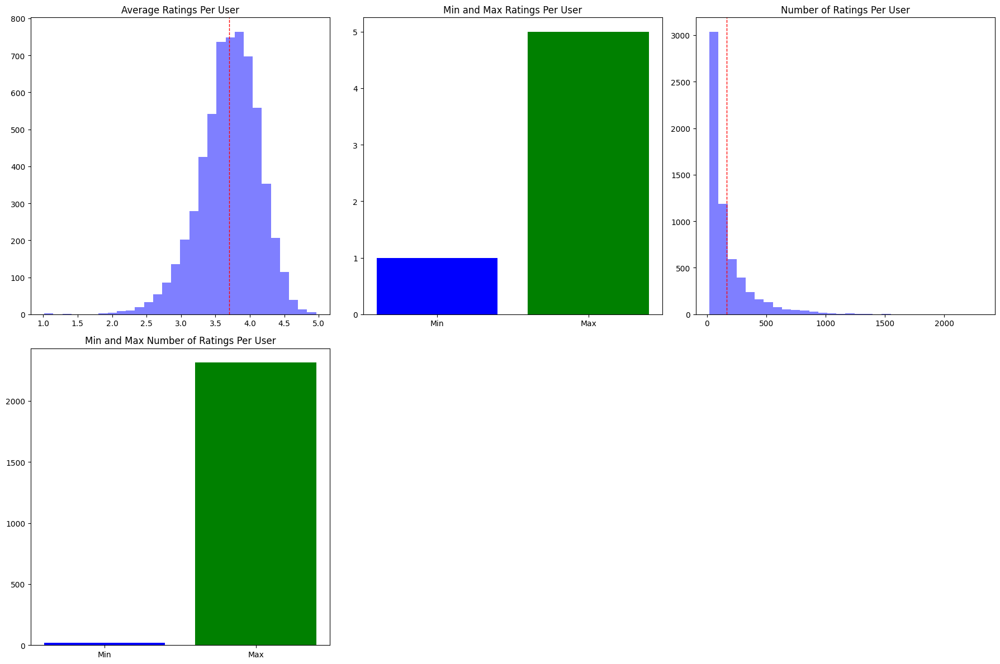

In [ ]:
# Merge user and rating datasets
userratings = users.merge(
    ratings
    .groupby('user_id', as_index=False)
    .agg({'rating': ['count', 'mean', 'min', 'max']}),
    on='user_id')

# Flatten the column names
userratings.columns = ['_'.join(col).strip('_') for col in userratings.columns.values]

# Calculate basic statistics
min_user_ratings = userratings['rating_min'].min()
max_user_ratings = userratings['rating_max'].max()
avg_user_ratings = userratings['rating_mean'].mean()

min_num_user_ratings = userratings['rating_count'].min()
max_num_user_ratings = userratings['rating_count'].max()
avg_num_user_ratings = userratings['rating_count'].mean()

# Create a figure with multiple subplots
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# Histogram for user ratings
axs[0, 0].hist(userratings['rating_mean'], bins=30, alpha=0.5, color='blue')
axs[0, 0].axvline(avg_user_ratings, color='red', linestyle='dashed', linewidth=1)
axs[0, 0].set_title('Average Ratings Per User')

# Bar plot for min and max user ratings
axs[0, 1].bar(['Min', 'Max'], [min_user_ratings, max_user_ratings], color=['blue', 'green'])
axs[0, 1].set_title('Min and Max Ratings Per User')

# Histogram for number of ratings per user
axs[0, 2].hist(userratings['rating_count'], bins=30, alpha=0.5, color='blue')
axs[0, 2].axvline(avg_num_user_ratings, color='red', linestyle='dashed', linewidth=1)
axs[0, 2].set_title('Number of Ratings Per User')

# Bar plot for min and max number of ratings per user
axs[1, 0].bar(['Min', 'Max'], [min_num_user_ratings, max_num_user_ratings], color=['blue', 'green'])
axs[1, 0].set_title('Min and Max Number of Ratings Per User')

# Remove extra subplots
axs[1, 1].axis('off')
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()

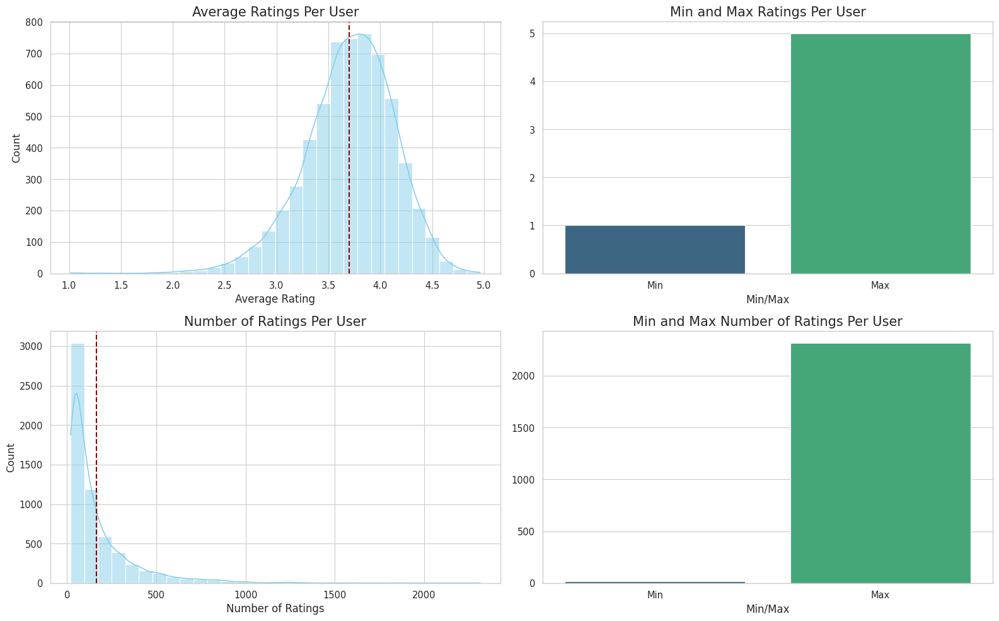

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(16, 10))

# Style using seaborn
sns.set_style("whitegrid")

# Histogram for user ratings
sns.histplot(userratings['rating_mean'], bins=30, ax=axs[0, 0], color='skyblue', kde=True)
axs[0, 0].axvline(avg_user_ratings, color='darkred', linestyle='dashed', linewidth=1.5)
axs[0, 0].set_title('Average Ratings Per User', fontsize=15)
axs[0, 0].set_xlabel('Average Rating', fontsize=12)

# Bar plot for min and max user ratings
sns.barplot(x=['Min', 'Max'], y=[min_user_ratings, max_user_ratings], ax=axs[0, 1], palette='viridis')
axs[0, 1].set_title('Min and Max Ratings Per User', fontsize=15)
axs[0, 1].set_xlabel('Min/Max', fontsize=12)

# Histogram for number of ratings per user
sns.histplot(userratings['rating_count'], bins=30, ax=axs[1, 0], color='skyblue', kde=True)
axs[1, 0].axvline(avg_num_user_ratings, color='darkred', linestyle='dashed', linewidth=1.5)
axs[1, 0].set_title('Number of Ratings Per User', fontsize=15)
axs[1, 0].set_xlabel('Number of Ratings', fontsize=12)

# Bar plot for min and max number of ratings per user
sns.barplot(x=['Min', 'Max'], y=[min_num_user_ratings, max_num_user_ratings], ax=axs[1, 1], palette='viridis')
axs[1, 1].set_title('Min and Max Number of Ratings Per User', fontsize=15)
axs[1, 1].set_xlabel('Min/Max', fontsize=12)

plt.tight_layout()
plt.show()


### 4.3 Explore Movies

In [ ]:
# Number of unique movies
num_movies = len(movies['movie_id'].unique())
print(f"Number of unique movies: {num_movies}")


Number of unique movies: 3883


In [ ]:
movies.head()

,movie_id,title,genres,year
0,0,Toy Story (1995),Animation|Children's|Comedy,1995
1,1,Jumanji (1995),Adventure|Children's|Fantasy,1995
2,2,Grumpier Old Men (1995),Comedy|Romance,1995
3,3,Waiting to Exhale (1995),Comedy|Drama,1995
4,4,Father of the Bride Part II (1995),Comedy,1995


In [ ]:
movies.describe()

,movie_id,year
count,3883.000,3883.000
mean,1985.049,1986.067
std,1146.778,16.896
min,0.000,1919.000
25%,981.500,1982.000
50%,2009.000,1994.000
75%,2979.500,1997.000
max,3951.000,2000.000


In [ ]:
moviesratings = movies.merge(
    ratings
    .groupby('movie_id', as_index=False)
    .agg({'rating': ['count', 'mean', 'min', 'max']}),
    on='movie_id')

# Flatten the column names
moviesratings.columns = ['_'.join(col).strip('_') for col in moviesratings.columns.values]


min_ratings = moviesratings['rating_min'].min()
max_ratings = moviesratings['rating_max'].max()
avg_ratings = moviesratings['rating_mean'].mean()

minnum_ratings = moviesratings['rating_count'].min()
maxnum_ratings = moviesratings['rating_count'].max()
avgnum_ratings = moviesratings['rating_count'].mean()

print(f"Minimum ratings received per movie: {min_ratings}")
print(f"Maximum ratings received per movie: {max_ratings}")
print(f"Average ratings received per movie: {avg_ratings}")

print(f"Minimum number of users rated per movie: {minnum_ratings}")
print(f"Maximum number of users rated per movie: {maxnum_ratings}")
print(f"Average number of users rated per movie: {avgnum_ratings}")


Minimum ratings received per movie: 1
Maximum ratings received per movie: 5
Average ratings received per movie: 3.2388921779108912
Minimum number of users rated per movie: 1
Maximum number of users rated per movie: 3428
Average number of users rated per movie: 269.88909875876953


<ipython-input-101-09f3a2b1543b>:1: FutureWarning:

merging between different levels is deprecated and will be removed in a future version. (1 levels on the left, 2 on the right)

<ipython-input-101-09f3a2b1543b>:1: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



In [ ]:
movies_ratings = movies.merge(
    ratings
    .groupby('movie_id', as_index=False)
    .agg({'rating': ['count', 'mean']})
    .flatten_cols(),
    on='movie_id')

genre_filter = alt.selection_multi(fields=['genre'])
genre_chart = alt.Chart().mark_bar().encode(
    x="count()",
    y=alt.Y('genre'),
    color=alt.condition(
        genre_filter,
        alt.Color("genre:N"),
        alt.value('lightgray'))
).properties(height=300, selection=genre_filter)

In [ ]:
# Movie from highest "rating count"

(movies_ratings[['title', 'rating count', 'rating mean']]
 .sort_values('rating count', ascending=False)
 .head(10))

,title,rating count,rating mean
2651,American Beauty (1999),3428,4.317
253,Star Wars: Episode IV - A New Hope (1977),2991,4.454
1106,Star Wars: Episode V - The Empire Strikes Back...,2990,4.293
1120,Star Wars: Episode VI - Return of the Jedi (1983),2883,4.023
466,Jurassic Park (1993),2672,3.764
1848,Saving Private Ryan (1998),2653,4.337
575,Terminator 2: Judgment Day (1991),2649,4.059
2374,"Matrix, The (1999)",2590,4.316
1178,Back to the Future (1985),2583,3.990
579,"Silence of the Lambs, The (1991)",2578,4.352


In [ ]:
# Movie from highest "rating mean"

(movies_ratings[['title', 'rating count', 'rating mean']]
 .mask('rating count', lambda x: x > 20)
 .sort_values('rating mean', ascending=False)
 .head(10))

,title,rating count,rating mean
2698,Sanjuro (1962),69,4.609
1839,Seven Samurai (The Magnificent Seven) (Shichin...,628,4.561
309,"Shawshank Redemption, The (1994)",2227,4.555
802,"Godfather, The (1972)",2223,4.525
708,"Close Shave, A (1995)",657,4.521
49,"Usual Suspects, The (1995)",1783,4.517
513,Schindler's List (1993),2304,4.510
1066,"Wrong Trousers, The (1993)",882,4.508
861,Sunset Blvd. (a.k.a. Sunset Boulevard) (1950),470,4.491
1108,Raiders of the Lost Ark (1981),2514,4.478


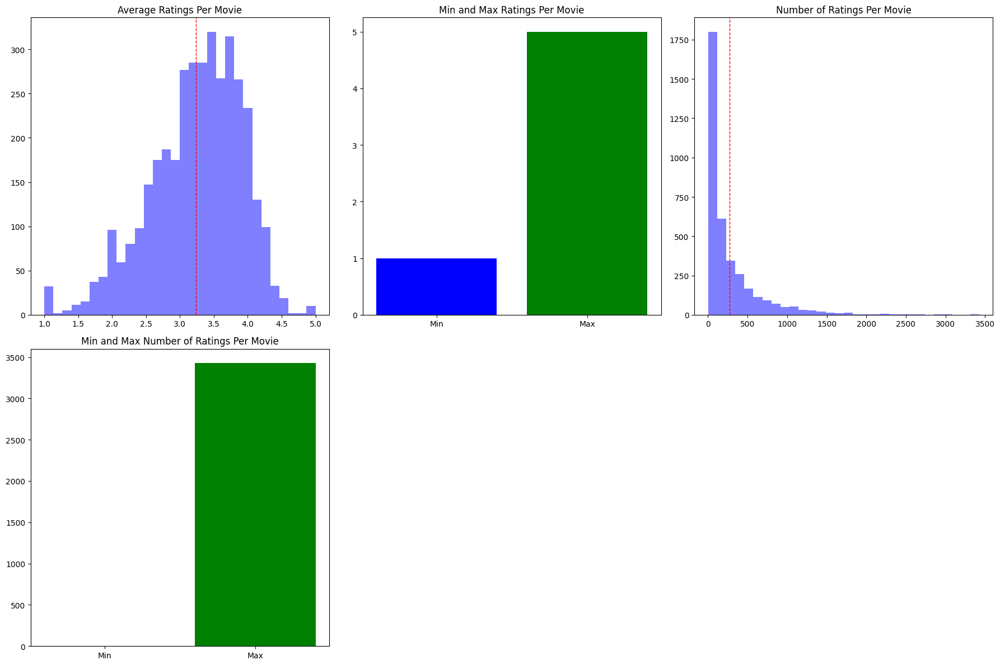

In [ ]:
# Display the number of ratings and average rating per movie.

# Create a figure with multiple subplots
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# Histogram for ratings
axs[0, 0].hist(moviesratings['rating_mean'], bins=30, alpha=0.5, color='blue')
axs[0, 0].axvline(avg_ratings, color='red', linestyle='dashed', linewidth=1)
axs[0, 0].set_title('Average Ratings Per Movie')

# Bar plot for min and max ratings
axs[0, 1].bar(['Min', 'Max'], [min_ratings, max_ratings], color=['blue', 'green'])
axs[0, 1].set_title('Min and Max Ratings Per Movie')

# Histogram for number of ratings
axs[0, 2].hist(moviesratings['rating_count'], bins=30, alpha=0.5, color='blue')
axs[0, 2].axvline(avgnum_ratings, color='red', linestyle='dashed', linewidth=1)
axs[0, 2].set_title('Number of Ratings Per Movie')

# Bar plot for min and max number of ratings
axs[1, 0].bar(['Min', 'Max'], [minnum_ratings, maxnum_ratings], color=['blue', 'green'])
axs[1, 0].set_title('Min and Max Number of Ratings Per Movie')

# Remove extra subplots
axs[1, 1].axis('off')
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()



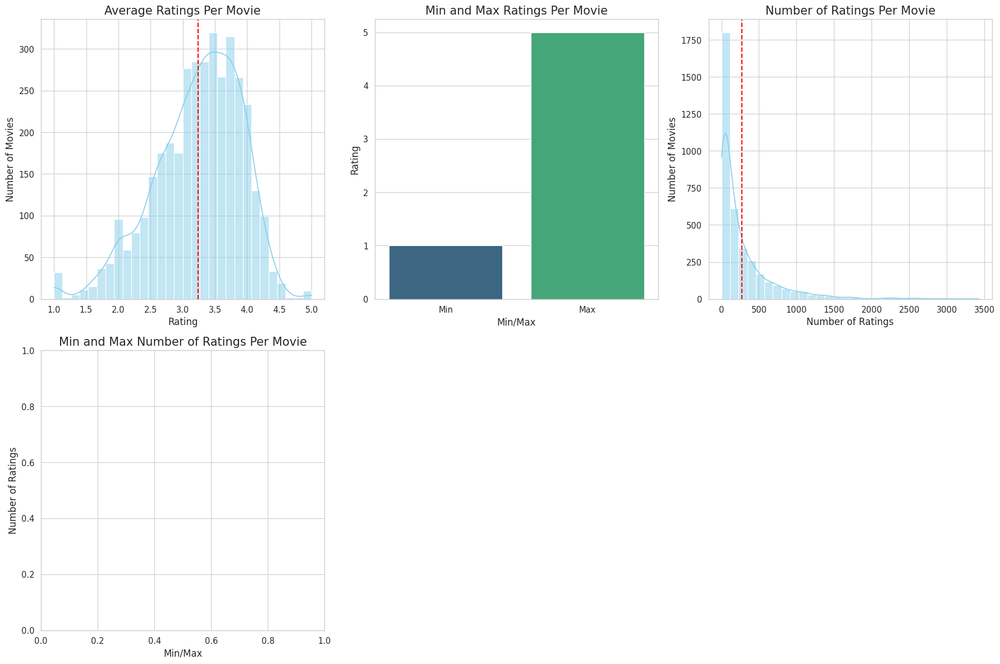

In [ ]:
import seaborn as sns  # Using seaborn for a better looking plot

# Seaborn settings for a better looking plot
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=1.2)  # Adjust the font size

fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# Histogram for ratings
sns.histplot(moviesratings['rating_mean'], bins=30, ax=axs[0, 0], color='skyblue', kde=True)
axs[0, 0].axvline(avg_ratings, color='red', linestyle='dashed', linewidth=1.5)
axs[0, 0].set_title('Average Ratings Per Movie', fontsize=15)
axs[0, 0].set_xlabel('Rating', fontsize=12)
axs[0, 0].set_ylabel('Number of Movies', fontsize=12)

# Bar plot for min and max ratings
sns.barplot(x=['Min', 'Max'], y=[min_ratings, max_ratings], ax=axs[0, 1], palette='viridis')
axs[0, 1].set_title('Min and Max Ratings Per Movie', fontsize=15)
axs[0, 1].set_xlabel('Min/Max', fontsize=12)
axs[0, 1].set_ylabel('Rating', fontsize=12)

# Histogram for number of ratings
sns.histplot(moviesratings['rating_count'], bins=30, ax=axs[0, 2], color='skyblue', kde=True)
axs[0, 2].axvline(avgnum_ratings, color='red', linestyle='dashed', linewidth=1.5)
axs[0, 2].set_title('Number of Ratings Per Movie', fontsize=15)
axs[0, 2].set_xlabel('Number of Ratings', fontsize=12)
axs[0, 2].set_ylabel('Number of Movies', fontsize=12)

# Bar plot for min and max number of ratings
sns.barplot(x=['Min', 'Max'], y=[min_ratings, max_ratings], ax=axs[0, 1], palette='viridis')
axs[1, 0].set_title('Min and Max Number of Ratings Per Movie', fontsize=15)
axs[1, 0].set_xlabel('Min/Max', fontsize=12)
axs[1, 0].set_ylabel('Number of Ratings', fontsize=12)

# Remove extra subplots
axs[1, 1].axis('off')
axs[1, 2].axis('off')

plt.tight_layout()
plt.savefig("plot.png", dpi=300)  # Save the figure in high resolution
plt.show()


<ipython-input-31-6be5df397f72>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


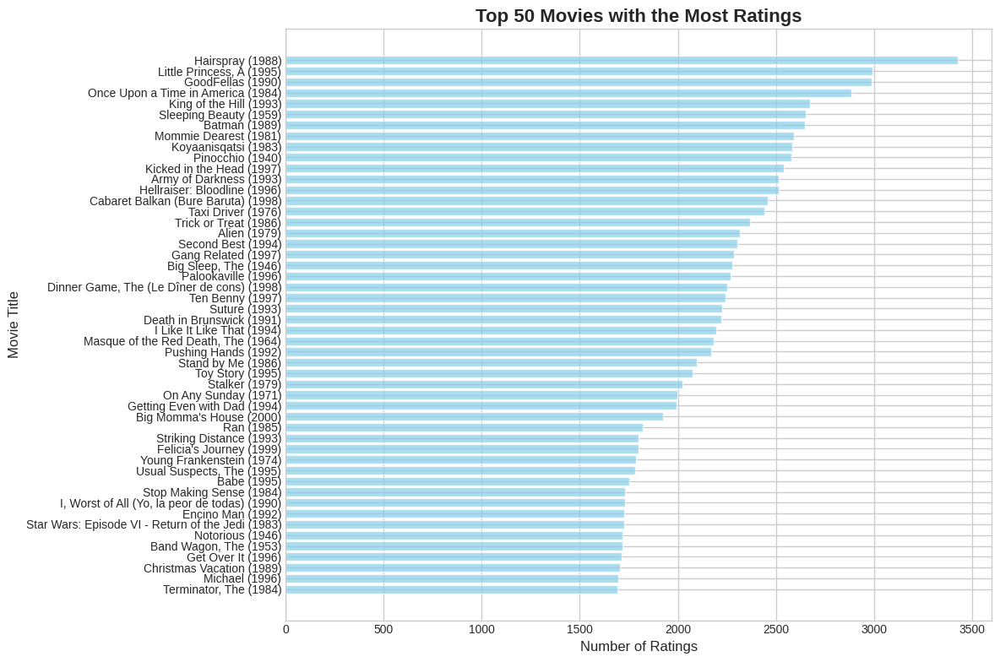

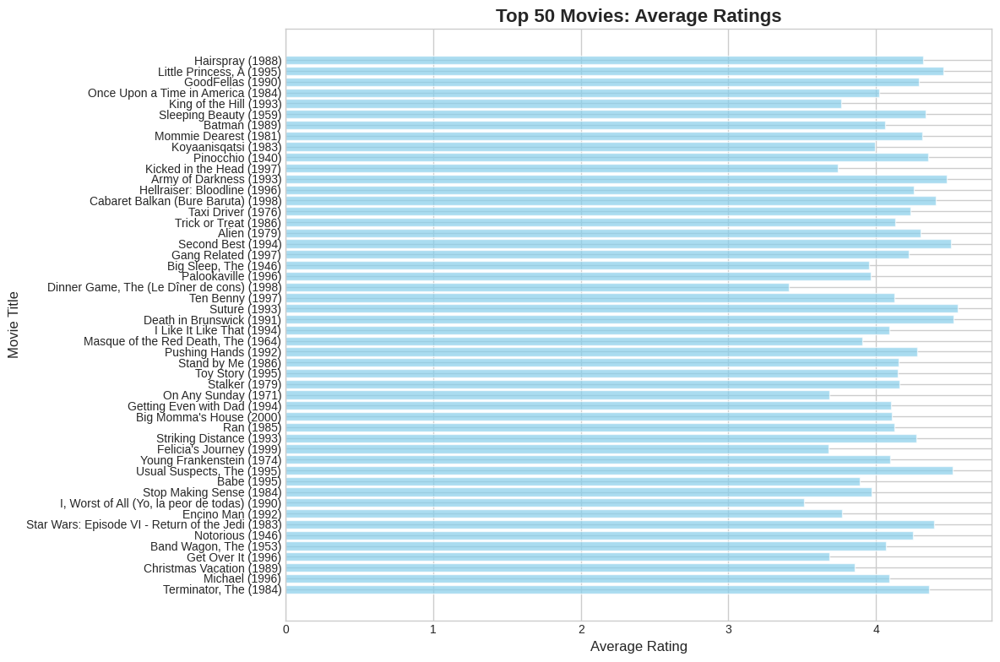

In [ ]:
import matplotlib.pyplot as plt

# Set the style
plt.style.use('seaborn-whitegrid')

# Get the top 50 movies with the most ratings
top_rated_movies = ratings['movie_id'].value_counts().nlargest(50)

# Get the movie titles and average ratings
top_movie_titles = movies.loc[top_rated_movies.index]['title']
average_ratings = ratings.groupby('movie_id')['rating'].mean().loc[top_rated_movies.index]

# Plotting the results
plt.figure(figsize=(12, 8))
plt.barh(top_movie_titles, top_rated_movies, color='skyblue', alpha=0.7)
plt.xlabel('Number of Ratings', fontsize=12)
plt.ylabel('Movie Title', fontsize=12)
plt.title('Top 50 Movies with the Most Ratings', fontsize=16, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Plotting the average ratings
plt.figure(figsize=(12, 8))
plt.barh(top_movie_titles, average_ratings, color='skyblue', alpha=0.7)
plt.xlabel('Average Rating', fontsize=12)
plt.ylabel('Movie Title', fontsize=12)
plt.title('Top 50 Movies: Average Ratings', fontsize=16, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()







### 4.4 Overall Exploration

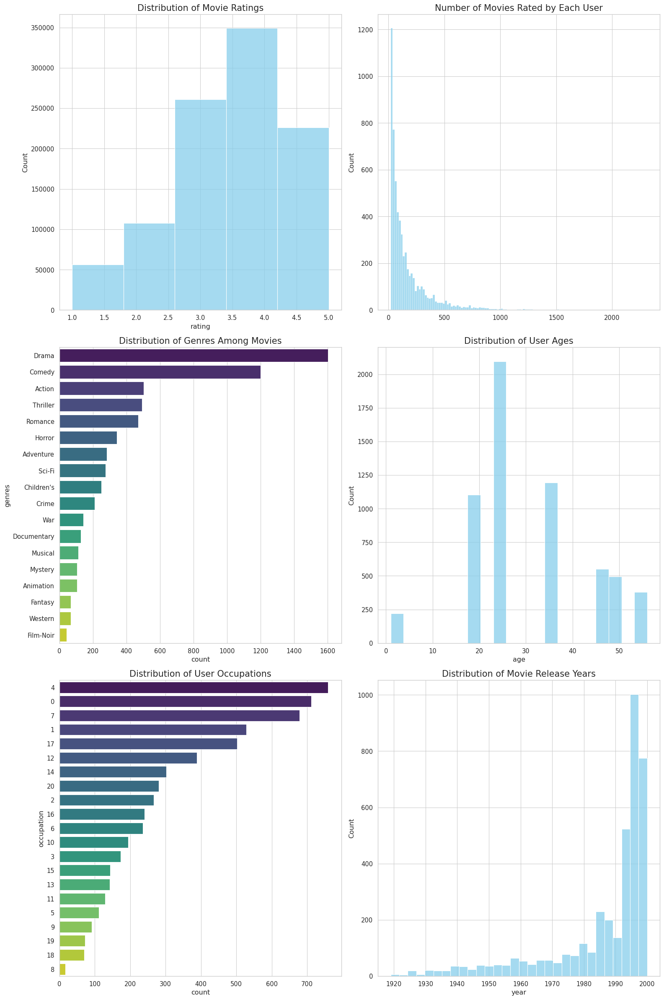

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set_style('whitegrid')

# Create a figure with multiple subplots
fig, axs = plt.subplots(3, 2, figsize=(16, 24))

# Histogram of movie ratings
sns.histplot(data=ratings, x="rating", bins=5, ax=axs[0, 0], color='skyblue')
axs[0, 0].set_title('Distribution of Movie Ratings', fontsize=15)

# Histogram of the number of movies rated by each user
num_ratings_per_user = ratings.groupby('user_id').size()
sns.histplot(num_ratings_per_user, ax=axs[0, 1], color='skyblue')
axs[0, 1].set_title('Number of Movies Rated by Each User', fontsize=15)

# Bar plot of movie genres
movies['genres'] = movies['genres'].str.split('|')
genres = movies.explode('genres')
sns.countplot(y='genres', data=genres, order = genres['genres'].value_counts().index, ax=axs[1, 0], palette='viridis')
axs[1, 0].set_title('Distribution of Genres Among Movies', fontsize=15)

# Histogram of user ages
sns.histplot(data=users, x="age", bins=20, ax=axs[1, 1], color='skyblue')
axs[1, 1].set_title('Distribution of User Ages', fontsize=15)

# Bar plot of user occupations
sns.countplot(y='occupation', data=users, order = users['occupation'].value_counts().index, ax=axs[2, 0], palette='viridis')
axs[2, 0].set_title('Distribution of User Occupations', fontsize=15)

# Histogram of movie release years
sns.histplot(data=movies, x="year", bins=30, ax=axs[2, 1], color='skyblue')
axs[2, 1].set_title('Distribution of Movie Release Years', fontsize=15)

plt.tight_layout()
plt.show()


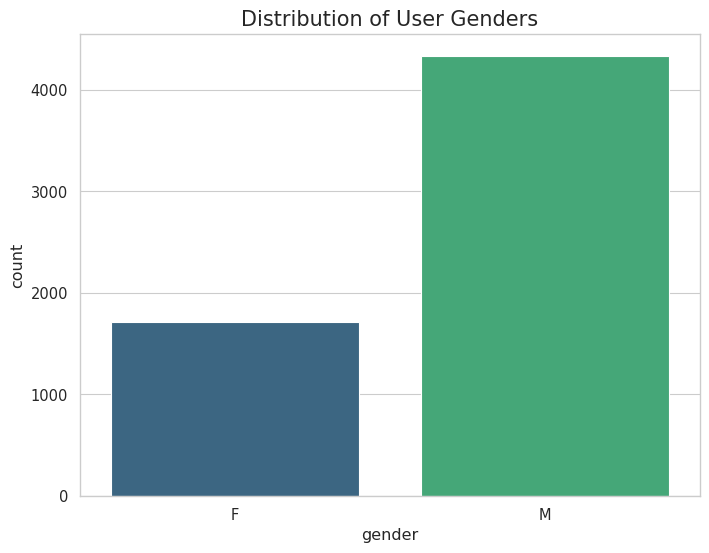

In [ ]:
# Bar plot of user genders
plt.figure(figsize=(8,6))
sns.countplot(x='gender', data=users, palette='viridis')
plt.title('Distribution of User Genders', fontsize=15)
plt.show()


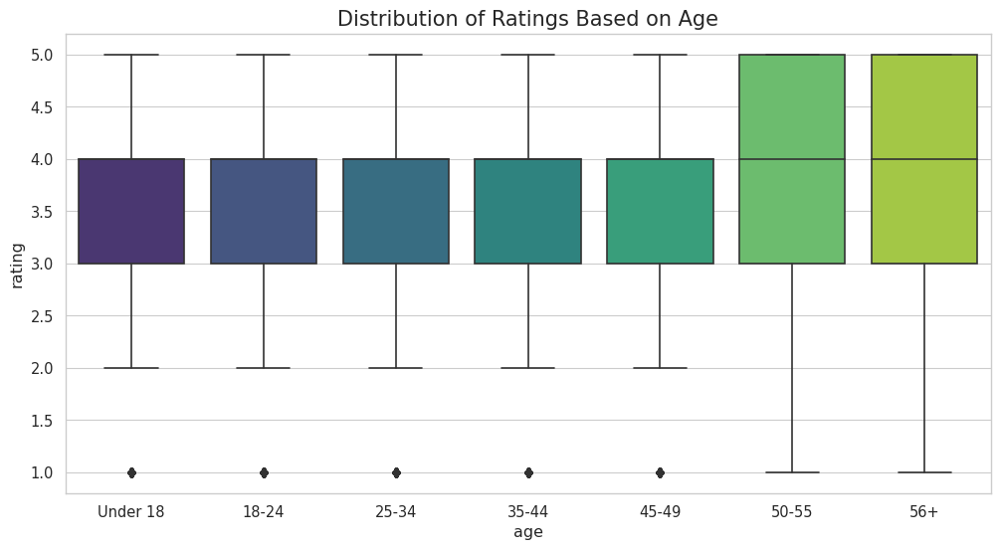

In [ ]:
# First, merge the ratings and users dataframes based on 'user_id'
data = pd.merge(ratings, users, on='user_id')

# Now, plot
plt.figure(figsize=(12,6))
sns.boxplot(x='age', y='rating', data=data, palette='viridis')
plt.title('Distribution of Ratings Based on Age', fontsize=15)
plt.xticks(ticks=range(7), labels=['Under 18', '18-24', '25-34', '35-44', '45-49', '50-55', '56+'])
plt.show()


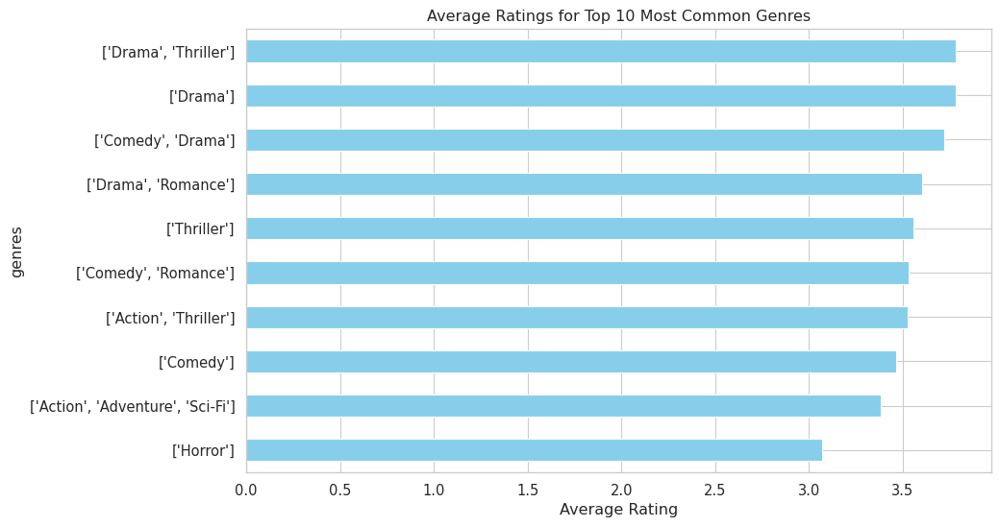

In [ ]:
# Explode the dataframe on 'genres' column
exploded_data = data.explode('genres')

# Count the occurrences of each genre
genre_counts = exploded_data['genres'].value_counts()

# Get the 10 most common genres
top_genres = genre_counts.nlargest(10).index

# Filter the data to include only these genres
filtered_data = exploded_data[exploded_data['genres'].isin(top_genres)]

# Calculate average ratings
avg_ratings = filtered_data.groupby('genres')['rating'].mean().sort_values()

# Now, plot a horizontal bar chart
plt.figure(figsize=(10,6))
avg_ratings.plot(kind='barh', color='skyblue')
plt.xlabel('Average Rating')
plt.title('Average Ratings for Top 10 Most Common Genres')
plt.show()


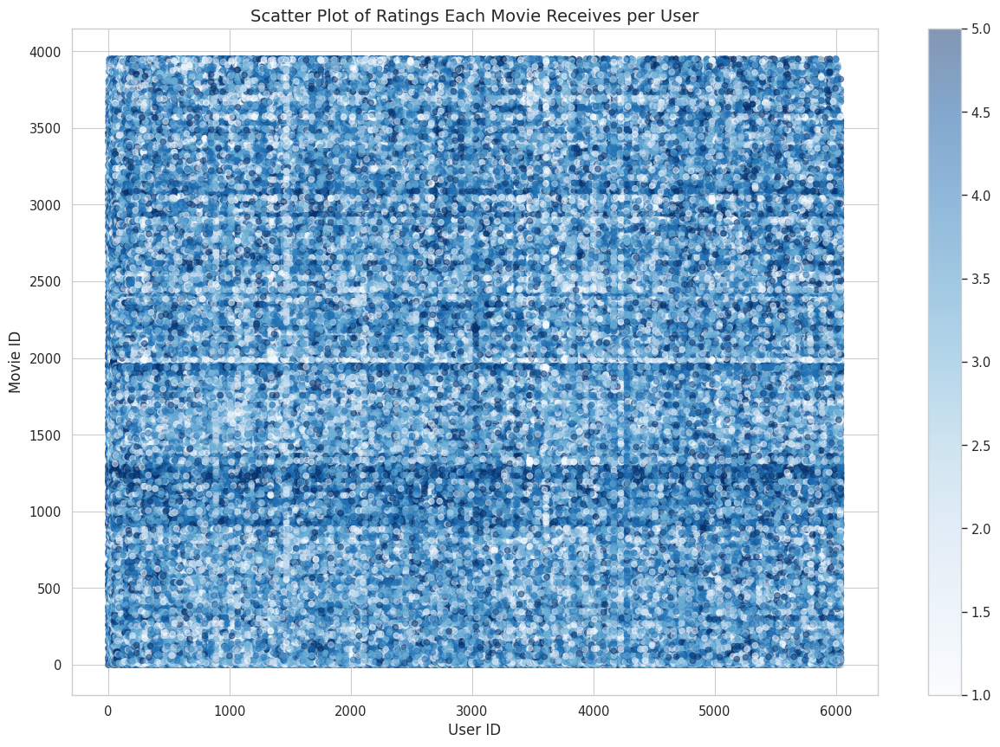

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the size of the plot
plt.figure(figsize=(15,10))

# Create the scatter plot
scatter = plt.scatter(data['user_id'], data['movie_id'], c=data['rating'], cmap='Blues', alpha=0.5)

# Create a colorbar
plt.colorbar(scatter)

# Set the title and labels
plt.title('Scatter Plot of Ratings Each Movie Receives per User', fontsize=14)
plt.xlabel('User ID', fontsize=12)
plt.ylabel('Movie ID', fontsize=12)

# Show the plot
plt.show()



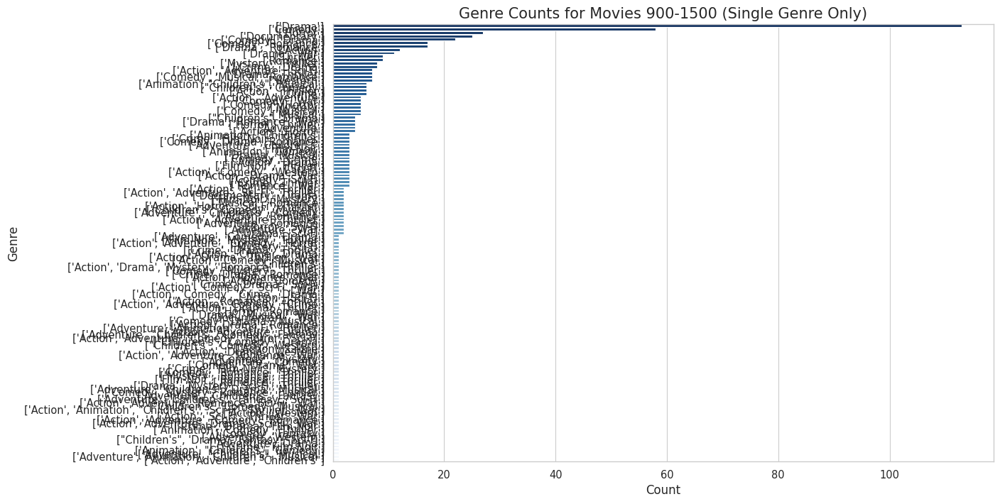

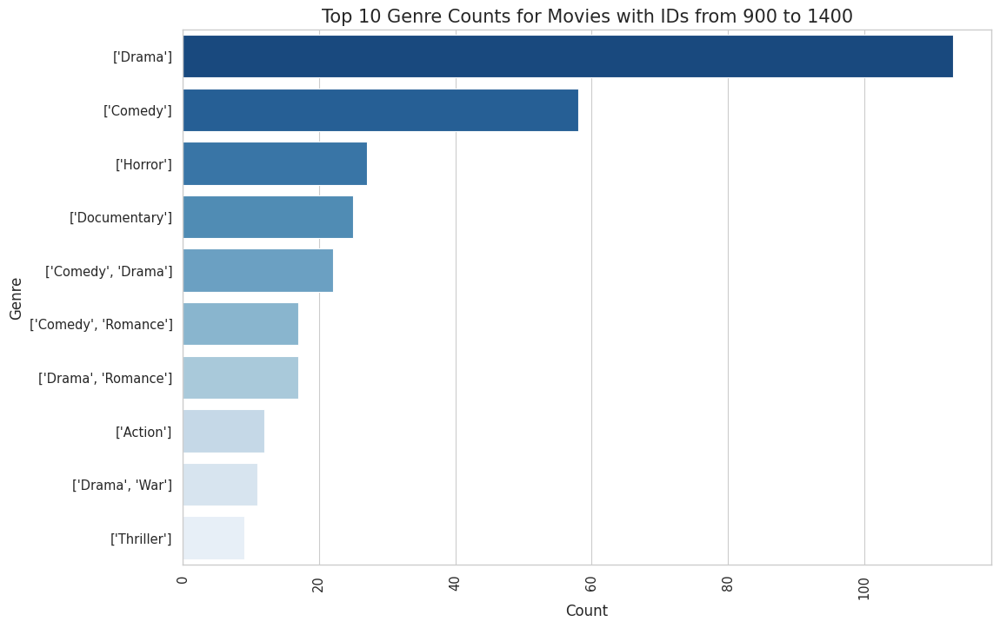

In [ ]:
# Ensure genres is string type
filtered_movies['genres'] = filtered_movies['genres'].astype(str)

# Split the genres by '|', expand them into separate columns, and take just the first column
filtered_movies['single_genre'] = filtered_movies['genres'].str.split('|', expand=True)[0]

# Count each single_genre
single_genre_counts = filtered_movies['single_genre'].value_counts()

# Plot the counts
plt.figure(figsize=(12, 8))
sns.barplot(y=single_genre_counts.index, x=single_genre_counts.values, palette='Blues_r')
plt.title('Genre Counts for Movies 900-1500 (Single Genre Only)', fontsize=15)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.show()

# Limit the genre_counts Series to the first 10 entries
top_10_genre_counts = genre_counts.iloc[:10]

# Plot the counts
plt.figure(figsize=(12, 8))
sns.barplot(y=top_10_genre_counts.index, x=top_10_genre_counts.values, palette='Blues_r')
plt.title('Top 10 Genre Counts for Movies with IDs from 900 to 1400', fontsize=15)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.xticks(rotation=90)
plt.show()





# **Step5: Model Training (Without Privacy)**

### 5.1 Import Libraries & Split Data

#### 5.1.1 TensorFlow Import

In [ ]:
# TF Import
from tensorflow.keras.layers import Input, Dense, Embedding, Flatten, \
  Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam
from keras.models import Model

from tensorflow.keras.layers import Input, Embedding, Flatten, Dense, Concatenate, BatchNormalization
from keras import regularizers
from keras.callbacks import EarlyStopping

from sklearn.utils import shuffle

#### 5.1.2 Split Data
- Train Dataset (80%)
- Validation Dataset (10%)
- Test Dataset (10%)

In [ ]:
# Get user IDs, movie IDs, and ratings as separate arrays

user_ids = ratings['user_id'].values
movie_ids = ratings['movie_id'].values
new_ratings = ratings['rating'].values

In [ ]:
# Get number of users and number of movies

N = len(set(user_ids))
M = len(set(movie_ids))

In [ ]:
print(user_ids)
print(movie_ids)
print(new_ratings)

print(N)
print(M)

[   0    0    0 ... 6039 6039 6039]
[1192  660  913 ...  561 1095 1096]
[5 3 3 ... 5 4 4]
6040
3706


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [ ]:
# split the data (Train 80%, Val 10, Test 10%)

# Split the data into train (80%) and a temporary set (20%)
train_user, temp_user, train_movie, temp_movie, train_ratings, temp_ratings = train_test_split(
    user_ids, movie_ids, new_ratings, test_size=0.2, random_state=42)

# Split the temporary set evenly into validation (10%) and test (10%) sets
val_user, test_user, val_movie, test_movie, val_ratings, test_ratings = train_test_split(
    temp_user, temp_movie, temp_ratings, test_size=0.5, random_state=42)


# Training set: train_user_id, train_movie_id, train_ratings
# Validation set: val_user_id, val_movie_id, val_ratings
# Test set: test_user_id, test_movie_id, test_ratings


In [ ]:
# Assuming train_ratings, val_ratings, and test_ratings are arrays of ratings from 1 to 5
num_classes = 5

train_ratings_one_hot = np.array(train_ratings, dtype=int)
val_ratings_one_hot = np.array(val_ratings, dtype=int)

train_ratings_one_hot = np.eye(num_classes)[train_ratings_one_hot - 1]
val_ratings_one_hot = np.eye(num_classes)[val_ratings_one_hot - 1]

test_ratings_one_hot = np.array(test_ratings, dtype=int)
test_ratings_one_hot = np.eye(num_classes)[test_ratings_one_hot - 1]

In [ ]:
print(train_ratings_one_hot)
print(train_ratings_one_hot.shape)
print(val_ratings_one_hot.shape)
print(test_ratings_one_hot.shape)

[[0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 ...
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0.]]
(800167, 5)
(100021, 5)
(100021, 5)


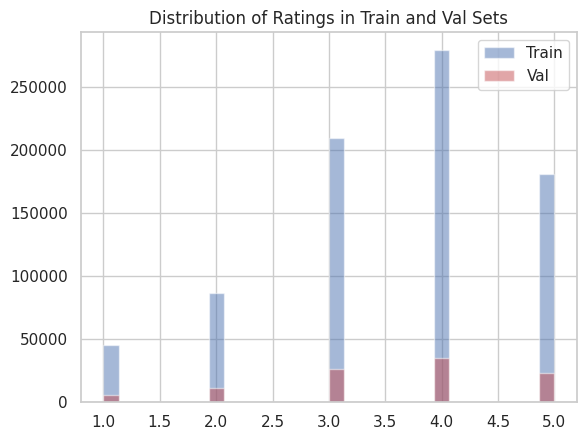

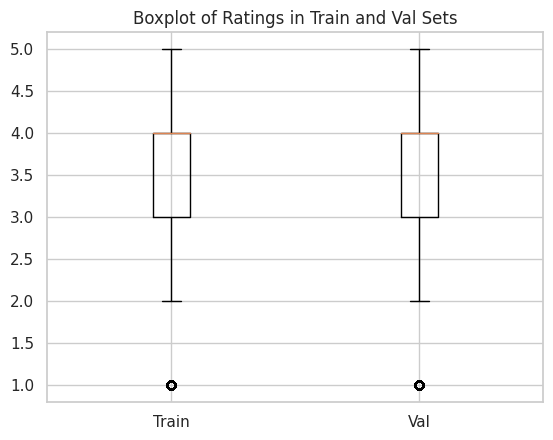

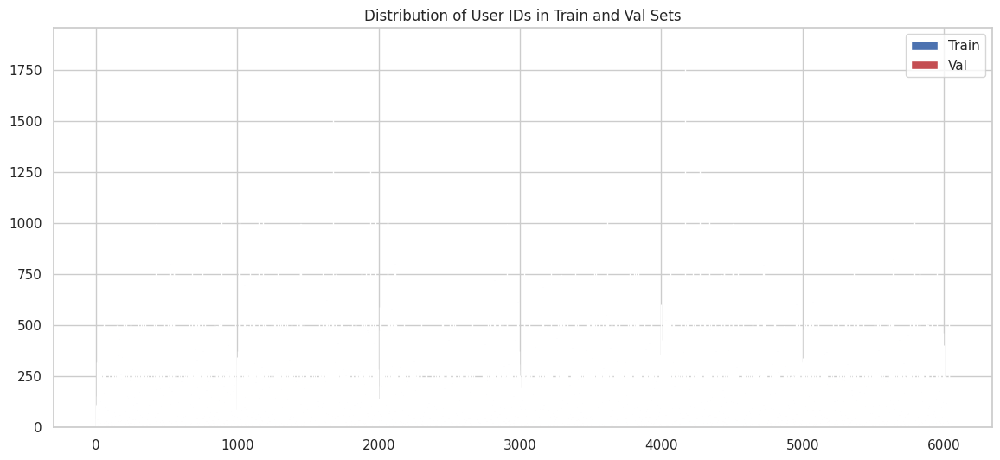

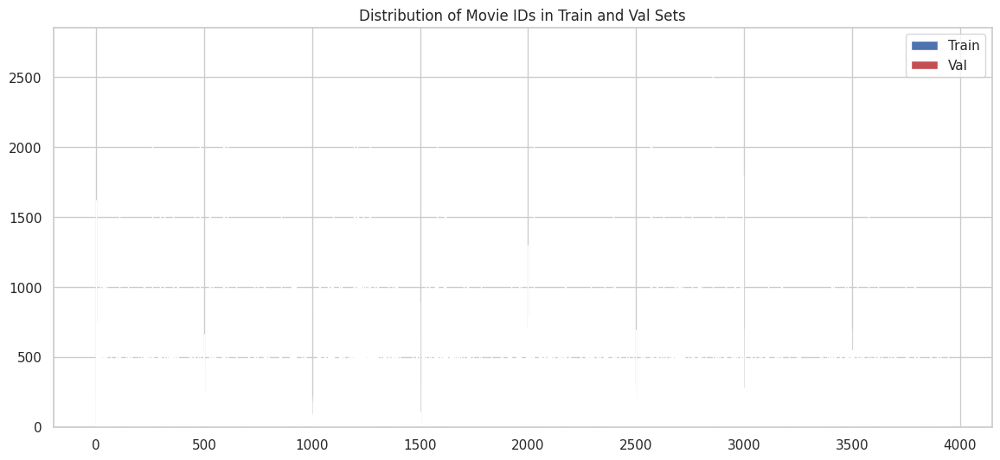

In [ ]:
# Visualize "train" & "test" data

import matplotlib.pyplot as plt
import numpy as np

# Convert the user, movie, and rating lists to numpy arrays
train_user = np.array(train_user)
val_user = np.array(val_user)
train_movie = np.array(train_movie)
val_movie = np.array(val_movie)
train_ratings = np.array(train_ratings)
val_ratings = np.array(val_ratings)

# Define function to plot histograms
def plot_histograms(train_data, val_data, title):
    plt.hist(train_data, bins=30, alpha=0.5, color='b', label='Train')
    plt.hist(val_data, bins=30, alpha=0.5, color='r', label='Val')
    plt.title(title)
    plt.legend()
    plt.show()

# Define function to plot boxplots
def plot_boxplots(train_data, val_data, title):
    plt.boxplot([train_data, val_data], labels=['Train', 'Val'])
    plt.title(title)
    plt.show()

# Ratings
plot_histograms(train_ratings, val_ratings, 'Distribution of Ratings in Train and Val Sets')
plot_boxplots(train_ratings, val_ratings, 'Boxplot of Ratings in Train and Val Sets')

# Users
unique_train_user, counts_train_user = np.unique(train_user, return_counts=True)
unique_val_user, counts_val_user = np.unique(val_user, return_counts=True)

plt.figure(figsize=(14, 6))
plt.bar(unique_train_user, counts_train_user, color='b', label='Train')
plt.bar(unique_val_user, counts_val_user, color='r', label='Val')
plt.title('Distribution of User IDs in Train and Val Sets')
plt.legend()
plt.show()

# Movies
unique_train_movie, counts_train_movie = np.unique(train_movie, return_counts=True)
unique_val_movie, counts_val_movie = np.unique(val_movie, return_counts=True)

plt.figure(figsize=(14, 6))
plt.bar(unique_train_movie, counts_train_movie, color='b', label='Train')
plt.bar(unique_val_movie, counts_val_movie, color='r', label='Val')
plt.title('Distribution of Movie IDs in Train and Val Sets')
plt.legend()
plt.show()


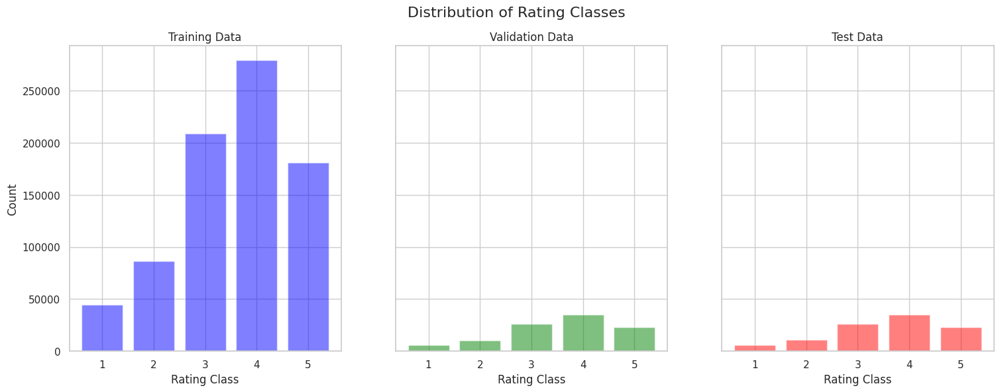

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np

# Convert the one-hot encoded ratings back to their original classes
train_ratings_class = np.argmax(train_ratings_one_hot, axis=1) + 1
val_ratings_class = np.argmax(val_ratings_one_hot, axis=1) + 1
test_ratings_class = np.argmax(test_ratings_one_hot, axis=1) + 1

# Create a figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Set the title of the figure
fig.suptitle('Distribution of Rating Classes', fontsize=16)

# Create histograms for training, validation, and test datasets
axs[0].hist(train_ratings_class, bins=np.arange(1,7)-0.5, rwidth=0.8, alpha=0.5, color='blue')
axs[0].set_title('Training Data')
axs[0].set_xlabel('Rating Class')
axs[0].set_ylabel('Count')

axs[1].hist(val_ratings_class, bins=np.arange(1,7)-0.5, rwidth=0.8, alpha=0.5, color='green')
axs[1].set_title('Validation Data')
axs[1].set_xlabel('Rating Class')

axs[2].hist(test_ratings_class, bins=np.arange(1,7)-0.5, rwidth=0.8, alpha=0.5, color='red')
axs[2].set_title('Test Data')
axs[2].set_xlabel('Rating Class')

# Show the plots
plt.show()


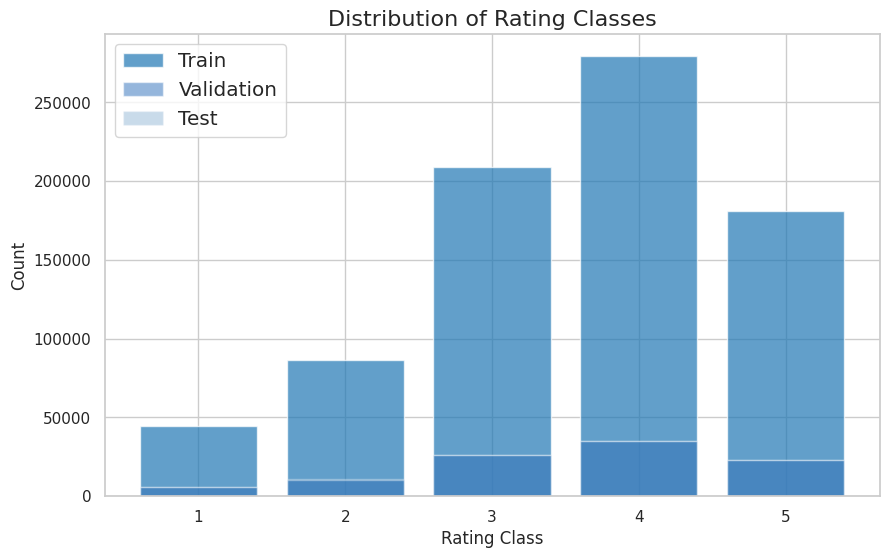

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Convert the one-hot encoded ratings back to their original classes
train_ratings_class = np.argmax(train_ratings_one_hot, axis=1) + 1
val_ratings_class = np.argmax(val_ratings_one_hot, axis=1) + 1
test_ratings_class = np.argmax(test_ratings_one_hot, axis=1) + 1

# Set Seaborn style
sns.set(style='whitegrid')

# Create a figure
plt.figure(figsize=(10, 6))

# Create histograms for training, validation, and test datasets
plt.hist(train_ratings_class, bins=np.arange(1,7)-0.5, rwidth=0.8, alpha=0.7, color='#1f77b4', label='Train')
plt.hist(val_ratings_class, bins=np.arange(1,7)-0.5, rwidth=0.8, alpha=0.5, color='#2c6fbb', label='Validation')
plt.hist(test_ratings_class, bins=np.arange(1,7)-0.5, rwidth=0.8, alpha=0.3, color='#4d88bb', label='Test')

# Add labels and title
plt.title('Distribution of Rating Classes', fontsize=16)
plt.xlabel('Rating Class', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Show legend
plt.legend(loc='upper left', fontsize='large')

# Show the plot
plt.show()


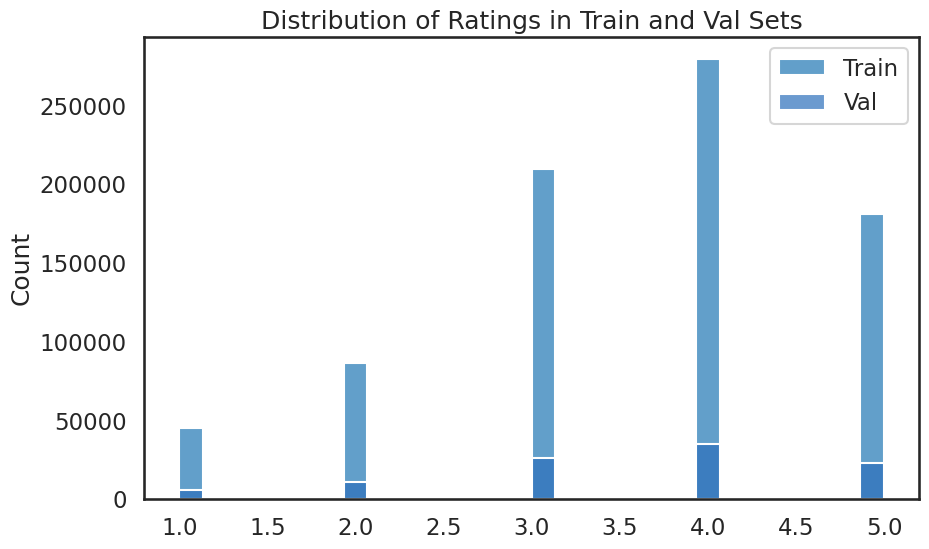

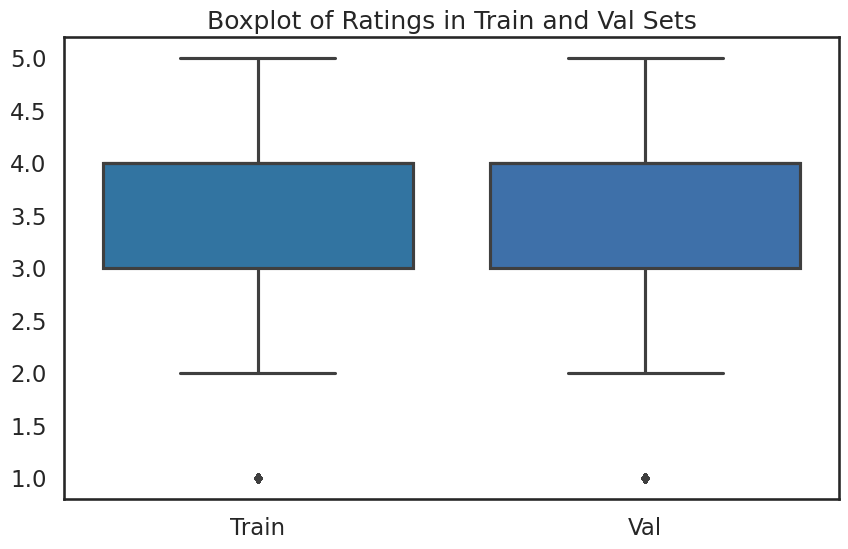

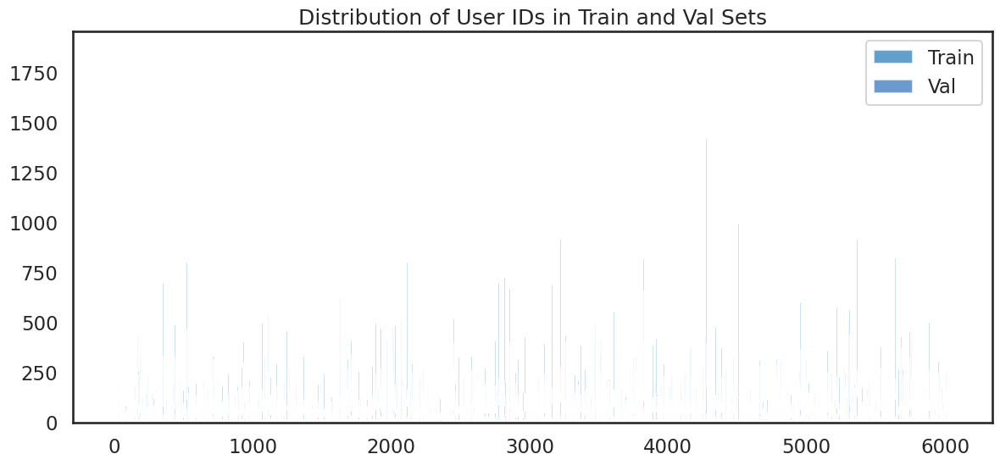

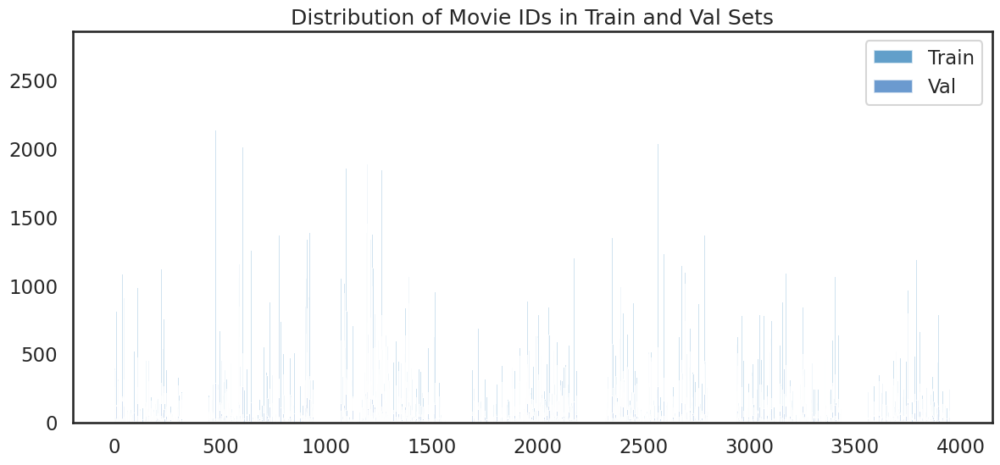

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set seaborn style to white with talk context for larger and more visible fonts
sns.set(style='white', context='talk')

# Define color palette
train_color = "#1f77b4"
val_color = "#2c6fbb"

# Convert the user, movie, and rating lists to numpy arrays
train_user = np.array(train_user)
val_user = np.array(val_user)
train_movie = np.array(train_movie)
val_movie = np.array(val_movie)
train_ratings = np.array(train_ratings)
val_ratings = np.array(val_ratings)

# Define function to plot histograms
def plot_histograms(train_data, val_data, title):
    plt.figure(figsize=(10, 6))
    sns.histplot(train_data, bins=30, color=train_color, label='Train', alpha=0.7)
    sns.histplot(val_data, bins=30, color=val_color, label='Val', alpha=0.7)
    plt.title(title)
    plt.legend()
    plt.show()

# Define function to plot boxplots
def plot_boxplots(train_data, val_data, title):
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=[train_data, val_data], palette=[train_color, val_color])
    plt.xticks([0, 1], ['Train', 'Val'])
    plt.title(title)
    plt.show()

# Ratings
plot_histograms(train_ratings, val_ratings, 'Distribution of Ratings in Train and Val Sets')
plot_boxplots(train_ratings, val_ratings, 'Boxplot of Ratings in Train and Val Sets')

# Users
unique_train_user, counts_train_user = np.unique(train_user, return_counts=True)
unique_val_user, counts_val_user = np.unique(val_user, return_counts=True)

plt.figure(figsize=(14, 6))
plt.bar(unique_train_user, counts_train_user, color=train_color, alpha=0.7, label='Train')
plt.bar(unique_val_user, counts_val_user, color=val_color, alpha=0.7, label='Val')
plt.title('Distribution of User IDs in Train and Val Sets')
plt.legend()
plt.show()

# Movies
unique_train_movie, counts_train_movie = np.unique(train_movie, return_counts=True)
unique_val_movie, counts_val_movie = np.unique(val_movie, return_counts=True)

plt.figure(figsize=(14, 6))
plt.bar(unique_train_movie, counts_train_movie, color=train_color, alpha=0.7, label='Train')
plt.bar(unique_val_movie, counts_val_movie, color=val_color, alpha=0.7, label='Val')
plt.title('Distribution of Movie IDs in Train and Val Sets')
plt.legend()
plt.show()


### 5.2 Model Parameter & Architecture (without privacy)

Training with Standard DL Model (Keras + Softmax)

Hyperparameters:
- Learning rate
- Number of iterations
- Input embedding dimensions (the input_dims argument)
- Number of hidden layers
- Size of each layer (the hidden_dims argument)

In [ ]:
from tensorflow.keras.layers import Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import RMSprop
from keras.layers import LeakyReLU
from tensorflow.keras import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Embedding, Flatten
from tensorflow.keras import Input

import warnings
warnings.filterwarnings('ignore')

1) Set Hyperparameters

In [ ]:
# Hyperparameters

K = 64  # embedding dimension
reg_strength = 0.01  # Regularization strength
dropout_rate = 0.2
learning_rate = 0.0001
epochs = 40
batch_size = 10000

2) Create "embedding" & "input" layers

In [ ]:
# Determine the maximum user ID and movie ID
max_user_id = max(max(train_user), max(val_user))
max_movie_id = max(max(train_movie), max(val_movie))

# User embedding
user_input = Input(shape=(1,))
user_embedding = Embedding(max_user_id + 1, K)(user_input)
user_embedding = Flatten()(user_embedding)

# Movie embedding
movie_input = Input(shape=(1,))
movie_embedding = Embedding(max_movie_id + 1, K)(movie_input)
movie_embedding = Flatten()(movie_embedding)

# Concatenate user-movie embeddings into a feature vector
x = Concatenate()([user_embedding, movie_embedding])


3) Model Architecture (No Privacy)

In [ ]:
## ----- Build DLRS (no privacy) ------------

# Model architecture

x = Dense(64, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
x = Dropout(dropout_rate)(x)  # Add Dropout after Dense layer
x = BatchNormalization()(x)
x = Dense(32, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
x = Dropout(dropout_rate)(x)  # Add Dropout after Dense layer
x = BatchNormalization()(x)
x = Dense(8, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
x = Dropout(dropout_rate)(x)  # Add Dropout after Dense layer
x = BatchNormalization()(x)
x = Dense(5, activation='softmax')(x) # Softmax for multiclass classification

# Build the model and compile it
model = Model(inputs=[user_input, movie_input], outputs=x)

model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate= learning_rate),
    metrics=['accuracy']
)


# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

### 5.3 Model Training (Model Fit)

#### 1) Epochs = 40

In [ ]:
## Load Saved Model

#1) Load Model
model = load_model('/content/gdrive/My Drive/DLRS.h5')

#2) Load Weights
model.load_weights('/content/gdrive/My Drive/DLRS_weights.h5')

#3) Load Training History
DLRS = pd.read_json('/content/gdrive/My Drive/baseDLRS_training.json')

In [ ]:
# Fit the model
DLRSe40 = model.fit(
    x=[train_user, train_movie],
    y=train_ratings_one_hot,
    epochs= 40,
    batch_size = batch_size,
    validation_data=([val_user, val_movie], val_ratings_one_hot),
)

Epoch 1/40
81/81 [==============================] - 28s 289ms/step - loss: 3.2707 - accuracy: 0.2179 - val_loss: 2.9108 - val_accuracy: 0.3482
Epoch 2/40
81/81 [==============================] - 11s 131ms/step - loss: 3.0527 - accuracy: 0.2442 - val_loss: 2.8176 - val_accuracy: 0.3482
Epoch 3/40
81/81 [==============================] - 6s 81ms/step - loss: 2.8705 - accuracy: 0.2659 - val_loss: 2.7130 - val_accuracy: 0.3482
Epoch 4/40
81/81 [==============================] - 3s 34ms/step - loss: 2.7111 - accuracy: 0.2873 - val_loss: 2.6004 - val_accuracy: 0.3491
Epoch 5/40
81/81 [==============================] - 3s 34ms/step - loss: 2.5709 - accuracy: 0.3056 - val_loss: 2.4831 - val_accuracy: 0.3523
Epoch 6/40
81/81 [==============================] - 2s 26ms/step - loss: 2.4435 - accuracy: 0.3239 - val_loss: 2.3677 - val_accuracy: 0.3599
Epoch 7/40
81/81 [==============================] - 2s 31ms/step - loss: 2.3295 - accuracy: 0.3381 - val_loss: 2.2561 - val_accuracy: 0.3727
Epoch 8/4

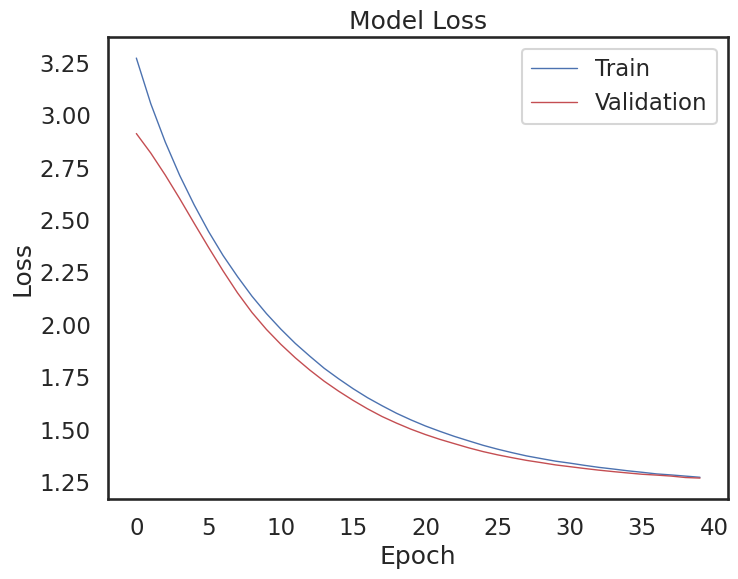

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(DLRSe40.history['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(DLRSe40.history['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

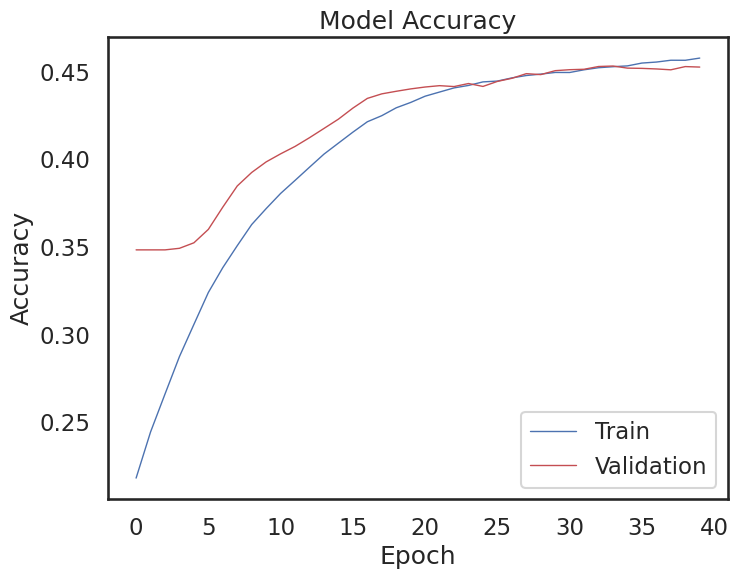

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(DLRSe40.history['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(DLRSe40.history['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()


In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(DLRSe50.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(DLRSe50.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(DLRSe50.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(DLRSe50.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

#### 2) Epochs = 100

In [ ]:
## ----- Fit Model (no privacy) ------------

# Fit the model
DLRSe100n = model.fit(
    x=[train_user, train_movie],
    y=train_ratings_one_hot,
    epochs= 100,
    batch_size = batch_size,
    validation_data=([val_user, val_movie], val_ratings_one_hot),
)

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(DLRSe100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(DLRSe100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(DLRSe100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(DLRSe100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_e100nn = model.predict([test_user, test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_e100nn = np.argmax(test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_e100nn = np.argmax(preds_e100nn, axis=1) + 1

In [ ]:
# Save Training
import json

DLRSe100nn_training = pd.DataFrame(DLRSe100n.history)

DLRSe100nn_json_file = '/content/gdrive/My Drive/DLRSe100nn_training.json'
with open(DLRSe100nn_json_file, mode='w') as f:
    DLRSe100nn_training.to_json(f)


# Save Predictions
preds_e100nn = pd.DataFrame({"y_true_e100nn ": y_true_e100nn , "y_pred_e100nn": y_pred_e100nn})

preds_e100nn.to_csv('/content/gdrive/My Drive/preds_e100nn.csv', index=False)

In [ ]:
# loss and accuracy for each epoch
base_train_loss = DLRS.history['loss']
base_train_accuracy = DLRS.history['accuracy']
base_val_loss = DLRS.history['val_loss']
base_val_accuracy = DLRS.history['val_accuracy']


### 5.4 Make Predictions (with "test" dataset)

In [ ]:
!pip install scikit-surprise


In [ ]:
from surprise import SVD
from surprise import Dataset
from surprise.model_selection import cross_validate
from keras.layers import Embedding, Reshape, Dot
from keras.models import Sequential
import seaborn as sns
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.utils import to_categorical

from sklearn.metrics import confusion_matrix, mean_squared_error
from sklearn.metrics import precision_recall_curve, auc
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import LabelBinarizer



In [ ]:
# Generate predictions
preds = model.predict([test_user, test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true = np.argmax(test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred = np.argmax(preds, axis=1) + 1


### 5.5 Model Evaluation

- we use "categorical cross-entropy loss"
- The problem is a multi-class classification problem
- "Accuracy" would be a useful metric.

#### 5.4.1) Accuracy: Actual VS Predicted

- Accuracy:
    - The overall accuracy of the model is 46%.
    - This indicates that, on average, the model correctly predicts the movie rating 46% of the time.

In [ ]:
# Compare "Actual" VS "Predicted" ratings

comparison_df = pd.DataFrame({
    'Actual': y_true,
    'Predicted': y_pred
})

print(comparison_df.sample(10))  # print 10 random examples

ValueError: ignored

In [ ]:
# Histogram

# Import necessary libraries
import seaborn as sns

# Set a professional color palette
sns.set_palette("Dark2")

# Create a figure with a specific size
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Plot actual ratings
sns.histplot(y_true, bins=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5], ax=ax[0], kde=False, color='blue')
ax[0].set_title('Distribution of Actual Ratings')  # Title
ax[0].set_xlabel('Ratings')  # X-axis label
ax[0].set_ylabel('Frequency')  # Y-axis label

# Plot predicted ratings
sns.histplot(y_pred, bins=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5], ax=ax[1], kde=False, color='red')
ax[1].set_title('Distribution of Predicted Ratings')  # Title
ax[1].set_xlabel('Ratings')  # X-axis label
ax[1].set_ylabel('Frequency')  # Y-axis label

# Adjust layout for better spacing
plt.tight_layout()

# Show the figure with the histograms
plt.show()

# Caption of the figure
print("Figure 1: Histograms showing the distribution of actual and predicted movie ratings.")


In [ ]:
# Heatmap

heatmap_data = pd.crosstab(y_pred, y_true)

cmap = sns.diverging_palette(10, 250, as_cmap=True)  # Create a red-blue diverging colormap

sns.heatmap(heatmap_data, cmap=cmap, annot=True, fmt='d')
plt.title('Heatmap Analysis: Actual vs Predicted Ratings')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.show()


In [ ]:
# Assume that `heatmap_data` is a square DataFrame
accuracy_rate = np.trace(heatmap_data.values) / heatmap_data.values.sum()
print("Accuracy rate:", accuracy_rate)


#### 5.4.2) Precision/ Recall/ F-1 Score for each rating

- Class-wise metrics:
    - Results show a sense of the model's performance on individual classes
    - The model is doing relatively well on classes 3, 4, and 5, but not as well on classes 1 and 2.
    - This could be due to class imbalance in the dataset.
    - For a multi-class classification problem with 5 classes, a naive model that randomly guesses would have an accuracy of about 20%, so 46% is better
- Macro and weighted averages:
    - Average of the metric across all classes
    - Both averages are relatively low, particularly for recall and F1-score, which suggests that the model's performance is not consistent across all classes.

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

In [ ]:
# Calculate "precision" and "recall"

print(classification_report(y_true, y_pred))

#### 5.4.3) ROC / AUC Curve

In [ ]:
# Binarize the output
y_true_bin = label_binarize(y_true, classes=[1, 2, 3, 4, 5])
y_pred_bin = label_binarize(y_pred, classes=[1, 2, 3, 4, 5])

roc_auc_dict = {}
for i in range(5):
    roc_auc = roc_auc_score(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc_dict[f'class {i+1} vs rest'] = roc_auc


In [ ]:
# Print out the results
for k, v in roc_auc_dict.items():
    print(f"{k}: {v}")

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))

for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f}) for class {i+1}')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Each Class')
plt.legend(loc="lower right")
plt.show()


In [ ]:
# Precision-Recall Curve
plt.figure(figsize=(10, 10))

for i in range(5):
    precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_bin[:, i])
    auc_score = auc(recall, precision)
    plt.plot(recall, precision, label=f'AUC for class {i+1}: {auc_score:.2f}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Each Class')
plt.legend(loc="upper right")
plt.show()


#### 5.4.4) Confusion Matrix

In [ ]:
# Confusion Matrix

conf_mat = confusion_matrix(y_true, y_pred)
sns.heatmap(conf_mat, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.show()


#### 5.4.5) Mean Squared Error (MSE) and Root Mean Squared Error (RMSE)

In [ ]:
# MSE and RMSE

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")


# **Step6: Model Training (With Differential Privacy)**

### 6.1: Import Libraries

In [ ]:
pip install tensorflow-privacy

In [ ]:
import tensorflow_privacy as tfp
import tensorflow_privacy
from tensorflow_privacy.privacy.analysis import compute_dp_sgd_privacy
from tensorflow_privacy.privacy.optimizers import dp_optimizer_keras
from tensorflow_privacy.privacy.analysis import compute_dp_sgd_privacy
from tensorflow_privacy.privacy.optimizers.dp_optimizer_keras import DPKerasSGDOptimizer, DPKerasAdamOptimizer
from tensorflow_privacy.privacy.analysis.compute_dp_sgd_privacy_lib import compute_dp_sgd_privacy
from keras.layers import Dropout
from keras.layers import Activation

### 6.2 Build Privacy Model

DP-SGD has three privacy-specific hyperparameters and one existing hyperamater that we must tune:
- 1) l2_norm_clip (float)
- 2) noise_multiplier (float)
- 3) microbatches (int)
- 4) learning_rate (float)

#### 6.2.1 Process Data (to fit the train model)

- Train set = 800,000
- Validation set = 100,000
- Test set = 100,000

1) Set Hyperparameter (same structure as base model without privacy)

In [ ]:
# Hyper Parameter ---- same as base model

N = 800000
dp_batch_size = 10000
dp_iterations = N // dp_batch_size
dp_K = 64  # Embedding dimension
dp_dropout_rate = 0.2
dp_epochs = 100
dp_learning_rate= 0.0001 #same as base model


2) Hyperparameter for DP

In [ ]:
# Hyper Parameter ---- DP Optimizer

dp_l2_norm_clip= 4
dp_noise_multiplier= 2.0
dp_num_microbatches= 1000

3) Format Data for DP Training

3.1) Slice Data (Full Dataset)

In [ ]:
# Slice data

# Find the maximum number of training samples that is divisible by the batch size
train_size = (len(train_user) // dp_batch_size) * dp_batch_size

# Similarly for validation and test sets
val_size = (len(val_user) // dp_batch_size) * dp_batch_size
test_size = (len(test_user) // dp_batch_size) * dp_batch_size

# slice data
dp_train_user = train_user[:train_size]
dp_train_movie = train_movie[:train_size]
dp_train_ratings = train_ratings[:train_size]
dp_train_ratings_one_hot = train_ratings_one_hot[:train_size]

dp_val_user = val_user[:val_size]
dp_val_movie = val_movie[:val_size]
dp_val_ratings = val_ratings[:val_size]
dp_val_ratings_one_hot = val_ratings_one_hot[:val_size]

dp_test_user = test_user[:test_size]
dp_test_movie = test_movie[:test_size]
dp_test_ratings = test_ratings[:test_size]
dp_test_ratings_one_hot = test_ratings_one_hot[:test_size]


#### 6.2.2 Model for training

In [ ]:
from tensorflow_privacy.privacy.analysis import compute_dp_sgd_privacy

from sklearn.model_selection import StratifiedKFold

Calculate optimal value of epsilon

In [ ]:
# Compute the privacy budget
eps, _ = tfp.compute_dp_sgd_privacy(
    n= N,
    batch_size= dp_batch_size,
    noise_multiplier= dp_noise_multiplier,
    epochs= dp_epochs,
    delta= 1e-5
    )

print('For delta=1e-5, the current epsilon is: %.2f' % eps)

For delta=1e-5, the current epsilon is: 2.67


1) Select DP Optimizer

In [ ]:
# Select differentially private optimizer

dp_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= dp_noise_multiplier,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

2) Define "Loss Function"

In [ ]:
# Define Loss Function

dp_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=False, reduction=tf.losses.Reduction.NONE)


3) Create Embedding & Input Layers

3.1) Embed Layer (Full Dataset)

In [ ]:
# Determine the maximum user ID and movie ID
dp_max_user_id = max(max(dp_train_user), max(dp_val_user))
dp_max_movie_id = max(max(dp_train_movie), max(dp_val_movie))

# User embedding
dp_user_input = Input(shape=(1,))
dp_user_embedding = Embedding(dp_max_user_id + 1, dp_K)(dp_user_input)
dp_user_embedding = Flatten()(dp_user_embedding)

# Movie embedding
dp_movie_input = Input(shape=(1,))
dp_movie_embedding = Embedding(dp_max_movie_id + 1, dp_K)(dp_movie_input)
dp_movie_embedding = Flatten()(dp_movie_embedding)

# Concatenate user-movie embeddings into a feature vector
dp_concatenated = Concatenate()([dp_user_embedding, dp_movie_embedding])

4) Create Model Architecture (with DP)

4.1) Model (Full dataset)

In [ ]:
# Model Architecture

dp_x = Dense(64, activation='relu')(dp_concatenated)
dp_x = Dropout(dp_dropout_rate)(dp_x)
dp_x = BatchNormalization()(dp_x)
dp_x = Dense(32, activation='relu')(dp_x)
dp_x = Dropout(dp_dropout_rate)(dp_x)
dp_x = BatchNormalization()(dp_x)
dp_x = Dense(8, activation='relu')(dp_x)
dp_x = Dropout(dp_dropout_rate)(dp_x)
dp_x = BatchNormalization()(dp_x)
dp_x = Dense(5)(dp_x)
dp_x = Activation('softmax')(dp_x)

# Build the model
dp_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)

dp_model.compile(optimizer= dp_optimizer,
                 loss= dp_loss,
                 metrics=['accuracy']
                 )


### 6.3 Model Training

#### 1) DP - Noise 2

Epochs 40

In [ ]:
## ---------- Fit Model -------------
dp2_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 2,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp2_model40 = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp2_model40.compile(optimizer= dp2_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp2e40_r1 = dp2_model40.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 40,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
)

Epoch 1/40


80/80 [==============================] - 56s 644ms/step - loss: 1.9807 - accuracy: 0.2288 - val_loss: 1.5665 - val_accuracy: 0.3482
Epoch 2/40
80/80 [==============================] - 50s 628ms/step - loss: 1.9441 - accuracy: 0.2313 - val_loss: 1.5488 - val_accuracy: 0.3482
Epoch 3/40
80/80 [==============================] - 50s 624ms/step - loss: 1.9099 - accuracy: 0.2345 - val_loss: 1.5435 - val_accuracy: 0.3482
Epoch 4/40
80/80 [==============================] - 50s 624ms/step - loss: 1.8767 - accuracy: 0.2364 - val_loss: 1.5416 - val_accuracy: 0.3480
Epoch 5/40
80/80 [==============================] - 50s 620ms/step - loss: 1.8472 - accuracy: 0.2400 - val_loss: 1.5400 - val_accuracy: 0.3457
Epoch 6/40
80/80 [==============================] - 50s 622ms/step - loss: 1.8201 - accuracy: 0.2429 - val_loss: 1.5417 - val_accuracy: 0.3370
Epoch 7/40
80/80 [==============================] - 50s 623ms/step - loss: 1.7947 - accuracy: 0.2456 - val_loss: 1.5484 - val_accuracy: 0.3224
Epoch 8/40

In [ ]:
# Generate predictions
preds_dp2e40_r1 = dp2_model40.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp2e40_r1 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp2e40_r1 = np.argmax(preds_dp2e40_r1, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save Training
import json

dp2e40_r1_training = pd.DataFrame(dp2e40_r1.history)

dp2e40_r1_json_file = '/content/gdrive/My Drive/dp2e40_r1_training.json'
with open(dp2e40_r1_json_file, mode='w') as f:
    dp2e40_r1_training.to_json(f)

# Save Predictions
preds_dp2e40_r1 = pd.DataFrame({"y_true_dp2e40_r1": y_true_dp2e40_r1, "y_pred_dp2e40_r1": y_pred_dp2e40_r1})

preds_dp2e40_r1.to_csv('/content/gdrive/My Drive/preds_dp2e40_r1.csv', index=False)



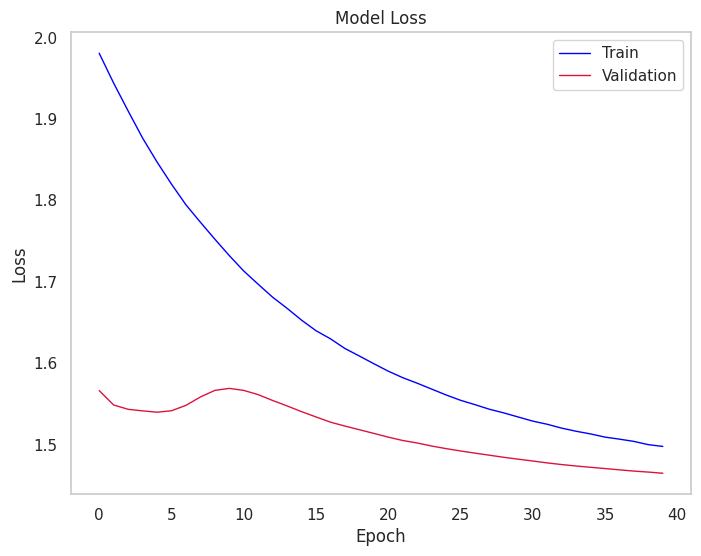

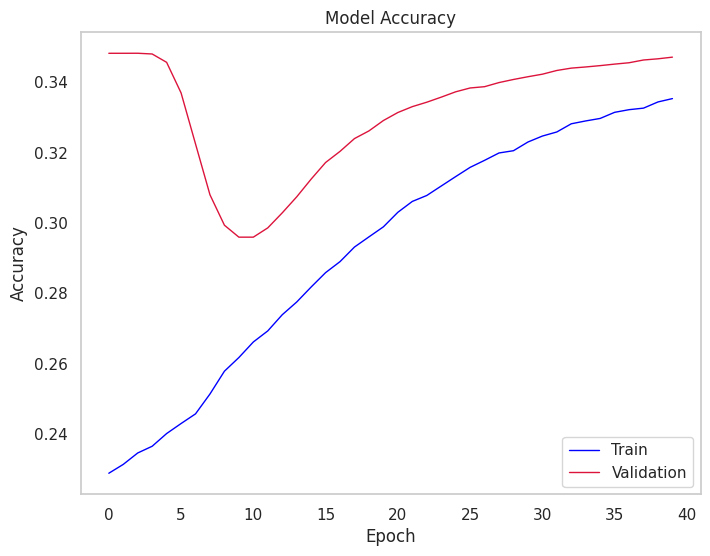

In [ ]:
# Set default Seaborn style
sns.set(style="whitegrid")

# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dp2e40_r1.history['loss'], 'blue', linestyle='-', linewidth=1)
plt.plot(dp2e40_r1.history['val_loss'], 'crimson', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.grid(False)  # Hide grid

plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dp2e40_r1.history['accuracy'], 'blue', linestyle='-', linewidth=1)
plt.plot(dp2e40_r1.history['val_accuracy'], 'crimson', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.grid(False)  # Hide grid

plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error
from sklearn.preprocessing import LabelBinarizer
from math import sqrt

# Converting your predictions and true labels to the closest integers
y_true = np.rint(y_true_dp2e40_r1).astype(int)
y_pred = np.rint(y_pred_dp2e40_r1).astype(int)

# Precision, recall, F1-score per class
report = classification_report(y_true, y_pred, output_dict=True)
df_metrics = pd.DataFrame(report).transpose()

# Accuracy
accuracy = accuracy_score(y_true_dp2e40_r1, y_pred_dp2e40_r1)

# MSE
mse = mean_squared_error(y_true_dp2e40_r1, y_pred_dp2e40_r1)

# RMSE
rmse = sqrt(mse)

# Adding accuracy, MSE and RMSE to the dataframe
df_metrics.loc['accuracy'] = [accuracy] * 4
df_metrics.loc['MSE'] = [mse] * 4
df_metrics.loc['RMSE'] = [rmse] * 4

# Showing the dataframe
print(df_metrics)


              precision  recall  f1-score    support
1                 0.000   0.000     0.000   5651.000
2                 0.000   0.000     0.000  10769.000
3                 0.276   0.029     0.052  26071.000
4                 0.349   0.971     0.513  34812.000
5                 0.376   0.006     0.013  22697.000
accuracy          0.347   0.347     0.347      0.347
macro avg         0.200   0.201     0.116 100000.000
weighted avg      0.279   0.347     0.195 100000.000
MSE               1.430   1.430     1.430      1.430
RMSE              1.196   1.196     1.196      1.196


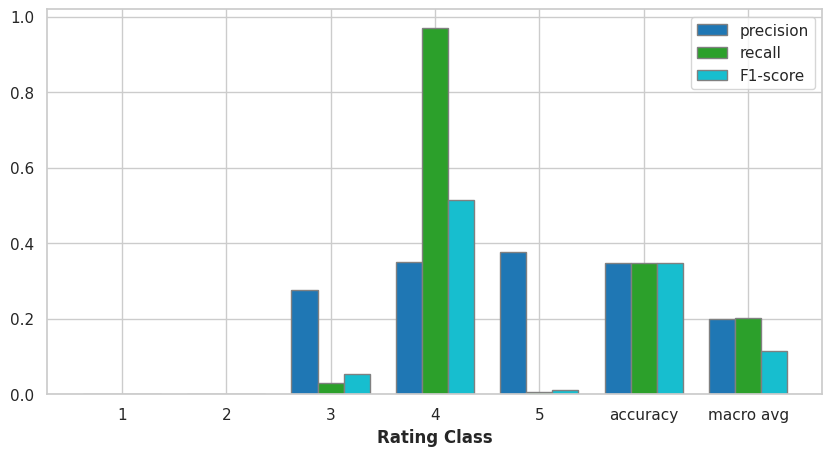

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract precision, recall and F1-score
precision = df_metrics['precision'][:-3]  # excluding the last three rows (avg / total, accuracy, MSE, RMSE)
recall = df_metrics['recall'][:-3]
f1 = df_metrics['f1-score'][:-3]

# Get bar width and positions
barWidth = 0.25
r1 = np.arange(len(precision))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Set style
sns.set_style("whitegrid")

# Create plot
fig, ax = plt.subplots(figsize=(10, 5))

# Add bars
plt.bar(r1, precision.values, color='#1f77b4', width=barWidth, edgecolor='grey', label='precision')
plt.bar(r2, recall.values, color='#2ca02b', width=barWidth, edgecolor='grey', label='recall')
plt.bar(r3, f1.values, color='#17becf', width=barWidth, edgecolor='grey', label='F1-score')

# Add xticks on the middle of the group bars
plt.xlabel('Rating Class', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision))], precision.index)

# Create legend & show graphic
plt.legend()
plt.show()


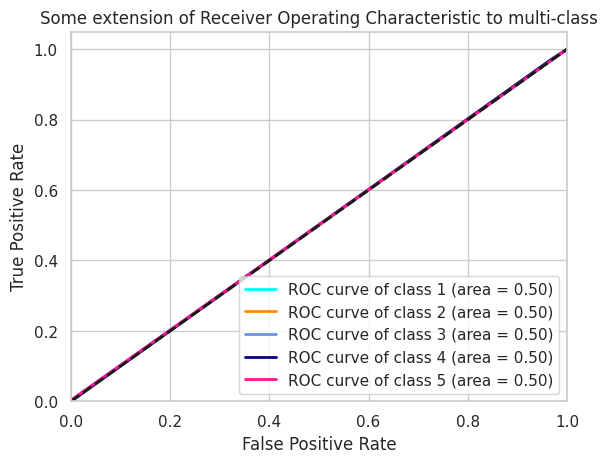

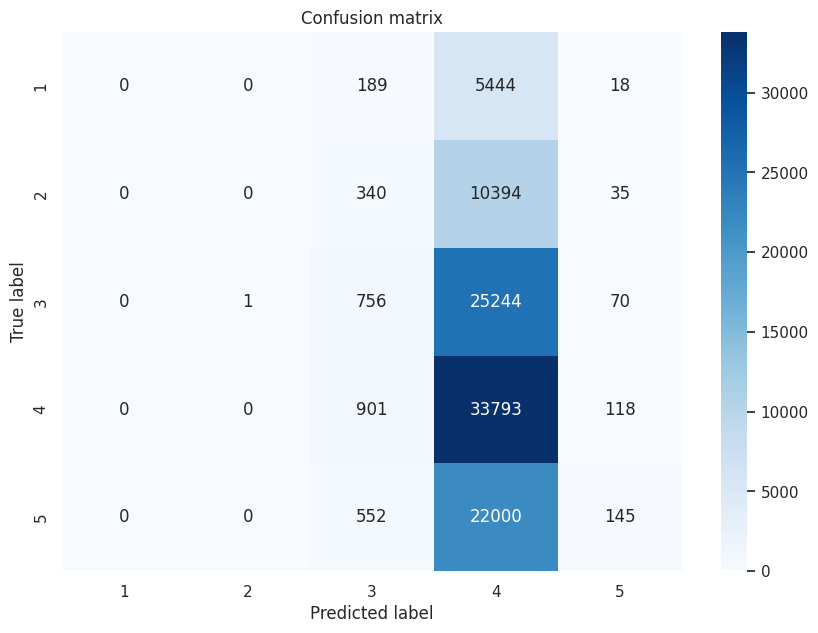

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, roc_auc_score
from sklearn.preprocessing import label_binarize
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Binarize the output
y_true_bin = label_binarize(y_true_dp2e40_r1, classes=[1, 2, 3, 4, 5])
y_pred_bin = label_binarize(y_pred_dp2e40_r1, classes=[1, 2, 3, 4, 5])

n_classes = y_true_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()

colors = ['aqua', 'darkorange', 'cornflowerblue', 'navy', 'deeppink']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc[i])) # +1 to shift class range from 0-4 to 1-5

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver Operating Characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true_dp2e40_r1, y_pred_dp2e40_r1)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cnf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[1, 2, 3, 4, 5], yticklabels=[1, 2, 3, 4, 5])
plt.title('Confusion matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
## Load Saved Model

# Load Training History
dp2 = pd.read_json('/content/gdrive/My Drive/dp2_training.json')




In [ ]:
preds_dp2 = pd.read_csv('/content/gdrive/My Drive/preds_dp2.csv')

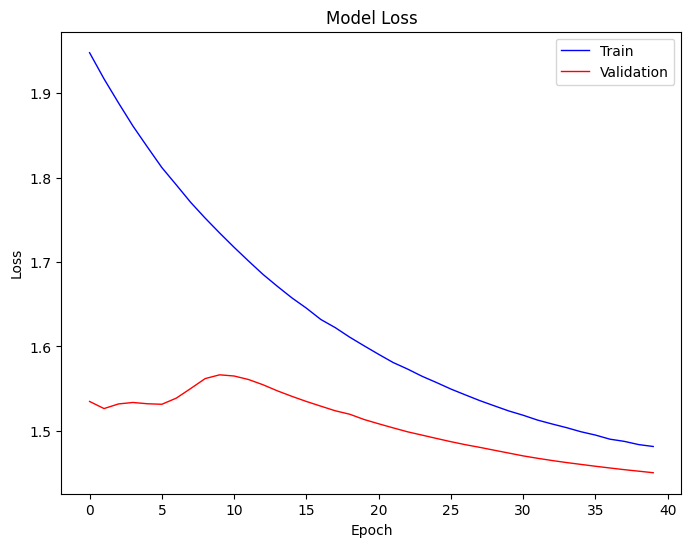

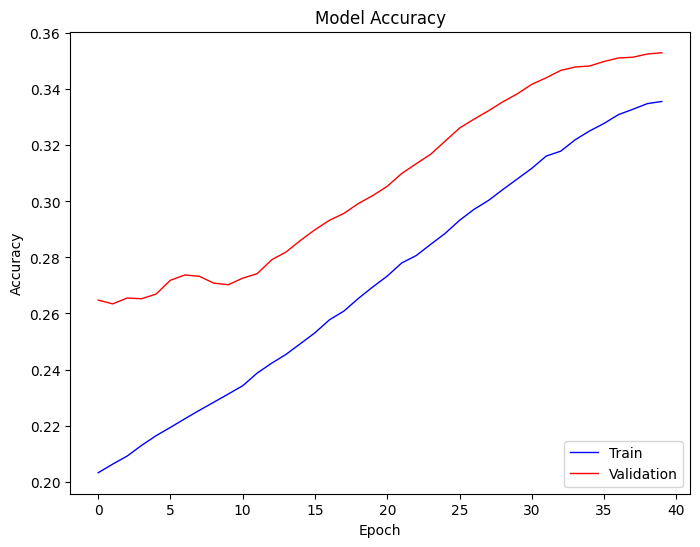

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dp2['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(dp2['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dp2['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(dp2['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

Epoch100

In [ ]:
## ---------- Fit Model -------------
dp2_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 2,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp2_modele100n = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp2_modele100n.compile(optimizer= dp2_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp2e100n = dp2_modele100n.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 77s 893ms/step - loss: 1.3493 - accuracy: 0.3931 - val_loss: 1.3257 - val_accuracy: 0.4009
Epoch 2/100
80/80 [==============================] - 66s 823ms/step - loss: 1.3477 - accuracy: 0.3936 - val_loss: 1.3249 - val_accuracy: 0.4015
Epoch 3/100
80/80 [==============================] - 61s 769ms/step - loss: 1.3475 - accuracy: 0.3943 - val_loss: 1.3243 - val_accuracy: 0.4016
Epoch 4/100
80/80 [==============================] - 66s 828ms/step - loss: 1.3466 - accuracy: 0.3945 - val_loss: 1.3236 - val_accuracy: 0.4020
Epoch 5/100
80/80 [==============================] - 69s 869ms/step - loss: 1.3456 - accuracy: 0.3951 - val_loss: 1.3227 - val_accuracy: 0.4023
Epoch 6/100
80/80 [==============================] - 68s 857ms/step - loss: 1.3448 - accuracy: 0.3950 - val_loss: 1.3221 - val_accuracy: 0.4027
Epoch 7/100
80/80 [==============================] - 71s 886ms/step - loss: 1.3441 - accuracy: 0.3957 - val_loss: 1.3214 - val_accuracy: 0.4035
Epoc

In [ ]:
# Generate predictions
preds_dp2e100nn = dp2_modele100n.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp2e100nn = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp2e100nn = np.argmax(preds_dp2e100nn, axis=1) + 1

3125/3125 [==============================] - 11s 3ms/step


In [ ]:
# Save Training
import json

dp2e100nn_training = pd.DataFrame(dp2e100n.history)

dp2e100nn_json_file = '/content/gdrive/My Drive/dp2e100nn_training.json'
with open(dp2e100nn_json_file, mode='w') as f:
    dp2e100nn_training.to_json(f)


# Save Predictions
preds_dp2e100nn = pd.DataFrame({"y_true_dp2e100nn ": y_true_dp2e100nn , "y_pred_dp2e100nn": y_pred_dp2e100nn})

preds_dp2e100nn.to_csv('/content/gdrive/My Drive/preds_dp2e100nn.csv', index=False)

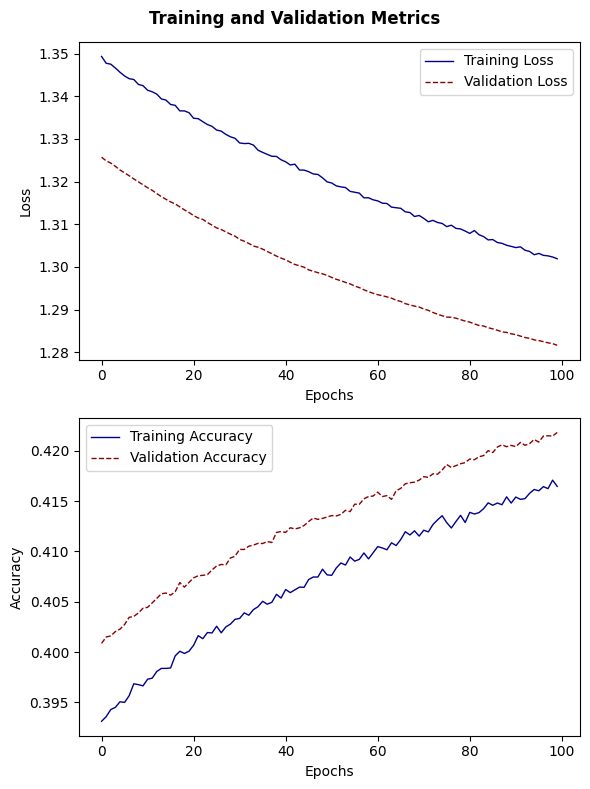

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp2e100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp2e100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp2e100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp2e100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
## ---------- Fit Model -------------
dp2_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 2,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp2_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp2_model.compile(optimizer= dp2_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp2e100n = dp2_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 56s 642ms/step - loss: 1.2902 - accuracy: 0.4215 - val_loss: 1.2732 - val_accuracy: 0.4253
Epoch 2/100
80/80 [==============================] - 51s 636ms/step - loss: 1.2899 - accuracy: 0.4216 - val_loss: 1.2732 - val_accuracy: 0.4256
Epoch 3/100
80/80 [==============================] - 51s 635ms/step - loss: 1.2900 - accuracy: 0.4220 - val_loss: 1.2734 - val_accuracy: 0.4258
Epoch 4/100
80/80 [==============================] - 51s 639ms/step - loss: 1.2904 - accuracy: 0.4214 - val_loss: 1.2733 - val_accuracy: 0.4256
Epoch 5/100
80/80 [==============================] - 51s 634ms/step - loss: 1.2906 - accuracy: 0.4214 - val_loss: 1.2732 - val_accuracy: 0.4258
Epoch 6/100
80/80 [==============================] - 51s 636ms/step - loss: 1.2901 - accuracy: 0.4218 - val_loss: 1.2732 - val_accuracy: 0.4255
Epoch 7/100
80/80 [==============================] - 51s 635ms/step - loss: 1.2901 - accuracy: 0.4214 - val_loss: 1.2731 - val_accuracy: 0.4252
Epoc

In [ ]:
## ------------- Fit the Model -------------------------

dp2e100n = dp_model.fit(
        x= [dp_train_user, dp_train_movie],
        y= dp_train_ratings_one_hot,
        epochs= 100,
        batch_size= dp_batch_size,
        validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
        callbacks=[early_stopping])


Epoch 1/100


80/80 [==============================] - 83s 965ms/step - loss: 2.0275 - accuracy: 0.1916 - val_loss: 1.7670 - val_accuracy: 0.0875
Epoch 2/100
80/80 [==============================] - 63s 784ms/step - loss: 1.9894 - accuracy: 0.1940 - val_loss: 1.8543 - val_accuracy: 0.0610
Epoch 3/100
80/80 [==============================] - 51s 636ms/step - loss: 1.9516 - accuracy: 0.1970 - val_loss: 1.8746 - val_accuracy: 0.0598
Epoch 4/100
80/80 [==============================] - 52s 648ms/step - loss: 1.9182 - accuracy: 0.2005 - val_loss: 1.8591 - val_accuracy: 0.0626
Epoch 5/100
80/80 [==============================] - 51s 641ms/step - loss: 1.8874 - accuracy: 0.2043 - val_loss: 1.8226 - val_accuracy: 0.0725
Epoch 6/100
80/80 [==============================] - 52s 650ms/step - loss: 1.8579 - accuracy: 0.2086 - val_loss: 1.7755 - val_accuracy: 0.0973
Epoch 7/100
80/80 [==============================] - 51s 643ms/step - loss: 1.8313 - accuracy: 0.2121 - val_loss: 1.7316 - val_accuracy: 0.1317
Epoc

Plot DP-DLRS Performance

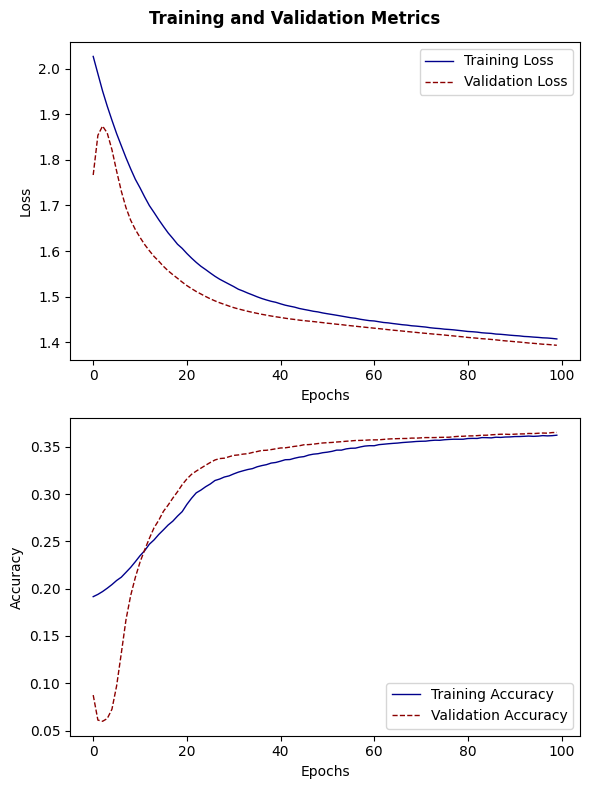

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp2e100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp2e100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp2e100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp2e100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dp2e100n = dp_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp2e100n = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp2e100n = np.argmax(preds_dp2e100n, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save Training
import json

dp2e100n_training = pd.DataFrame(dp2e100n.history)

dp2e100n_json_file = '/content/gdrive/My Drive/dp2e100n_training.json'
with open(dp2e100n_json_file, mode='w') as f:
    dp2e100n_training.to_json(f)


# Save Predictions
preds_dp2e100n = pd.DataFrame({"y_true_dp2e100n ": y_true_dp2e100n , "y_pred_dp2e100n": y_pred_dp2e100n})

preds_dp2e100n.to_csv('/content/gdrive/My Drive/preds_dp2e100n.csv', index=False)

Epochs = 40

In [ ]:
## ---------- Fit Model -------------
dp2_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 2,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp2_modele40n = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp2_modele40n.compile(optimizer= dp2_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp2e40n = dp2_modele40n.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 40,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

#### 2) DP - Noise 3

In [ ]:
## ---------- Fit Model -------------
dp3e100_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 3,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp3e100nnn_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp3e100nnn_model.compile(optimizer= dp3e100_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp3e100nnn = dp3e100nnn_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot)
)

Epoch 1/100


50/80 [=================>............] - ETA: 42s - loss: 1.4570 - accuracy: 0.3454

KeyboardInterrupt: ignored

In [ ]:
## ---------- Fit Model -------------
dp3e100_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 3,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp3e100nnn_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp3e100nnn_model.compile(optimizer= dp3e100_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp3e100nnn = dp3e100nnn_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot)
)

Epoch 1/100


80/80 [==============================] - 83s 981ms/step - loss: 1.2637 - accuracy: 0.4371 - val_loss: 1.2514 - val_accuracy: 0.4432
Epoch 2/100
80/80 [==============================] - 73s 912ms/step - loss: 1.2636 - accuracy: 0.4375 - val_loss: 1.2513 - val_accuracy: 0.4434
Epoch 3/100
80/80 [==============================] - 77s 967ms/step - loss: 1.2639 - accuracy: 0.4370 - val_loss: 1.2514 - val_accuracy: 0.4433
Epoch 4/100
80/80 [==============================] - 72s 897ms/step - loss: 1.2641 - accuracy: 0.4371 - val_loss: 1.2513 - val_accuracy: 0.4435
Epoch 5/100
80/80 [==============================] - 74s 923ms/step - loss: 1.2634 - accuracy: 0.4378 - val_loss: 1.2514 - val_accuracy: 0.4437
Epoch 6/100
80/80 [==============================] - 73s 920ms/step - loss: 1.2636 - accuracy: 0.4374 - val_loss: 1.2514 - val_accuracy: 0.4438
Epoch 7/100
80/80 [==============================] - 71s 890ms/step - loss: 1.2635 - accuracy: 0.4375 - val_loss: 1.2515 - val_accuracy: 0.4431
Epoc

In [ ]:
# Generate predictions
preds_dp3e100nn = dp3e100n_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp3e100nn = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp3e100nn = np.argmax(preds_dp3e100nn, axis=1) + 1

3125/3125 [==============================] - 12s 4ms/step


In [ ]:
# Save Training
import json

dp3e100nn_training = pd.DataFrame(dp3e100n.history)

dp3e100nn_json_file = '/content/gdrive/My Drive/dp3e100nn_training.json'
with open(dp3e100nn_json_file, mode='w') as f:
    dp3e100nn_training.to_json(f)


# Save Predictions
preds_dp3e100nn = pd.DataFrame({"y_true_dp3e100nn ": y_true_dp3e100nn , "y_pred_dp3e100nn": y_pred_dp3e100nn})

preds_dp3e100nn.to_csv('/content/gdrive/My Drive/preds_dp3e100nn.csv', index=False)

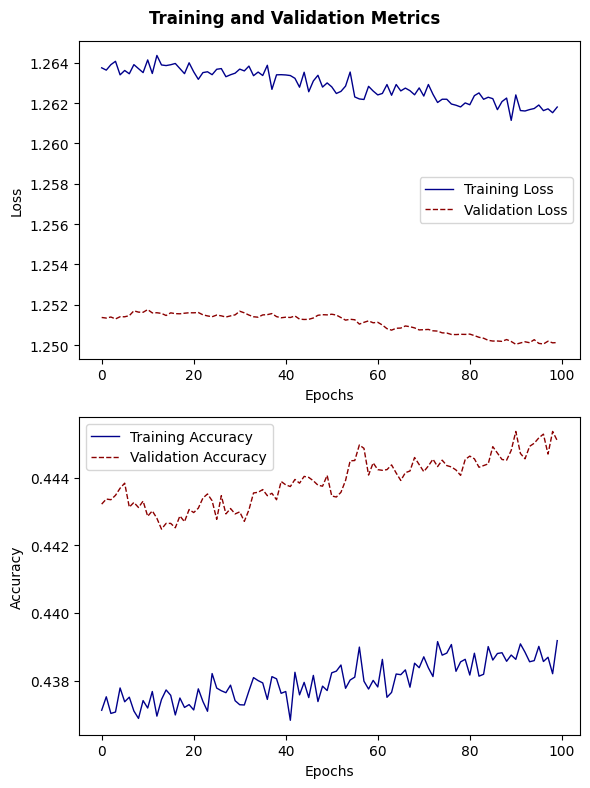

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp3e100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp3e100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp3e100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp3e100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
## ---------- Fit Model -------------
dp3e100_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 3,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp3e100n_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp3e100n_model.compile(optimizer= dp3e100_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp3e100n = dp3e100n_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot)
)

Epoch 1/100


80/80 [==============================] - 72s 843ms/step - loss: 1.4781 - accuracy: 0.3365 - val_loss: 1.4506 - val_accuracy: 0.3482
Epoch 2/100
80/80 [==============================] - 67s 835ms/step - loss: 1.4761 - accuracy: 0.3376 - val_loss: 1.4495 - val_accuracy: 0.3486
Epoch 3/100
80/80 [==============================] - 65s 816ms/step - loss: 1.4747 - accuracy: 0.3384 - val_loss: 1.4486 - val_accuracy: 0.3485
Epoch 4/100
80/80 [==============================] - 66s 827ms/step - loss: 1.4733 - accuracy: 0.3385 - val_loss: 1.4479 - val_accuracy: 0.3484
Epoch 5/100
80/80 [==============================] - 67s 839ms/step - loss: 1.4718 - accuracy: 0.3395 - val_loss: 1.4472 - val_accuracy: 0.3485
Epoch 6/100
80/80 [==============================] - 70s 883ms/step - loss: 1.4707 - accuracy: 0.3404 - val_loss: 1.4466 - val_accuracy: 0.3485
Epoch 7/100
80/80 [==============================] - 70s 878ms/step - loss: 1.4690 - accuracy: 0.3411 - val_loss: 1.4459 - val_accuracy: 0.3487
Epoc

In [ ]:
# Generate predictions
preds_dp3e100n = dp3e100n_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp3e100n = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp3e100n = np.argmax(preds_dp3e100n, axis=1) + 1

3125/3125 [==============================] - 14s 4ms/step


In [ ]:
# Save Training
import json

dp3e100n_training = pd.DataFrame(dp3e100n.history)

dp3e100n_json_file = '/content/gdrive/My Drive/dp3e100n_training.json'
with open(dp3e100n_json_file, mode='w') as f:
    dp3e100n_training.to_json(f)


# Save Predictions
preds_dp3e100n = pd.DataFrame({"y_true_dp3e100n ": y_true_dp3e100n , "y_pred_dp3e100n": y_pred_dp3e100n})

preds_dp3e100n.to_csv('/content/gdrive/My Drive/preds_dp3e100n.csv', index=False)

In [ ]:
## ---------- Fit Model -------------
dp3e100_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 3,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp3e100nn_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp3e100nn_model.compile(optimizer= dp3e100_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp3e100nn = dp3e100nn_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot)
)

In [ ]:
# Generate predictions
preds_dp3e100nn = dp3e100nn_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp3e100nn = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp3e100nn = np.argmax(preds_dp3e100nn, axis=1) + 1

In [ ]:
# Save Training
import json

dp3e100nn_training = pd.DataFrame(dp3e100nn.history)

dp3e100nn_json_file = '/content/gdrive/My Drive/dp3e100nn_training.json'
with open(dp3e100nn_json_file, mode='w') as f:
    dp3e100nn_training.to_json(f)


# Save Predictions
preds_dp3e100nn = pd.DataFrame({"y_true_dp3e100nn ": y_true_dp3e100nn , "y_pred_dp3e100nn": y_pred_dp3e100nn})

preds_dp3e100nn.to_csv('/content/gdrive/My Drive/preds_dp3e100nn.csv', index=False)

In [ ]:
## ---------- Fit Model -------------
dp3e100_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 3,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp3e100_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp3e100_model.compile(optimizer= dp3e100_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp3e100 = dp3e100_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 60s 639ms/step - loss: 2.1096 - accuracy: 0.2084 - val_loss: 1.6047 - val_accuracy: 0.3483
Epoch 2/100
80/80 [==============================] - 50s 627ms/step - loss: 2.0763 - accuracy: 0.2109 - val_loss: 1.6512 - val_accuracy: 0.2684
Epoch 3/100
80/80 [==============================] - 50s 627ms/step - loss: 2.0456 - accuracy: 0.2134 - val_loss: 1.6825 - val_accuracy: 0.1917
Epoch 4/100
80/80 [==============================] - 50s 625ms/step - loss: 2.0140 - accuracy: 0.2168 - val_loss: 1.6833 - val_accuracy: 0.2102
Epoch 5/100
80/80 [==============================] - 51s 633ms/step - loss: 1.9855 - accuracy: 0.2191 - val_loss: 1.6644 - val_accuracy: 0.2473
Epoch 6/100
80/80 [==============================] - 50s 625ms/step - loss: 1.9574 - accuracy: 0.2218 - val_loss: 1.6354 - val_accuracy: 0.2797
Epoch 7/100
80/80 [==============================] - 51s 632ms/step - loss: 1.9334 - accuracy: 0.2247 - val_loss: 1.6133 - val_accuracy: 0.2924
Epoc

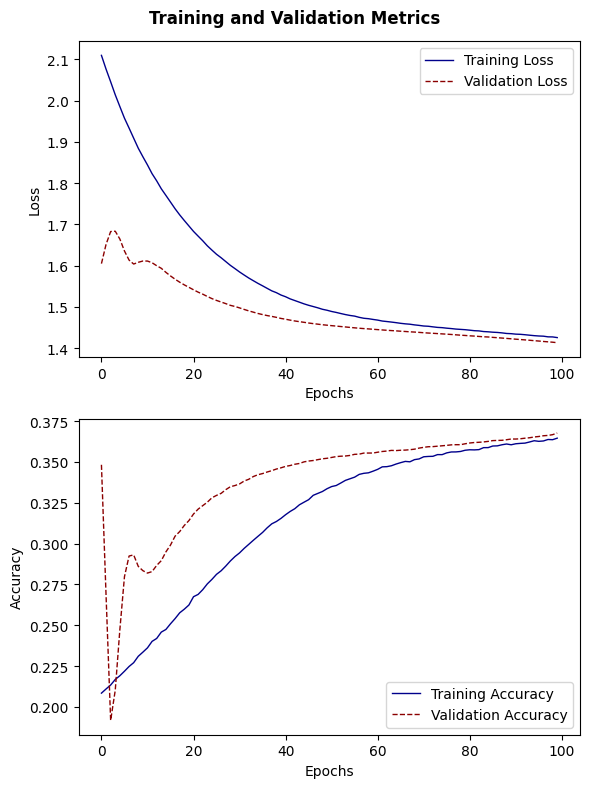

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp3e100.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp3e100.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp3e100.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp3e100.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dp3e100 = dp3e100_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp3e100 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp3e100 = np.argmax(preds_dp3e100, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save Training
import json

dp3e100_training = pd.DataFrame(dp3e100.history)

dp3e100_json_file = '/content/gdrive/My Drive/dp3e100_training.json'
with open(dp3e100_json_file, mode='w') as f:
    dp3e100_training.to_json(f)


# Save Predictions
preds_dp3e100 = pd.DataFrame({"y_true_dp3e100 ": y_true_dp3e100 , "y_pred_dp3e100": y_pred_dp3e100})

preds_dp3e100.to_csv('/content/gdrive/My Drive/preds_dp3e100.csv', index=False)

Epochs = 60

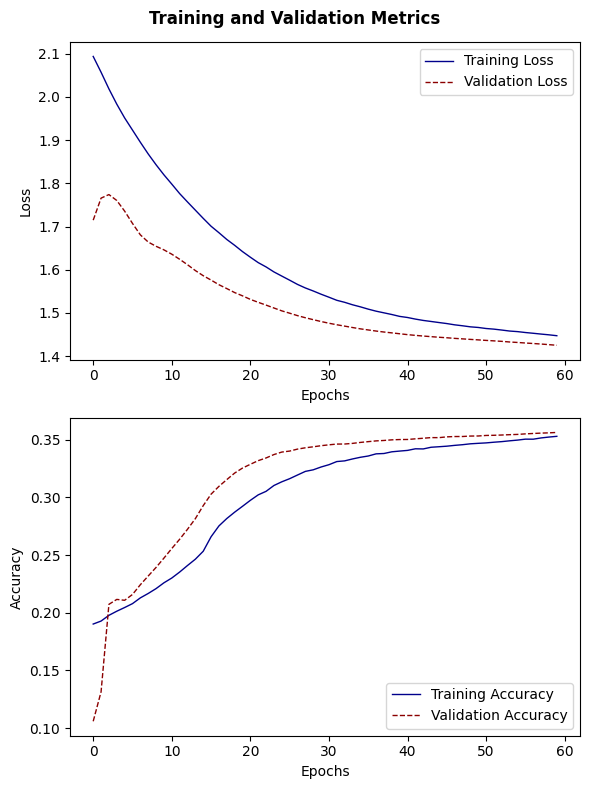

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp2.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp2.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp2.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp2.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

Get Results

In [ ]:
# loss and accuracy for each epoch
dp2_train_loss = dp2.history['loss']
dp2_train_accuracy = dp2.history['accuracy']
dp2_val_loss = dp2.history['val_loss']
dp2_val_accuracy = dp2.history['val_accuracy']

Statistical Test

In [ ]:
from scipy import stats

In [ ]:
# Assuming DLRS_accuracy and dp2_accuracy are lists of validation accuracy for each epoch
t_statistic, p_value = stats.ttest_rel(base_val_accuracy, dp2_val_accuracy)
print(f't-statistic: {t_statistic}, p-value: {p_value}')


t-statistic: 4.97561491552433, p-value: 1.3525602132778773e-05


In [ ]:
t_statistic, p_value = stats.ttest_rel(base_val_loss, dp2_val_loss)
print(f't-statistic: {t_statistic}, p-value: {p_value}')

t-statistic: 3.1498791522208514, p-value: 0.0031313808900202524


Calculate "Accuracy & Performance"

In [ ]:
# Generate Predictions (DP- Noise2)

# Generate predictions
preds_dp2 = dp_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp2 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp2 = np.argmax(preds_dp2, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Compare "Actual" VS "Predicted" ratings

comparison_dp2 = pd.DataFrame({
    'Actual': y_true_dp2,
    'Predicted': y_pred_dp2
})

print(comparison_dp2.sample(10))  # print 10 random examples

       Actual  Predicted
45457       5          4
59909       5          4
61284       3          4
84426       3          4
82446       4          5
90692       3          4
43504       3          4
1173        3          4
72709       2          4
3464        4          4


In [ ]:
# Calculate "precision" and "recall"

print(classification_report(y_true_dp2, y_pred_dp2))

              precision    recall  f1-score   support

           1       0.12      0.00      0.00      5651
           2       0.28      0.00      0.00     10769
           3       0.30      0.06      0.09     26071
           4       0.35      0.92      0.51     34812
           5       0.43      0.08      0.13     22697

    accuracy                           0.35    100000
   macro avg       0.30      0.21      0.15    100000
weighted avg       0.33      0.35      0.23    100000



In [ ]:
# Binarize the output
y_true_bin_dp2 = label_binarize(y_true_dp2, classes=[1, 2, 3, 4, 5])
y_pred_bin_dp2 = label_binarize(y_pred_dp2, classes=[1, 2, 3, 4, 5])

roc_auc_dict_dp2 = {}
for i in range(5):
    roc_auc_dp2 = roc_auc_score(y_true_bin_dp2[:, i], y_pred_bin_dp2[:, i])
    roc_auc_dict_dp2[f'class {i+1} vs rest'] = roc_auc_dp2

In [ ]:
# Print out the results
for k, v in roc_auc_dict_dp2.items():
    print(f"{k}: {v}")

class 1 vs rest: 0.5000513836024328
class 2 vs rest: 0.5005427515414076
class 3 vs rest: 0.5046617055131335
class 4 vs rest: 0.5076955476396146
class 5 vs rest: 0.5243899965241782


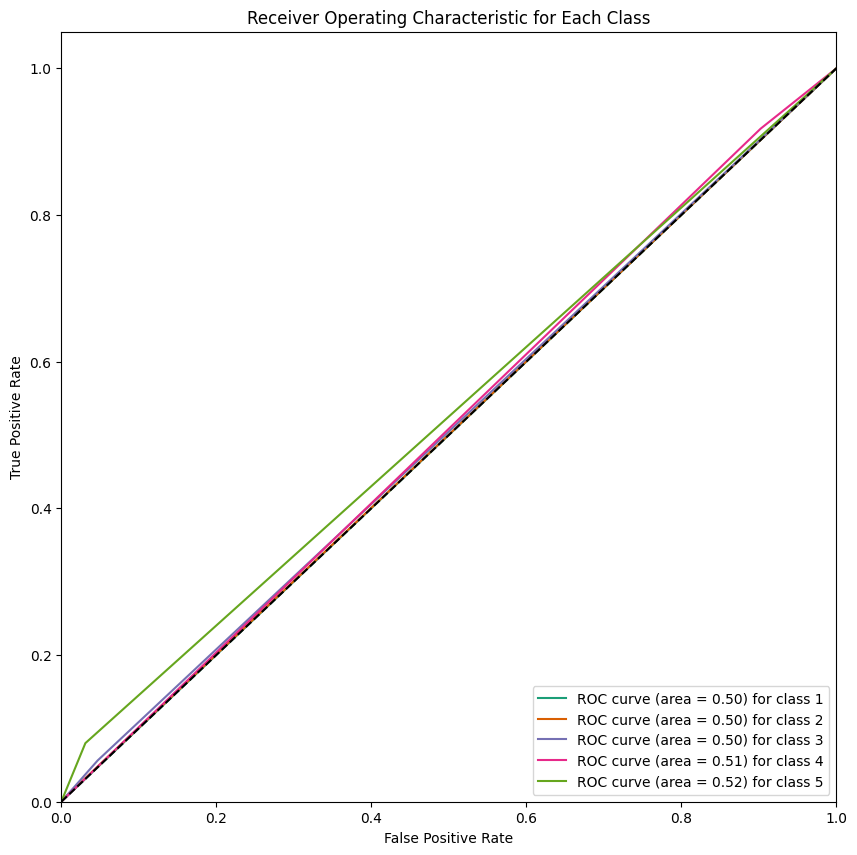

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))

for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin_dp2[:, i], y_pred_bin_dp2[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f}) for class {i+1}')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Each Class')
plt.legend(loc="lower right")
plt.show()


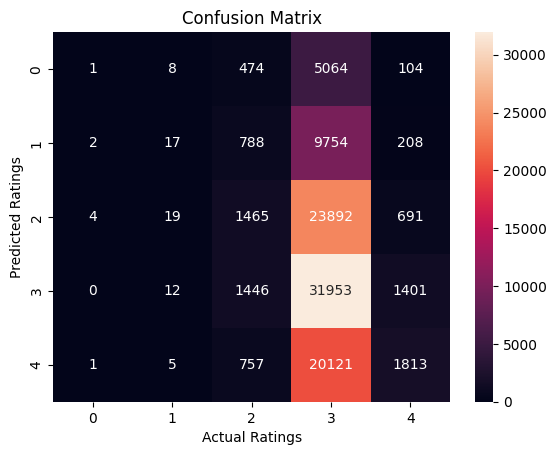

In [ ]:
# Confusion Matrix

conf_mat_dp2 = confusion_matrix(y_true_dp2, y_pred_dp2)
sns.heatmap(conf_mat_dp2, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.show()

In [ ]:
# MSE and RMSE

mse_dp2 = mean_squared_error(y_true_dp2, y_pred_dp2)
rmse_dp2 = np.sqrt(mse_dp2)

print(f"Mean Squared Error: {mse_dp2}")
print(f"Root Mean Squared Error: {rmse_dp2}")

Mean Squared Error: 1.43618
Root Mean Squared Error: 1.1984072763464013


In [ ]:
# Accuracy
from sklearn.metrics import accuracy_score

accuracy_dp2 = accuracy_score(y_true_dp2, y_pred_dp2)

print(f'Test accuracy: {accuracy}')

NameError: ignored

#### 3) DP - Noise 5

Large Noise (N = 5, Eps = 0.56)

In [ ]:
## Load Training Results

dp5 = pd.read_json('/content/gdrive/My Drive/dp5_training.json')

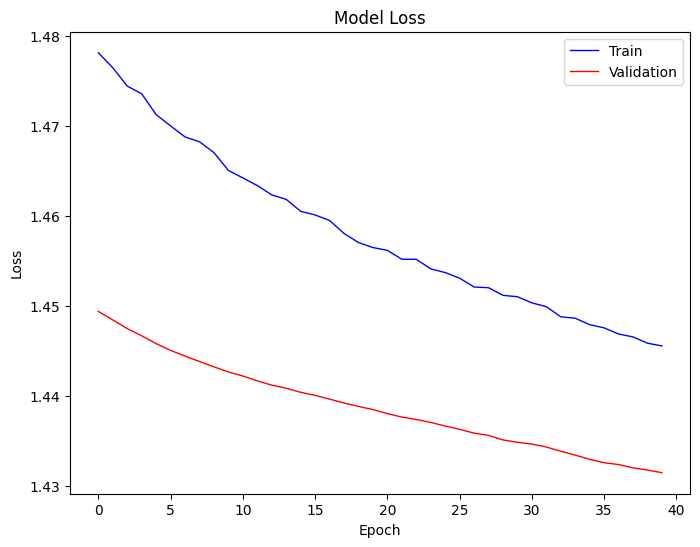

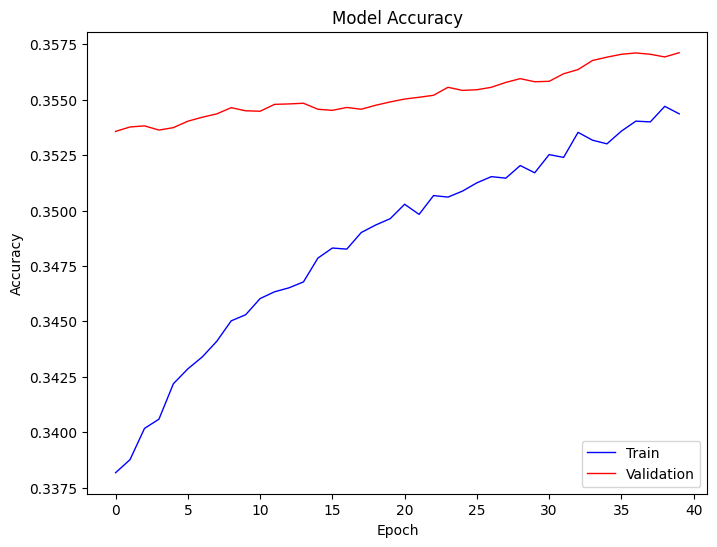

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dp5['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(dp5['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dp5['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(dp5['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

Epochs = 100

In [ ]:
## ---------- Fit Model -------------
dp5_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 5,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp5_modele100nn = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp5_modele100nn.compile(optimizer= dp5_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp5e100nn = dp5_modele100nn.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 133s 2s/step - loss: 2.0043 - accuracy: 0.2125 - val_loss: 1.6137 - val_accuracy: 0.0643
Epoch 2/100
80/80 [==============================] - 125s 2s/step - loss: 1.9845 - accuracy: 0.2148 - val_loss: 1.6129 - val_accuracy: 0.2845
Epoch 3/100
80/80 [==============================] - 125s 2s/step - loss: 1.9668 - accuracy: 0.2161 - val_loss: 1.6146 - val_accuracy: 0.3251
Epoch 4/100
80/80 [==============================] - 125s 2s/step - loss: 1.9508 - accuracy: 0.2182 - val_loss: 1.6138 - val_accuracy: 0.3165
Epoch 5/100
80/80 [==============================] - 125s 2s/step - loss: 1.9335 - accuracy: 0.2197 - val_loss: 1.6128 - val_accuracy: 0.2901
Epoch 6/100
80/80 [==============================] - 125s 2s/step - loss: 1.9163 - accuracy: 0.2219 - val_loss: 1.6173 - val_accuracy: 0.2624
Epoch 7/100
80/80 [==============================] - 124s 2s/step - loss: 1.8999 - accuracy: 0.2228 - val_loss: 1.6321 - val_accuracy: 0.2435
Epoch 8/100
80/80 

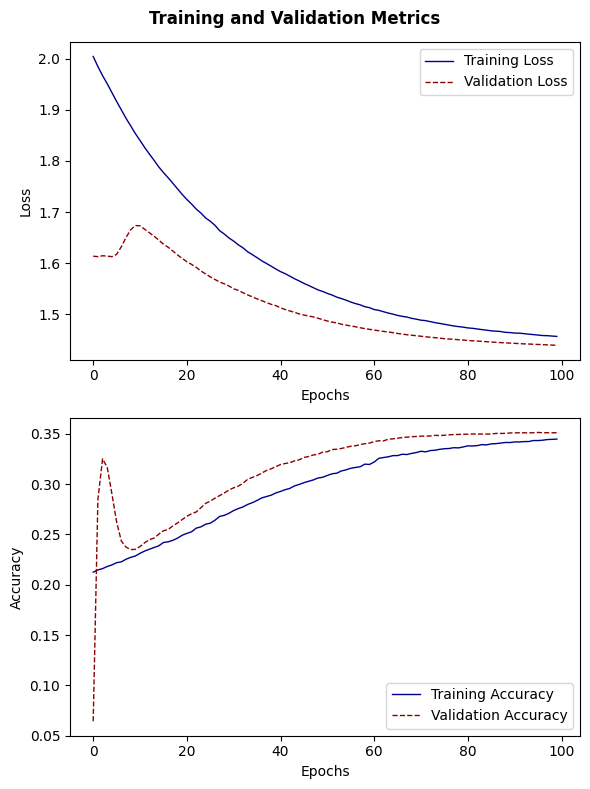

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp5e100nn.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp5e100nn.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp5e100nn.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp5e100nn.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dp5e100nnn = dp5_modele100nn.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp5e100nnn = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp5e100nnn = np.argmax(preds_dp5e100nnn,axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save Training
import json

dp5e100nnn_training = pd.DataFrame(dp5e100nn.history)

dp5e100nnn_json_file = '/content/gdrive/My Drive/dp5e100nnn_training.json'
with open(dp5e100nnn_json_file, mode='w') as f:
    dp5e100nnn_training.to_json(f)


# Save Predictions
preds_dp5e100nnn = pd.DataFrame({"y_true_dp5nnn ": y_true_dp5e100nnn , "y_pred_dp5e100nnn": y_pred_dp5e100nnn})

preds_dp5e100nnn.to_csv('/content/gdrive/My Drive/preds_dp5e100nnn.csv', index=False)

In [ ]:
## ---------- Fit Model -------------
dp5_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 5,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp5_modele100n = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp5_modele100n.compile(optimizer= dp5_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp5e100n = dp5_modele100n.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 68s 789ms/step - loss: 1.3823 - accuracy: 0.3784 - val_loss: 1.3634 - val_accuracy: 0.3846
Epoch 2/100
80/80 [==============================] - 63s 791ms/step - loss: 1.3825 - accuracy: 0.3782 - val_loss: 1.3630 - val_accuracy: 0.3848
Epoch 3/100
80/80 [==============================] - 61s 763ms/step - loss: 1.3818 - accuracy: 0.3785 - val_loss: 1.3626 - val_accuracy: 0.3850
Epoch 4/100
80/80 [==============================] - 69s 861ms/step - loss: 1.3810 - accuracy: 0.3786 - val_loss: 1.3620 - val_accuracy: 0.3850
Epoch 5/100
80/80 [==============================] - 62s 777ms/step - loss: 1.3808 - accuracy: 0.3782 - val_loss: 1.3618 - val_accuracy: 0.3850
Epoch 6/100
80/80 [==============================] - 64s 807ms/step - loss: 1.3807 - accuracy: 0.3786 - val_loss: 1.3612 - val_accuracy: 0.3852
Epoch 7/100
80/80 [==============================] - 67s 836ms/step - loss: 1.3803 - accuracy: 0.3791 - val_loss: 1.3604 - val_accuracy: 0.3860
Epoc

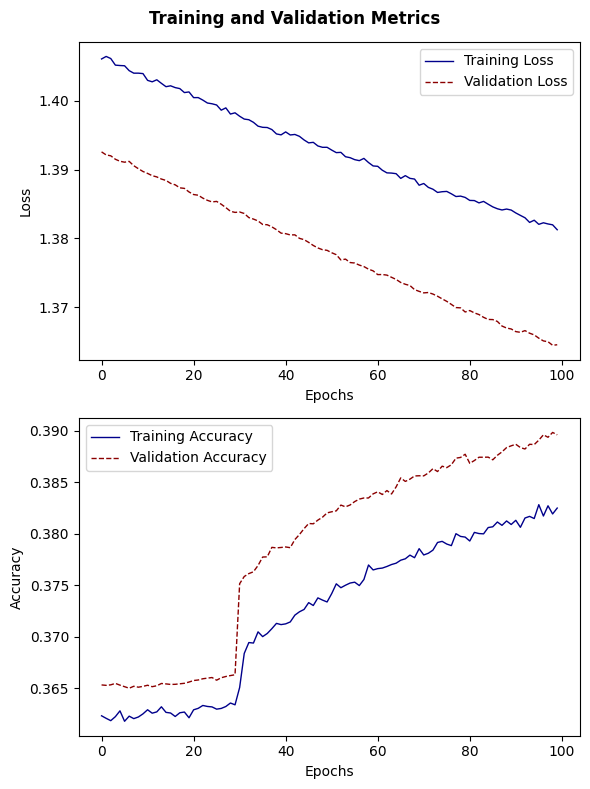

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp5e100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp5e100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp5e100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp5e100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dp5e100nn = dp5_modele100n.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp5e100nn = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp5e100nn = np.argmax(preds_dp5e100nn, axis=1) + 1

3125/3125 [==============================] - 12s 4ms/step


In [ ]:
# Save Training
import json

dp5e100nn_training = pd.DataFrame(dp5e100n.history)

dp5e100nn_json_file = '/content/gdrive/My Drive/dp5e100nn_training.json'
with open(dp5e100nn_json_file, mode='w') as f:
    dp5e100nn_training.to_json(f)


# Save Predictions
preds_dp5e100nn = pd.DataFrame({"y_true_dp5e100nn ": y_true_dp5e100nn , "y_pred_dp5e100nn": y_pred_dp5e100nn})

preds_dp5e100nn.to_csv('/content/gdrive/My Drive/preds_dp5e100nn.csv', index=False)

Epochs = 60

In [ ]:
## ---------- Fit Model -------------
dp5_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 5,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp5_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp5_model.compile(optimizer= dp5_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp5 = dp5_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= dp_epochs,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/60


80/80 [==============================] - 55s 636ms/step - loss: 1.4463 - accuracy: 0.3533 - val_loss: 1.4246 - val_accuracy: 0.3565
Epoch 2/60
80/80 [==============================] - 51s 634ms/step - loss: 1.4456 - accuracy: 0.3537 - val_loss: 1.4238 - val_accuracy: 0.3569
Epoch 3/60
80/80 [==============================] - 51s 632ms/step - loss: 1.4448 - accuracy: 0.3539 - val_loss: 1.4234 - val_accuracy: 0.3571
Epoch 4/60
80/80 [==============================] - 51s 639ms/step - loss: 1.4437 - accuracy: 0.3542 - val_loss: 1.4228 - val_accuracy: 0.3573
Epoch 5/60
80/80 [==============================] - 51s 633ms/step - loss: 1.4432 - accuracy: 0.3546 - val_loss: 1.4222 - val_accuracy: 0.3576
Epoch 6/60
80/80 [==============================] - 51s 632ms/step - loss: 1.4428 - accuracy: 0.3546 - val_loss: 1.4216 - val_accuracy: 0.3578
Epoch 7/60
80/80 [==============================] - 51s 634ms/step - loss: 1.4421 - accuracy: 0.3552 - val_loss: 1.4211 - val_accuracy: 0.3581
Epoch 8/60

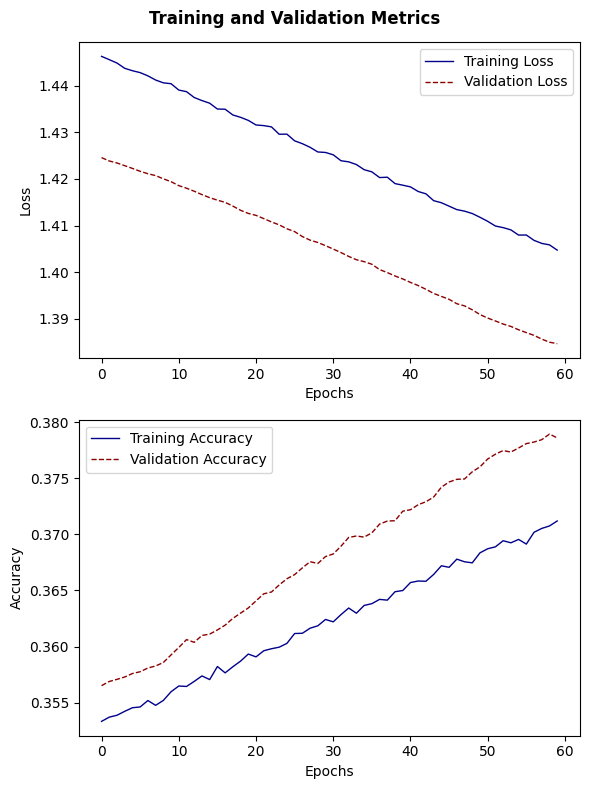

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp5.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp5.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp5.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp5.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# loss and accuracy for each epoch
dp5_train_loss = dp5.history['loss']
dp5_train_accuracy = dp5.history['accuracy']
dp5_val_loss = dp5.history['val_loss']
dp5_val_accuracy = dp5.history['val_accuracy']

In [ ]:
t_statistic, p_value = stats.ttest_rel(base_val_accuracy, dp5_val_accuracy)
print(f't-statistic: {t_statistic}, p-value: {p_value}')

t-statistic: 1.4791267311839313, p-value: 0.14713899150755538


In [ ]:
t_statistic, p_value = stats.ttest_rel(base_val_loss, dp5_val_loss)
print(f't-statistic: {t_statistic}, p-value: {p_value}')

t-statistic: 3.861529692875961, p-value: 0.0004133271808035352


In [ ]:
# Generate predictions
preds_dp5 = dp5_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp5 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp5 = np.argmax(preds_dp5, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Compare "Actual" VS "Predicted" ratings

comparison_dp5 = pd.DataFrame({
    'Actual': y_true_dp5,
    'Predicted': y_pred_dp5
})

print(comparison_dp5.sample(10))  # print 10 random examples

       Actual  Predicted
74911       3          4
41853       4          4
60263       4          4
45679       3          4
30857       4          4
82566       4          4
91015       4          4
30500       5          4
73803       4          4
85771       4          4


In [ ]:
# Calculate "precision" and "recall"

print(classification_report(y_true_dp5, y_pred_dp5))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00      5651
           2       0.00      0.00      0.00     10769
           3       0.32      0.02      0.03     26071
           4       0.35      0.96      0.51     34812
           5       0.52      0.08      0.14     22697

    accuracy                           0.36    100000
   macro avg       0.24      0.21      0.14    100000
weighted avg       0.32      0.36      0.22    100000



In [ ]:
# Binarize the output
y_true_bin_dp5 = label_binarize(y_true_dp5, classes=[1, 2, 3, 4, 5])
y_pred_bin_dp5 = label_binarize(y_pred_dp5, classes=[1, 2, 3, 4, 5])

roc_auc_dict_dp5 = {}
for i in range(5):
    roc_auc_dp5 = roc_auc_score(y_true_bin_dp5[:, i], y_pred_bin_dp5[:, i])
    roc_auc_dict_dp5[f'class {i+1} vs rest'] = roc_auc_dp5

# Print out the results
for k, v in roc_auc_dict_dp5.items():
    print(f"{k}: {v}")

class 1 vs rest: 0.5
class 2 vs rest: 0.5
class 3 vs rest: 0.5021733161612314
class 4 vs rest: 0.5066979459989616
class 5 vs rest: 0.5295888257409804


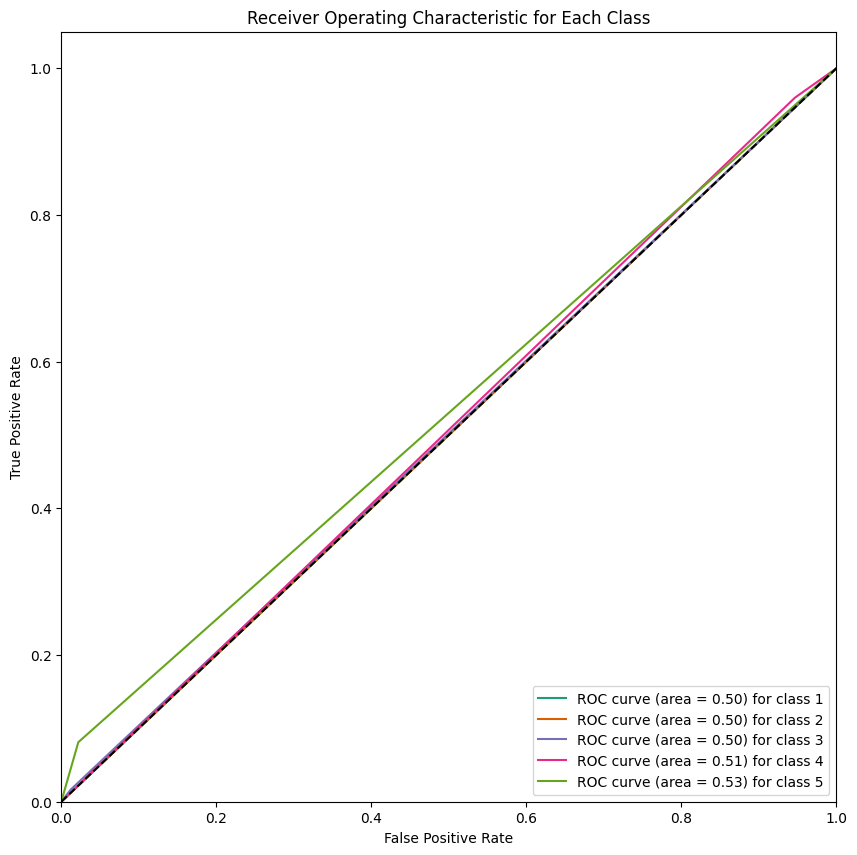

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))

for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin_dp5[:, i], y_pred_bin_dp5[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f}) for class {i+1}')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Each Class')
plt.legend(loc="lower right")
plt.show()

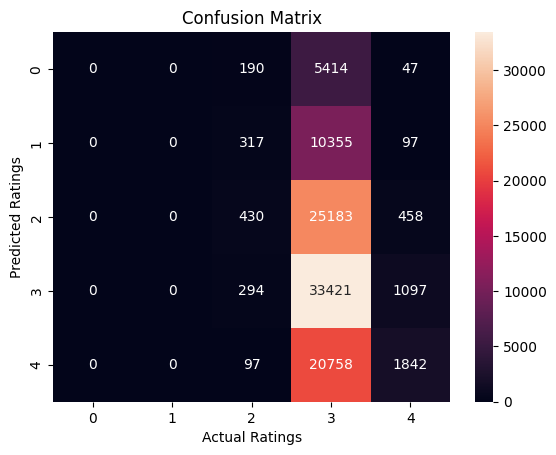

In [ ]:
# Confusion Matrix

conf_mat_dp5 = confusion_matrix(y_true_dp5, y_pred_dp5)
sns.heatmap(conf_mat_dp5, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.show()

In [ ]:
# MSE and RMSE

mse_dp5 = mean_squared_error(y_true_dp5, y_pred_dp5)
rmse_dp5 = np.sqrt(mse_dp5)

print(f"Mean Squared Error: {mse_dp5}")
print(f"Root Mean Squared Error: {rmse_dp5}")


#Accuracy
accuracy_dp5 = accuracy_score(y_true_dp5, y_pred_dp5)

print(f'Test accuracy: {accuracy_dp5 }')

Mean Squared Error: 1.424
Root Mean Squared Error: 1.1933147112141038
Test accuracy: 0.35693


#### 4) DP - Noise 0.8

In [ ]:
## ---------- Fit Model -------------
dph8_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 0.8,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dph8_model40 = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dph8_model40.compile(optimizer= dph8_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dph8e40n = dph8_model40.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 40,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
)

Epoch 1/40


80/80 [==============================] - 55s 636ms/step - loss: 1.3747 - accuracy: 0.3881 - val_loss: 1.3469 - val_accuracy: 0.3930
Epoch 2/40
80/80 [==============================] - 51s 634ms/step - loss: 1.3730 - accuracy: 0.3891 - val_loss: 1.3441 - val_accuracy: 0.3938
Epoch 3/40
80/80 [==============================] - 51s 636ms/step - loss: 1.3700 - accuracy: 0.3900 - val_loss: 1.3414 - val_accuracy: 0.3948
Epoch 4/40
80/80 [==============================] - 51s 634ms/step - loss: 1.3674 - accuracy: 0.3911 - val_loss: 1.3391 - val_accuracy: 0.3956
Epoch 5/40
80/80 [==============================] - 51s 633ms/step - loss: 1.3647 - accuracy: 0.3920 - val_loss: 1.3367 - val_accuracy: 0.3957
Epoch 6/40
80/80 [==============================] - 51s 632ms/step - loss: 1.3619 - accuracy: 0.3930 - val_loss: 1.3341 - val_accuracy: 0.3970
Epoch 7/40
80/80 [==============================] - 50s 630ms/step - loss: 1.3602 - accuracy: 0.3929 - val_loss: 1.3317 - val_accuracy: 0.3977
Epoch 8/40

In [ ]:
# Generate predictions
preds_dph8e40n_r1 = dph8_model40.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dph8e40n_r1 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dph8e40n_r1 = np.argmax(preds_dph8e40n_r1, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save Training
import json

dph8e40n_training_r1 = pd.DataFrame(dph8e40n.history)

dph8e40n_training_r1_json_file = '/content/gdrive/My Drive/dph8e40n_training_r1.json'
with open(dph8e40n_training_r1_json_file, mode='w') as f:
    dph8e40n_training_r1.to_json(f)

# Save Predictions
preds_dph8e40n_r1 = pd.DataFrame({"y_true_dph8e40n_r1": y_true_dph8e40n_r1, "y_pred_dph8e40n_r1": y_pred_dph8e40n_r1})

preds_dph8e40n_r1.to_csv('/content/gdrive/My Drive/preds_dph8e40n_r1.csv', index=False)

In [ ]:
## ---------- Fit Model -------------
dph8_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 0.8,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dph8_model40 = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dph8_model40.compile(optimizer= dph8_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dph8e40n_r2 = dph8_model40.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 40,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
)

Epoch 1/40


80/80 [==============================] - 55s 631ms/step - loss: 1.2955 - accuracy: 0.4232 - val_loss: 1.2747 - val_accuracy: 0.4259
Epoch 2/40
80/80 [==============================] - 51s 632ms/step - loss: 1.2954 - accuracy: 0.4229 - val_loss: 1.2741 - val_accuracy: 0.4261
Epoch 3/40
80/80 [==============================] - 50s 628ms/step - loss: 1.2945 - accuracy: 0.4229 - val_loss: 1.2737 - val_accuracy: 0.4263
Epoch 4/40
80/80 [==============================] - 51s 634ms/step - loss: 1.2933 - accuracy: 0.4241 - val_loss: 1.2731 - val_accuracy: 0.4274
Epoch 5/40
80/80 [==============================] - 50s 625ms/step - loss: 1.2933 - accuracy: 0.4237 - val_loss: 1.2727 - val_accuracy: 0.4275
Epoch 6/40
80/80 [==============================] - 50s 628ms/step - loss: 1.2916 - accuracy: 0.4245 - val_loss: 1.2722 - val_accuracy: 0.4282
Epoch 7/40
80/80 [==============================] - 50s 626ms/step - loss: 1.2919 - accuracy: 0.4250 - val_loss: 1.2719 - val_accuracy: 0.4281
Epoch 8/40

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dph8e40n.history['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(dph8e40n.history['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dph8e40n.history['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(dph8e40n.history['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [ ]:
# Generate predictions
preds_dph8e40n = dph8_model40.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dph8e40n = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dph8e40n = np.argmax(preds_dph8e40n, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error
from sklearn.preprocessing import LabelBinarizer
from math import sqrt

# Converting your predictions and true labels to the closest integers
y_true_dph8e40n = np.rint(y_true_dph8e40n).astype(int)
y_pred_dph8e40n  = np.rint(y_pred_dph8e40n ).astype(int)

# Precision, recall, F1-score per class
report = classification_report(y_true_dph8e40n, y_pred_dph8e40n , output_dict=True)
df_metrics = pd.DataFrame(report).transpose()

# Accuracy
accuracy = accuracy_score(y_true_dph8e40n, y_pred_dph8e40n )

# MSE
mse = mean_squared_error(y_true_dph8e40n, y_pred_dph8e40n )

# RMSE
rmse = sqrt(mse)

# Adding accuracy, MSE and RMSE to the dataframe
df_metrics.loc['accuracy'] = [accuracy] * 4
df_metrics.loc['MSE'] = [mse] * 4
df_metrics.loc['RMSE'] = [rmse] * 4

# Showing the dataframe
print(df_metrics)

              precision  recall  f1-score    support
1                 0.440   0.018     0.035   5651.000
2                 0.374   0.004     0.008  10769.000
3                 0.353   0.345     0.349  26071.000
4                 0.391   0.759     0.516  34812.000
5                 0.531   0.157     0.242  22697.000
accuracy          0.391   0.391     0.391      0.391
macro avg         0.418   0.257     0.230 100000.000
weighted avg      0.414   0.391     0.329 100000.000
MSE               1.144   1.144     1.144      1.144
RMSE              1.069   1.069     1.069      1.069


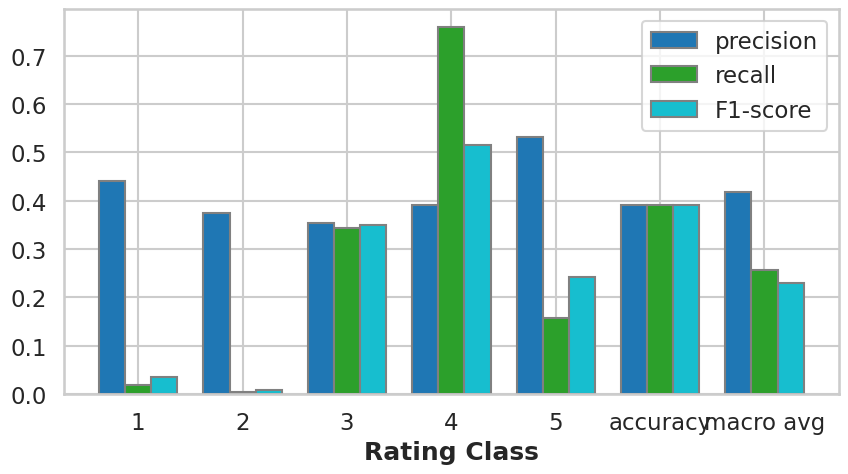

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract precision, recall and F1-score
precision = df_metrics['precision'][:-3]  # excluding the last three rows (avg / total, accuracy, MSE, RMSE)
recall = df_metrics['recall'][:-3]
f1 = df_metrics['f1-score'][:-3]

# Get bar width and positions
barWidth = 0.25
r1 = np.arange(len(precision))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Set style
sns.set_style("whitegrid")

# Create plot
fig, ax = plt.subplots(figsize=(10, 5))

# Add bars
plt.bar(r1, precision.values, color='#1f77b4', width=barWidth, edgecolor='grey', label='precision')
plt.bar(r2, recall.values, color='#2ca02b', width=barWidth, edgecolor='grey', label='recall')
plt.bar(r3, f1.values, color='#17becf', width=barWidth, edgecolor='grey', label='F1-score')

# Add xticks on the middle of the group bars
plt.xlabel('Rating Class', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision))], precision.index)

# Create legend & show graphic
plt.legend()
plt.show()


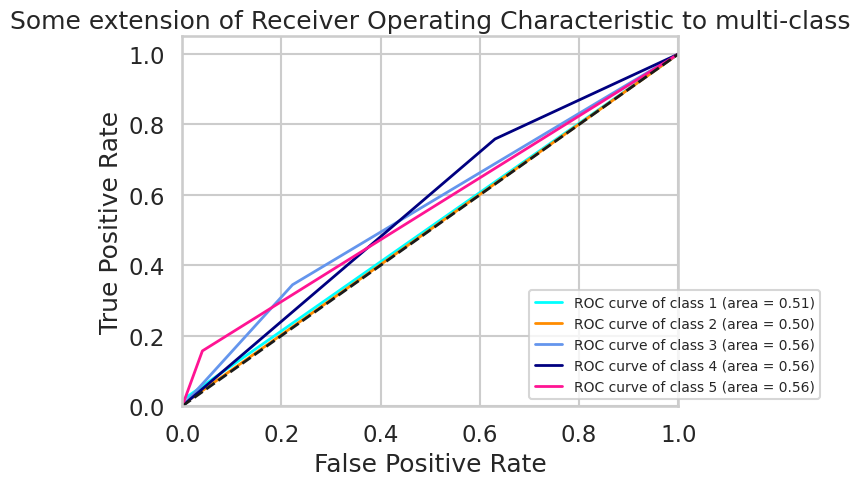

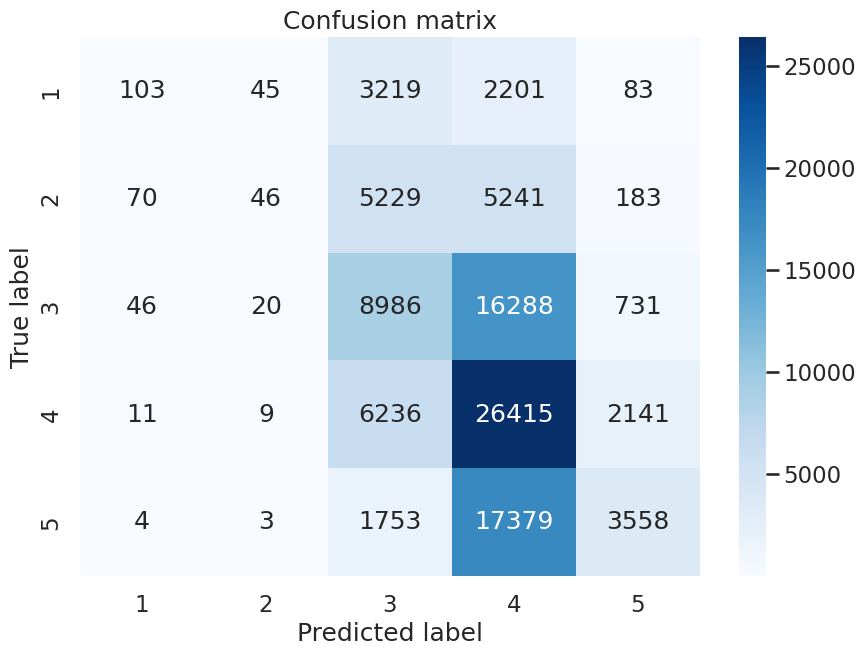

In [ ]:
# Plot all ROC curves
plt.figure()

colors = ['aqua', 'darkorange', 'cornflowerblue', 'navy', 'deeppink']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc[i])) # +1 to shift class range from 0-4 to 1-5

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver Operating Characteristic to multi-class')

# Plot legend with smaller font size and move it outside the plot
plt.legend(loc="lower right", bbox_to_anchor=(1.3, 0), prop={'size': 10})
plt.show()

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true_dph8e40n, y_pred_dph8e40n)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cnf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[1, 2, 3, 4, 5], yticklabels=[1, 2, 3, 4, 5])
plt.title('Confusion matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()



In [ ]:
## Load Training Results

dph8 = pd.read_json('/content/gdrive/My Drive/dph8_training.json')

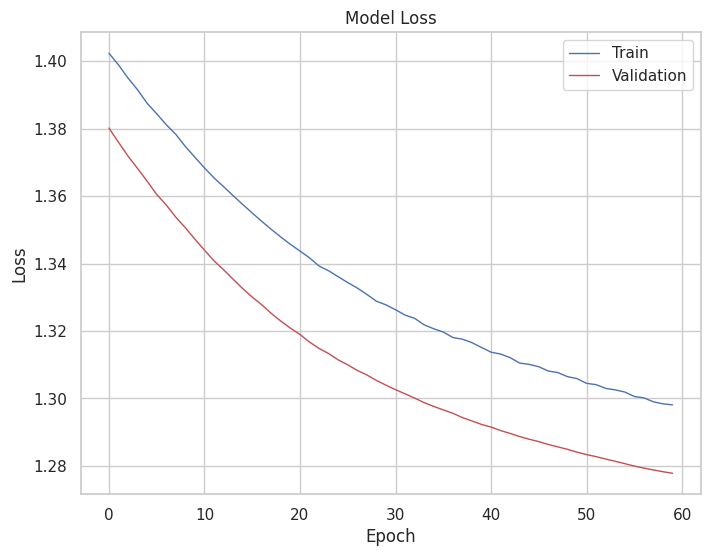

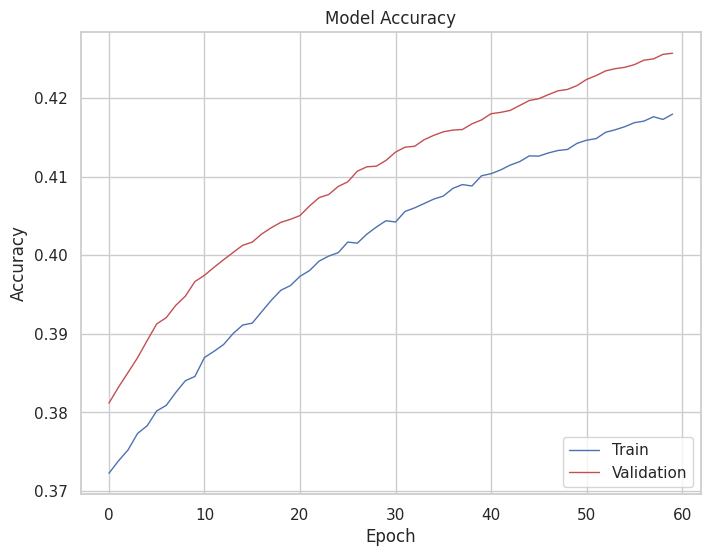

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dph8['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(dph8['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dph8['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(dph8['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

Epochs 100

In [ ]:
## ---------- Fit Model -------------
dph8_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 0.8,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dph8_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dph8_model.compile(optimizer= dph8_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dph8e100n = dph8_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 55s 640ms/step - loss: 1.3807 - accuracy: 0.3832 - val_loss: 1.3624 - val_accuracy: 0.3904
Epoch 2/100
80/80 [==============================] - 51s 636ms/step - loss: 1.3791 - accuracy: 0.3842 - val_loss: 1.3607 - val_accuracy: 0.3911
Epoch 3/100
80/80 [==============================] - 51s 634ms/step - loss: 1.3775 - accuracy: 0.3849 - val_loss: 1.3588 - val_accuracy: 0.3923
Epoch 4/100
80/80 [==============================] - 51s 641ms/step - loss: 1.3750 - accuracy: 0.3861 - val_loss: 1.3570 - val_accuracy: 0.3932
Epoch 5/100
80/80 [==============================] - 51s 637ms/step - loss: 1.3740 - accuracy: 0.3869 - val_loss: 1.3552 - val_accuracy: 0.3939
Epoch 6/100
80/80 [==============================] - 51s 641ms/step - loss: 1.3729 - accuracy: 0.3871 - val_loss: 1.3534 - val_accuracy: 0.3944
Epoch 7/100
80/80 [==============================] - 51s 638ms/step - loss: 1.3712 - accuracy: 0.3884 - val_loss: 1.3518 - val_accuracy: 0.3956
Epoc

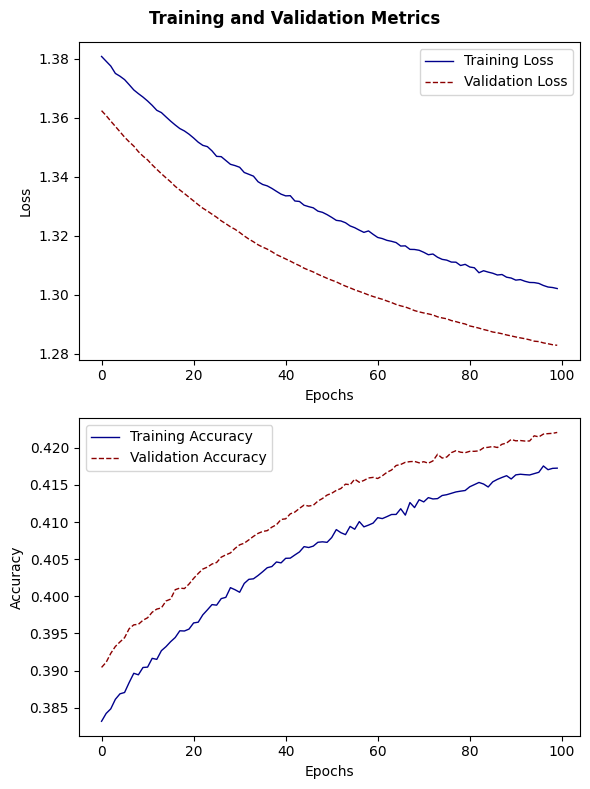

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dph8e100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dph8e100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dph8e100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dph8e100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dph8e100n = dph8_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dph8e100n = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dph8e100n = np.argmax(preds_dph8e100n, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
dph8e100n_training = pd.DataFrame(dph8e100n.history)

dph8e100n_json_file = '/content/gdrive/My Drive/dph8e100n_training.json'
with open(dph8e100n_json_file, mode='w') as f:
    dph8e100n_training.to_json(f)


# Save Predictions
preds_dph8e100n = pd.DataFrame({"y_true_dph8e100n ": y_true_dph8e100n , "y_pred_dph8e100n": y_pred_dph8e100n})

preds_dph8e100n.to_csv('/content/gdrive/My Drive/preds_dph8e100n.csv', index=False)

In [ ]:
## ---------- Fit Model -------------
dph8_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 0.8,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dph8e100_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dph8e100_model.compile(optimizer= dph8_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dph8e100nn = dph8e100_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 76s 873ms/step - loss: 1.3019 - accuracy: 0.4166 - val_loss: 1.2811 - val_accuracy: 0.4221
Epoch 2/100
80/80 [==============================] - 72s 900ms/step - loss: 1.3011 - accuracy: 0.4173 - val_loss: 1.2803 - val_accuracy: 0.4224
Epoch 3/100
80/80 [==============================] - 71s 896ms/step - loss: 1.2994 - accuracy: 0.4179 - val_loss: 1.2795 - val_accuracy: 0.4234
Epoch 4/100
80/80 [==============================] - 71s 889ms/step - loss: 1.2991 - accuracy: 0.4177 - val_loss: 1.2788 - val_accuracy: 0.4235
Epoch 5/100
80/80 [==============================] - 71s 890ms/step - loss: 1.2982 - accuracy: 0.4189 - val_loss: 1.2783 - val_accuracy: 0.4240
Epoch 6/100
80/80 [==============================] - 70s 874ms/step - loss: 1.2983 - accuracy: 0.4186 - val_loss: 1.2778 - val_accuracy: 0.4240
Epoch 7/100
80/80 [==============================] - 73s 915ms/step - loss: 1.2970 - accuracy: 0.4190 - val_loss: 1.2772 - val_accuracy: 0.4243
Epoc

In [ ]:
# Generate predictions
preds_dph8e100nn = dph8e100_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dph8e100nn = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dph8e100nn = np.argmax(preds_dph8e100nn, axis=1) + 1

3125/3125 [==============================] - 15s 5ms/step


In [ ]:
# Save Weight
dph8e100nn_training = pd.DataFrame(dph8e100nn.history)

dph8e100nn_json_file = '/content/gdrive/My Drive/dph8e100nn_training.json'
with open(dph8e100nn_json_file, mode='w') as f:
    dph8e100nn_training.to_json(f)


# Save Predictions
preds_dph8e100nn = pd.DataFrame({"y_true_dph8e100nn ": y_true_dph8e100nn , "y_pred_dph8e100nn": y_pred_dph8e100nn})

preds_dph8e100nn.to_csv('/content/gdrive/My Drive/preds_dph8e100nn.csv', index=False)

Epochs 60

In [ ]:
## ---------- Fit Model -------------
dph8_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 0.8,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dph8_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dph8_model.compile(optimizer= dph8_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dph8 = dph8_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 60,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/60


80/80 [==============================] - 55s 641ms/step - loss: 1.4024 - accuracy: 0.3723 - val_loss: 1.3802 - val_accuracy: 0.3812
Epoch 2/60
80/80 [==============================] - 51s 636ms/step - loss: 1.3990 - accuracy: 0.3738 - val_loss: 1.3760 - val_accuracy: 0.3832
Epoch 3/60
80/80 [==============================] - 51s 639ms/step - loss: 1.3950 - accuracy: 0.3752 - val_loss: 1.3719 - val_accuracy: 0.3851
Epoch 4/60
80/80 [==============================] - 51s 642ms/step - loss: 1.3916 - accuracy: 0.3773 - val_loss: 1.3682 - val_accuracy: 0.3870
Epoch 5/60
80/80 [==============================] - 51s 637ms/step - loss: 1.3876 - accuracy: 0.3783 - val_loss: 1.3644 - val_accuracy: 0.3891
Epoch 6/60
80/80 [==============================] - 51s 641ms/step - loss: 1.3844 - accuracy: 0.3802 - val_loss: 1.3605 - val_accuracy: 0.3913
Epoch 7/60
80/80 [==============================] - 51s 636ms/step - loss: 1.3812 - accuracy: 0.3809 - val_loss: 1.3574 - val_accuracy: 0.3921
Epoch 8/60

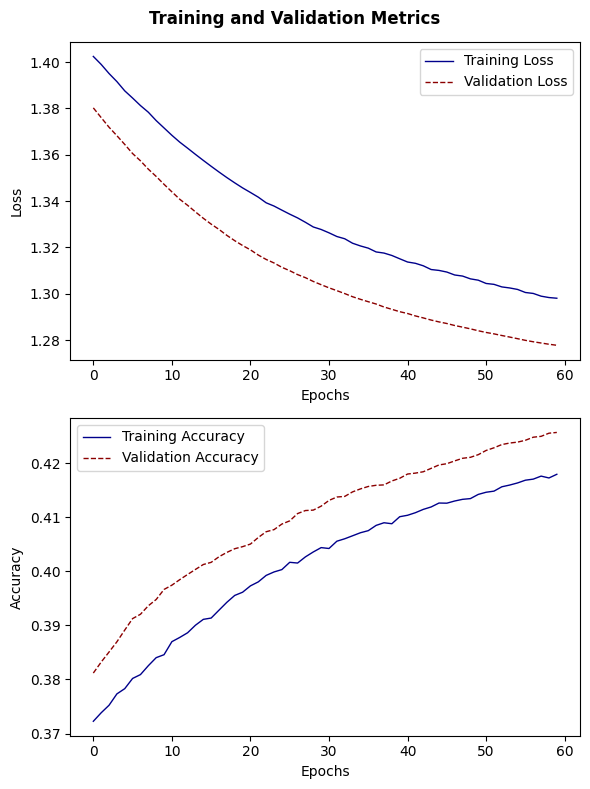

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dph8.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dph8.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dph8.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dph8.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# loss and accuracy for each epoch
dph8_train_loss = dph8.history['loss']
dph8_train_accuracy = dph8.history['accuracy']
dph8_val_loss = dph8.history['val_loss']
dph8_val_accuracy = dph8.history['val_accuracy']

In [ ]:
# Assuming DLRS_accuracy and dp2_accuracy are lists of validation accuracy for each epoch
t_statistic, p_value = stats.ttest_rel(base_val_accuracy, dph8_val_accuracy)
print(f't-statistic: {t_statistic}, p-value: {p_value}')


t_statistic, p_value = stats.ttest_rel(base_val_loss, dph8_val_loss)
print(f't-statistic: {t_statistic}, p-value: {p_value}')


NameError: ignored

In [ ]:
# Generate Predictions (DP- Noise2)

# Generate predictions
preds_dph8 = dph8_model.predict([dp_test_user, dp_test_movie])

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Convert the predictions and true values from one-hot encoded to their original form
y_true_dph8 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dph8 = np.argmax(preds_dph8, axis=1) + 1

In [ ]:
# Compare "Actual" VS "Predicted" ratings

comparison_dph8 = pd.DataFrame({
    'Actual': y_true_dph8,
    'Predicted': y_pred_dph8
})

print(comparison_dph8.sample(10))  # print 10 random examples


       Actual  Predicted
78520       4          4
79560       4          3
9620        2          4
61048       3          3
70198       4          5
17041       4          4
86216       2          3
58051       5          4
48466       2          4
55045       3          3


In [ ]:
# Calculate "precision" and "recall"

print(classification_report(y_true_dph8, y_pred_dph8))



              precision    recall  f1-score   support

           1       0.60      0.01      0.03      5651
           2       0.29      0.03      0.05     10769
           3       0.36      0.38      0.37     26071
           4       0.41      0.71      0.52     34812
           5       0.53      0.25      0.34     22697

    accuracy                           0.41    100000
   macro avg       0.44      0.28      0.26    100000
weighted avg       0.42      0.41      0.36    100000



In [ ]:
# Binarize the output
y_true_bin_dph8 = label_binarize(y_true_dph8, classes=[1, 2, 3, 4, 5])
y_pred_bin_dph8 = label_binarize(y_pred_dph8, classes=[1, 2, 3, 4, 5])

roc_auc_dict_dph8 = {}
for i in range(5):
    roc_auc_dph8 = roc_auc_score(y_true_bin_dph8[:, i], y_pred_bin_dph8[:, i])
    roc_auc_dict_dph8[f'class {i+1} vs rest'] = roc_auc_dph8

# Print out the results
for k, v in roc_auc_dict_dph8.items():
    print(f"{k}: {v}")


class 1 vs rest: 0.5067143406816005
class 2 vs rest: 0.5092892111211185
class 3 vs rest: 0.5720685237881281
class 4 vs rest: 0.580203623363796
class 5 vs rest: 0.5934935029590224


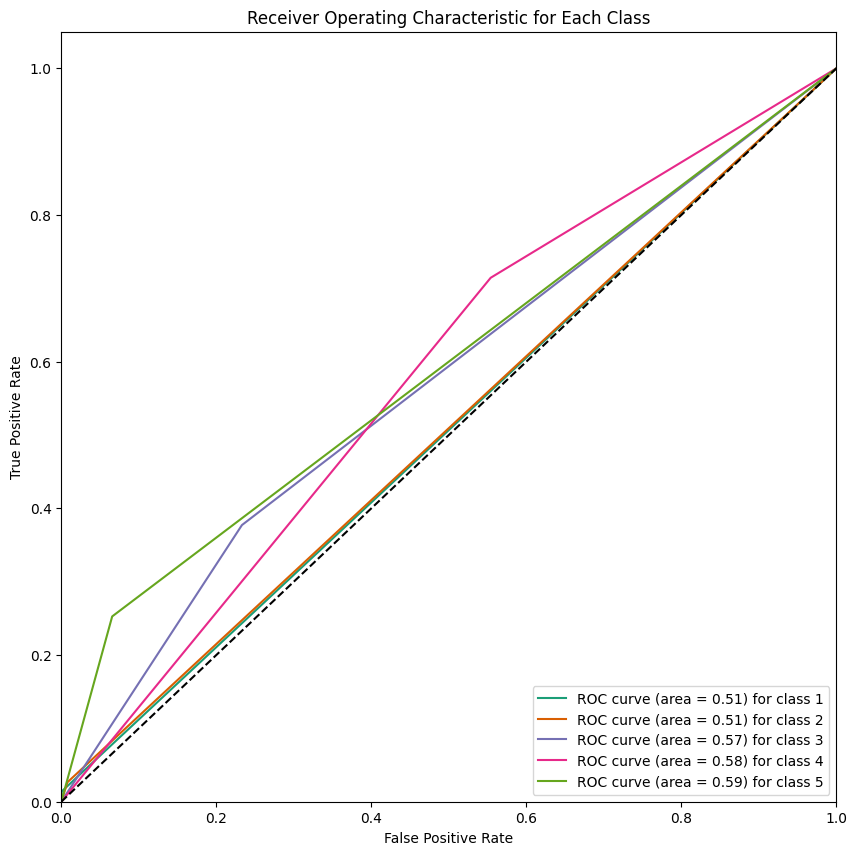

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))

for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin_dph8[:, i], y_pred_bin_dph8[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f}) for class {i+1}')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Each Class')
plt.legend(loc="lower right")
plt.show()


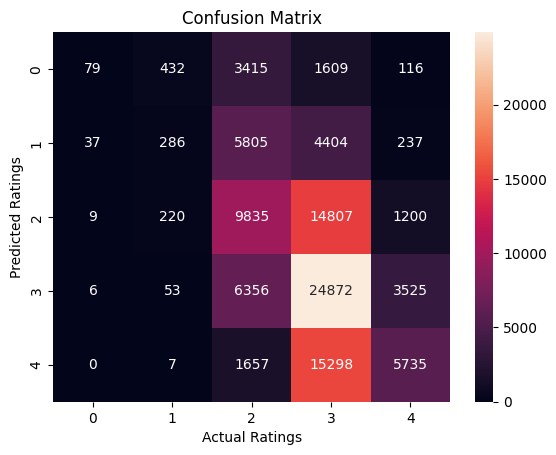

In [ ]:
# Confusion Matrix

conf_mat_dph8 = confusion_matrix(y_true_dph8, y_pred_dph8)
sns.heatmap(conf_mat_dph8, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.show()

In [ ]:
# MSE and RMSE

mse_dph8 = mean_squared_error(y_true_dph8, y_pred_dph8)
rmse_dph8 = np.sqrt(mse_dph8)

print(f"Mean Squared Error: {mse_dph8}")
print(f"Root Mean Squared Error: {rmse_dph8}")

#Accuracy
accuracy_dph8 = accuracy_score(y_true_dph8, y_pred_dph8)

print(f'Test accuracy: {accuracy_dph8}')

Mean Squared Error: 1.08019
Root Mean Squared Error: 1.0393218943137876
Test accuracy: 0.40807


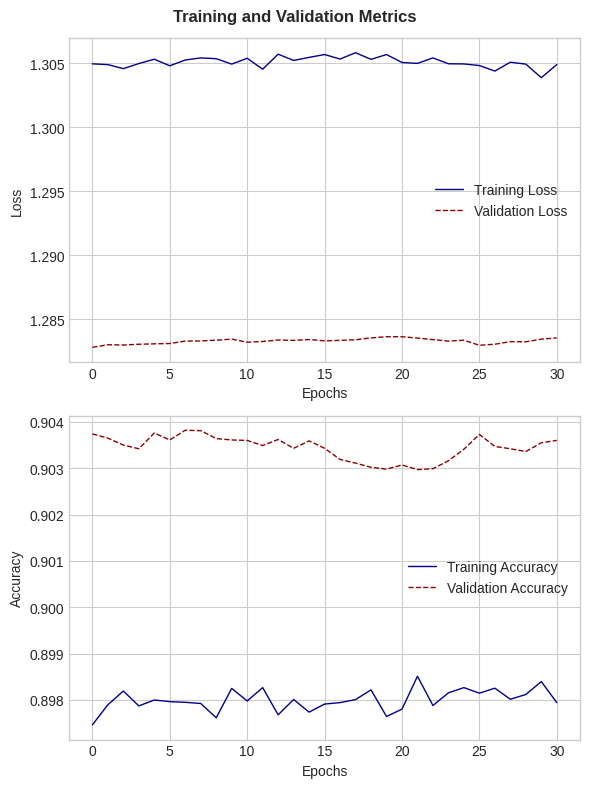

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp5.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp5.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp5.history['top_k_categorical_accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp5.history['val_top_k_categorical_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

#### 5) DP - Noise 1.5

Epoch 40

In [ ]:
## ---------- Fit Model -------------
dph15_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 1.5,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dph15_model40 = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dph15_model40.compile(optimizer= dph15_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dph15e40n = dph15_model40.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 40,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
)

Epoch 1/40


80/80 [==============================] - 55s 632ms/step - loss: 1.3083 - accuracy: 0.4163 - val_loss: 1.2853 - val_accuracy: 0.4198
Epoch 2/40
80/80 [==============================] - 50s 629ms/step - loss: 1.3081 - accuracy: 0.4163 - val_loss: 1.2849 - val_accuracy: 0.4202
Epoch 3/40
80/80 [==============================] - 50s 631ms/step - loss: 1.3081 - accuracy: 0.4167 - val_loss: 1.2844 - val_accuracy: 0.4205
Epoch 4/40
80/80 [==============================] - 50s 626ms/step - loss: 1.3075 - accuracy: 0.4172 - val_loss: 1.2842 - val_accuracy: 0.4202
Epoch 5/40
80/80 [==============================] - 51s 632ms/step - loss: 1.3065 - accuracy: 0.4171 - val_loss: 1.2839 - val_accuracy: 0.4208
Epoch 6/40
68/80 [========================>.....] - ETA: 7s - loss: 1.3057 - accuracy: 0.4175

KeyboardInterrupt: ignored

Epoch 100

In [ ]:
## ---------- Fit Model -------------
dp15_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 1.5,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp15_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp15_model.compile(optimizer= dp15_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp15e100n = dp15_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
    callbacks=[early_stopping],
)

Epoch 1/100


80/80 [==============================] - 57s 658ms/step - loss: 1.3119 - accuracy: 0.4132 - val_loss: 1.2906 - val_accuracy: 0.4167
Epoch 2/100
80/80 [==============================] - 52s 646ms/step - loss: 1.3105 - accuracy: 0.4142 - val_loss: 1.2899 - val_accuracy: 0.4173
Epoch 3/100
80/80 [==============================] - 52s 648ms/step - loss: 1.3100 - accuracy: 0.4141 - val_loss: 1.2893 - val_accuracy: 0.4176
Epoch 4/100
80/80 [==============================] - 52s 644ms/step - loss: 1.3087 - accuracy: 0.4144 - val_loss: 1.2886 - val_accuracy: 0.4183
Epoch 5/100
80/80 [==============================] - 51s 640ms/step - loss: 1.3080 - accuracy: 0.4144 - val_loss: 1.2883 - val_accuracy: 0.4187
Epoch 6/100
80/80 [==============================] - 51s 640ms/step - loss: 1.3077 - accuracy: 0.4150 - val_loss: 1.2879 - val_accuracy: 0.4190
Epoch 7/100
80/80 [==============================] - 51s 639ms/step - loss: 1.3074 - accuracy: 0.4147 - val_loss: 1.2876 - val_accuracy: 0.4192
Epoc

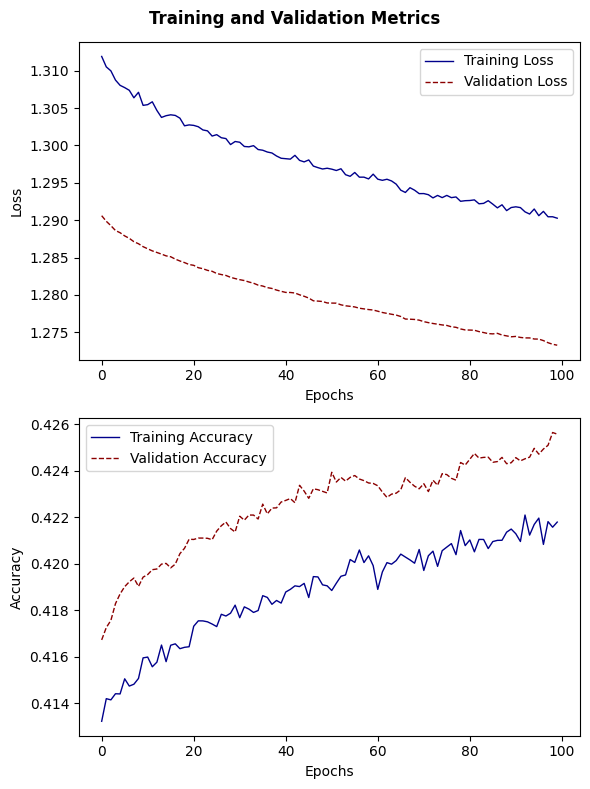

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp15e100n.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp15e100n.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp15e100n.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp15e100n.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dp15e100n = dp15_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp15e100n = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp15e100n = np.argmax(preds_dp15e100n, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save Training
import json

dp15e100n_training = pd.DataFrame(dp15e100n.history)

dp15e100n_json_file = '/content/gdrive/My Drive/dp15e10n_training.json'
with open(dp15e100n_json_file, mode='w') as f:
    dp15e100n_training.to_json(f)


# Save Predictions
preds_dp15e100n = pd.DataFrame({"y_true_dp15e100n ": y_true_dp15e100n , "y_pred_dp15e100n": y_pred_dp15e100n})

preds_dp15e100n.to_csv('/content/gdrive/My Drive/preds_dp15e100n.csv', index=False)

#### 6) DP - Noise 250

In [ ]:
## ---------- Fit Model -------------
dp250_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
    l2_norm_clip= dp_l2_norm_clip,
    noise_multiplier= 250,
    num_microbatches= dp_num_microbatches,
    learning_rate= dp_learning_rate)

dp250_model = Model(inputs=[dp_user_input, dp_movie_input], outputs= dp_x)
dp250_model.compile(optimizer= dp250_optimizer,
                  loss= dp_loss,
                 metrics=['accuracy'])

dp250e100 = dp250_model.fit(
    x=[dp_train_user, dp_train_movie],
    y= dp_train_ratings_one_hot,
    epochs= 100,
    batch_size= dp_batch_size,
    validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
)

Epoch 1/100


80/80 [==============================] - 56s 653ms/step - loss: 1.3025 - accuracy: 0.4175 - val_loss: 1.2832 - val_accuracy: 0.4214
Epoch 2/100
80/80 [==============================] - 51s 637ms/step - loss: 1.3024 - accuracy: 0.4173 - val_loss: 1.2832 - val_accuracy: 0.4215
Epoch 3/100
80/80 [==============================] - 51s 636ms/step - loss: 1.3030 - accuracy: 0.4167 - val_loss: 1.2833 - val_accuracy: 0.4216
Epoch 4/100
80/80 [==============================] - 51s 635ms/step - loss: 1.3029 - accuracy: 0.4172 - val_loss: 1.2835 - val_accuracy: 0.4210
Epoch 5/100
80/80 [==============================] - 50s 631ms/step - loss: 1.3028 - accuracy: 0.4168 - val_loss: 1.2835 - val_accuracy: 0.4216
Epoch 6/100
80/80 [==============================] - 51s 635ms/step - loss: 1.3032 - accuracy: 0.4167 - val_loss: 1.2835 - val_accuracy: 0.4212
Epoch 7/100
80/80 [==============================] - 50s 631ms/step - loss: 1.3033 - accuracy: 0.4168 - val_loss: 1.2838 - val_accuracy: 0.4211
Epoc

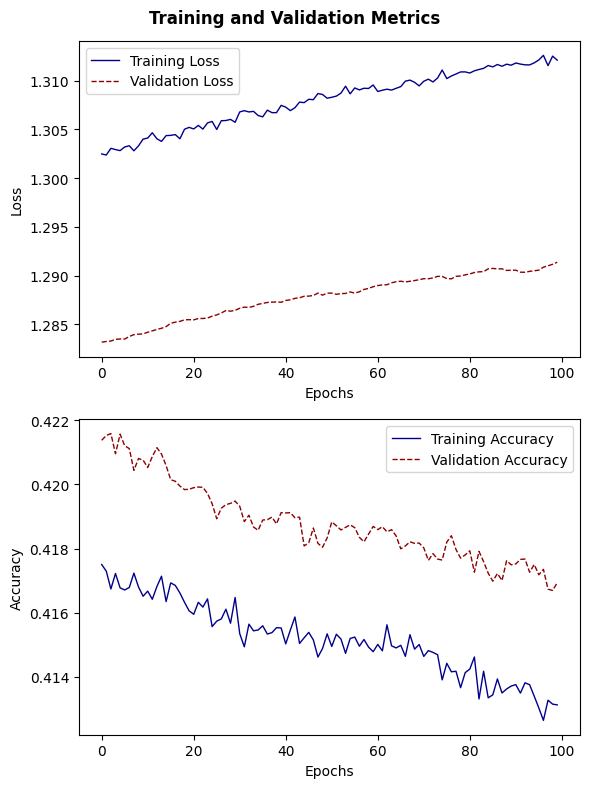

In [ ]:
# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Plot the training and validation loss
ax1.plot(dp250e100.history['loss'], label='Training Loss', linestyle='-', color='darkblue', linewidth=1)
ax1.plot(dp250e100.history['val_loss'], label='Validation Loss', linestyle='--', color='darkred', linewidth=1)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot the training and validation accuracy
ax2.plot(dp250e100.history['accuracy'], label='Training Accuracy', linestyle='-', color='darkblue', linewidth=1)
ax2.plot(dp250e100.history['val_accuracy'], label='Validation Accuracy', linestyle='--', color='darkred', linewidth=1)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Set the title for the overall plot
plt.suptitle('Training and Validation Metrics', fontsize=12, fontweight='bold')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the plot to a file
plt.savefig('metrics_plot.png', dpi=500)

# Display the plot
plt.show()

In [ ]:
# Generate predictions
preds_dp250e100 = dp250_model.predict([dp_test_user, dp_test_movie])

# Convert the predictions and true values from one-hot encoded to their original form
y_true_dp250e100 = np.argmax(dp_test_ratings_one_hot, axis=1) + 1  # Adding 1 because original ratings start from 1
y_pred_dp250e100 = np.argmax(preds_dp250e100, axis=1) + 1

3125/3125 [==============================] - 5s 2ms/step


In [ ]:
# Save weights
dp250_model.save_weights('/content/gdrive/My Drive/dp250_model_weights.h5')

# Save Training
import json

dp250e100_training = pd.DataFrame(dp250e100.history)

dp250e100_json_file = '/content/gdrive/My Drive/dp250e100_training.json'
with open(dp250e100_json_file, mode='w') as f:
   dp250e100_training.to_json(f)


# Save Predictions
preds_dp250e100 = pd.DataFrame({"y_true_dp250e100 ": y_true_dp250e100 , "y_pred_dp250e100": y_pred_dp250e100})

preds_dp250e100.to_csv('/content/gdrive/My Drive/preds_dp250e100.csv', index=False)

### Note: Calculate Epsilon

In [ ]:
# Compute the privacy budget
eps, _ = tfp.compute_dp_sgd_privacy(
    n= N,
    batch_size= dp_batch_size,
    noise_multiplier= 250,
    epochs= 100,
    delta= 1e-5
    )

print('For delta=1e-5, the current epsilon is: %.2f' % eps)

For delta=1e-5, the current epsilon is: 0.01


#Step7: Comparing Model

- Compare model accuracy with and without privacy protection

- Test model against "membership inference attack" against
    -  assess if the attacker is able to "guess" whether a particular sample was present in the training set.
    - use the TF Privacy Report to visualize results from multiple models and model checkpoints.

- measure the DP guarantee achieved by a training algorithm

- Low privacy budget
    - tightly bound
    - strong privacy guarantee
    - it is harder for a single training point to affect the outcome of learning



# Appendix (saved model)

## 1) DLRS (Epochs 100)

In [ ]:
## Load Saved Model

#1) Load Training History
DLRS_e100nn = pd.read_json('/content/gdrive/My Drive/DLRSe100nn_training.json')

#2) Load Predictions
preds_e100nn = pd.read_csv('/content/gdrive/My Drive/preds_e100nn.csv')

In [ ]:
y_true_e100nn = preds_e100nn['y_true_e100nn '].values
y_pred_e100nn = preds_e100nn['y_pred_e100nn'].values

## 2) DP-DLRS (Noise = 0.8 / Epoch 100)

In [ ]:
## Load Saved Model

#1) Load Training History
dph8e100nn = pd.read_json('/content/gdrive/My Drive/dph8e100nn_training.json')

#2) Load Predictions
preds_dph8e100nn = pd.read_csv('/content/gdrive/My Drive/preds_dph8e100nn.csv')

In [ ]:
y_true_dph8e100nn = preds_dph8e100nn['y_true_dph8e100nn '].values
y_pred_dph8e100nn = preds_dph8e100nn['y_pred_dph8e100nn'].values

## 3) DP-DLRS (Noise = 1.5 / Epoch 100)

In [ ]:
## Load Saved Model

#1) Load Training History
dp15e100n = pd.read_json('/content/gdrive/My Drive/dp15e10n_training.json')

#2) Load Predictions
preds_dp15e100n = pd.read_csv('/content/gdrive/My Drive/preds_dp15e100n.csv')

y_true_dp15e100n = preds_dp15e100n['y_true_dp15e100n '].values
y_pred_dp15e100n = preds_dp15e100n['y_pred_dp15e100n'].values



## 4) DP-DLRS (Noise = 2 / Epoch 100)

In [ ]:
## Load Saved Model

#1) Load Training History
dp2e100nn = pd.read_json('/content/gdrive/My Drive/dp2e100nn_training.json')

#2) Load Predictions
preds_dp2e100nn = pd.read_csv('/content/gdrive/My Drive/preds_dp2e100nn.csv')

In [ ]:
y_true_dp2e100nn = preds_dp2e100nn['y_true_dp2e100nn '].values
y_pred_dp2e100nn = preds_dp2e100nn['y_pred_dp2e100nn'].values

## 5) DP-DLRS (Noise = 3 / Epoch 100)

In [ ]:
## Load Saved Model

#1) Load Training History
dp3e100nn = pd.read_json('/content/gdrive/My Drive/dp3e100nn_training.json')

#2) Load Predictions
preds_dp3e100nn = pd.read_csv('/content/gdrive/My Drive/preds_dp3e100nn.csv')

In [ ]:
y_true_dp3e100nn = preds_dp3e100nn['y_true_dp3e100nn '].values
y_pred_dp3e100nn = preds_dp3e100nn['y_pred_dp3e100nn'].values

## 6) DP-DLRS (Noise = 5 / Epoch 100)

In [ ]:
## Load Saved Model

#1) Load Training History
dp5e100nn = pd.read_json('/content/gdrive/My Drive/dp5e100nn_training.json')

#2) Load Predictions
preds_dp5e100nn = pd.read_csv('/content/gdrive/My Drive/preds_dp5e100nn.csv')

In [ ]:
y_true_dp5e100nn = preds_dp5e100nn['y_true_dp5e100nn '].values
y_pred_dp5e100nn = preds_dp5e100nn['y_pred_dp5e100nn'].values

In [ ]:
#1) Load Training History
dp5e100nnn = pd.read_json('/content/gdrive/My Drive/dp5e100nnn_training.json')

#2) Load Predictions
preds_dp5e100nnn = pd.read_csv('/content/gdrive/My Drive/preds_dp5e100nnn.csv')

In [ ]:
y_true_dp5e100nnn = preds_dp5e100nnn['y_true_dp5nnn '].values
y_pred_dp5e100nnn = preds_dp5e100nnn['y_pred_dp5e100nnn'].values

## 7) DP-DLRS (Epoch 40)

In [ ]:
## Load Saved Model

#1) Load Training History
DLRSe40 = pd.read_json('/content/gdrive/My Drive/DLRSe40_training.json')

#2) Load Predictions
preds_DLRSe40 = pd.read_csv('/content/gdrive/My Drive/preds_DLRSe40.csv')

In [ ]:
y_true = preds_DLRSe40['y_true '].values
y_pred = preds_DLRSe40['y_pred'].values

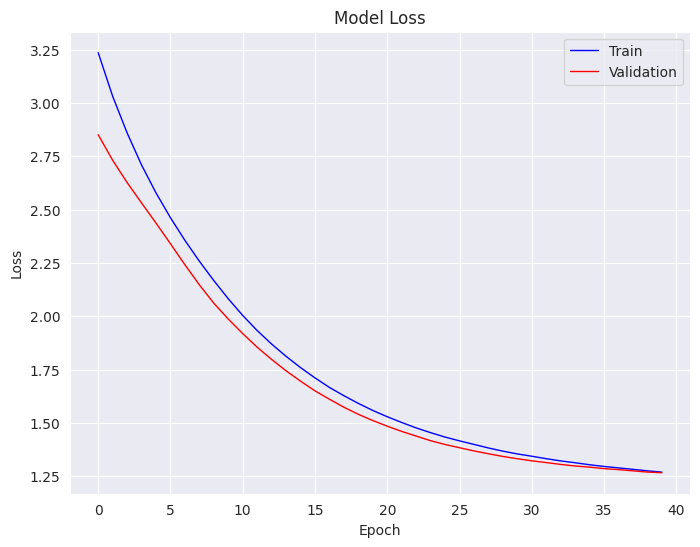

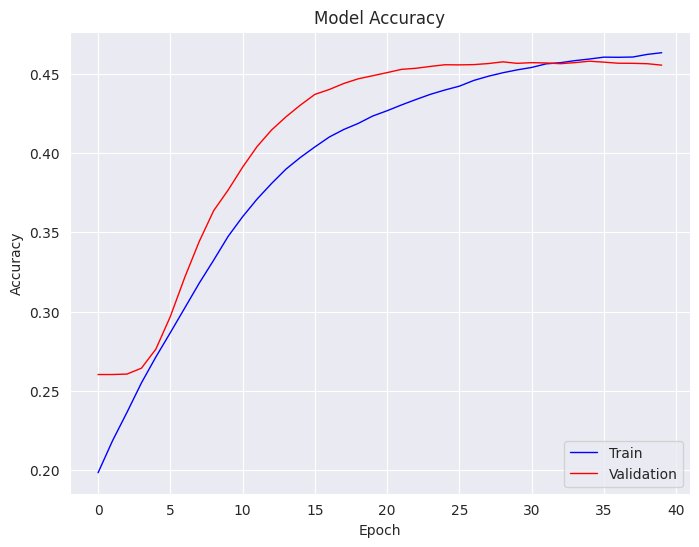

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(DLRSe40['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(DLRSe40['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(DLRSe40['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(DLRSe40['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [ ]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error
from sklearn.preprocessing import LabelBinarizer
from math import sqrt

# Converting your predictions and true labels to the closest integers
y_true = np.rint(y_true).astype(int)
y_pred = np.rint(y_pred).astype(int)

# Precision, recall, F1-score per class
report = classification_report(y_true, y_pred, output_dict=True)
df_metrics = pd.DataFrame(report).transpose()

# Accuracy
accuracy = accuracy_score(y_true, y_pred)

# MSE
mse = mean_squared_error(y_true, y_pred)

# RMSE
rmse = sqrt(mse)

# Adding accuracy, MSE and RMSE to the dataframe
df_metrics.loc['accuracy'] = [accuracy] * 4
df_metrics.loc['MSE'] = [mse] * 4
df_metrics.loc['RMSE'] = [rmse] * 4

# Showing the dataframe
print(df_metrics)



              precision  recall  f1-score    support
1                 0.600   0.217     0.318   5652.000
2                 0.328   0.048     0.084  10773.000
3                 0.409   0.453     0.430  26073.000
4                 0.441   0.667     0.531  34819.000
5                 0.578   0.378     0.457  22704.000
accuracy          0.453   0.453     0.453      0.453
macro avg         0.471   0.352     0.364 100021.000
weighted avg      0.460   0.453     0.427 100021.000
MSE               0.988   0.988     0.988      0.988
RMSE              0.994   0.994     0.994      0.994


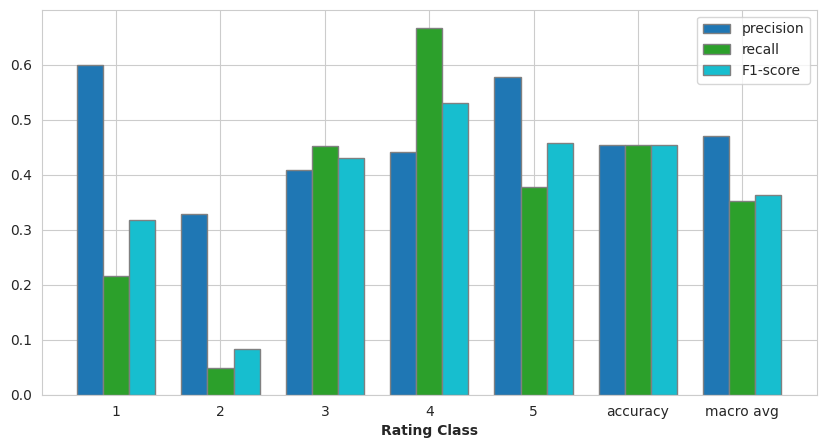

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract precision, recall and F1-score
precision = df_metrics['precision'][:-3]  # excluding the last three rows (avg / total, accuracy, MSE, RMSE)
recall = df_metrics['recall'][:-3]
f1 = df_metrics['f1-score'][:-3]

# Get bar width and positions
barWidth = 0.25
r1 = np.arange(len(precision))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Set style
sns.set_style("whitegrid")

# Create plot
fig, ax = plt.subplots(figsize=(10, 5))

# Add bars
plt.bar(r1, precision.values, color='#1f77b4', width=barWidth, edgecolor='grey', label='precision')
plt.bar(r2, recall.values, color='#2ca02b', width=barWidth, edgecolor='grey', label='recall')
plt.bar(r3, f1.values, color='#17becf', width=barWidth, edgecolor='grey', label='F1-score')

# Add xticks on the middle of the group bars
plt.xlabel('Rating Class', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision))], precision.index)

# Create legend & show graphic
plt.legend()
plt.show()




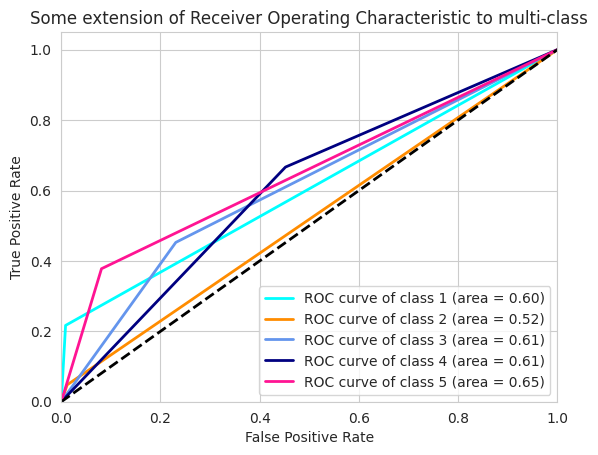

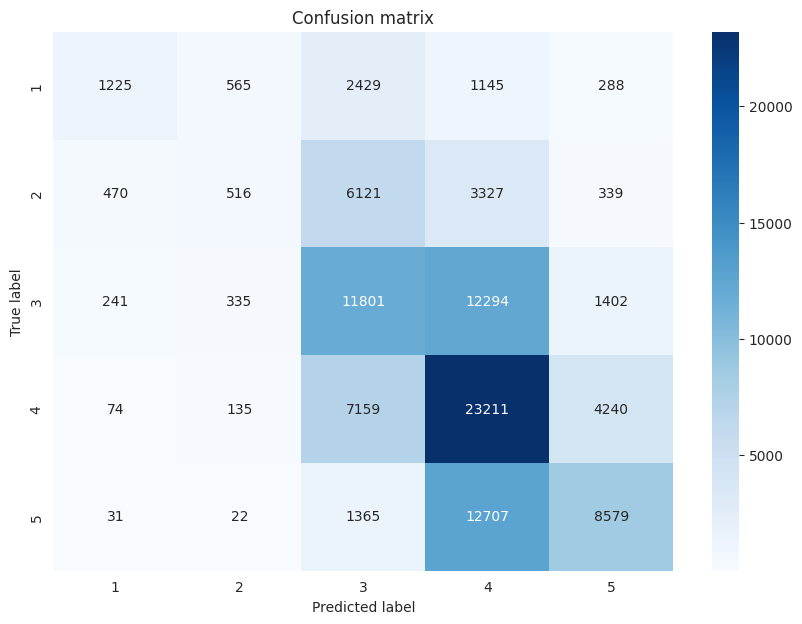

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, roc_auc_score
from sklearn.preprocessing import label_binarize
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Binarize the output
y_true_bin = label_binarize(y_true, classes=[1, 2, 3, 4, 5])
y_pred_bin = label_binarize(y_pred, classes=[1, 2, 3, 4, 5])

n_classes = y_true_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()

colors = ['aqua', 'darkorange', 'cornflowerblue', 'navy', 'deeppink']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc[i])) # +1 to shift class range from 0-4 to 1-5

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver Operating Characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true, y_pred)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cnf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[1, 2, 3, 4, 5], yticklabels=[1, 2, 3, 4, 5])
plt.title('Confusion matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


## 8) DP-DLRS (Noise = 0.8/ Epoch 40)

New Ver

In [ ]:
## Load Saved Model

#1) Load Training History
dph8e40n_r1 = pd.read_json('/content/gdrive/My Drive/dph8e40n_training_r1.json')

#2) Load Predictions
preds_dph8e40n_r1 = pd.read_csv('/content/gdrive/My Drive/preds_dph8e40n_r1.csv')

y_true_dph8e40n_r1 = preds_dph8e40n_r1['y_true_dph8e40n_r1'].values
y_pred_dph8e40n_r1 = preds_dph8e40n_r1['y_pred_dph8e40n_r1'].values

Old Ver

In [ ]:
## Load Saved Model

#1) Load Training History
dph8 = pd.read_json('/content/gdrive/My Drive/dph8_training.json')

#2) Load Predictions
preds_dph8 = pd.read_csv('/content/gdrive/My Drive/preds_dph8.csv')

In [ ]:
y_true_dph8 = preds_dph8['y_true_dph8'].values
y_pred_dph8 = preds_dph8['y_pred_dph8'].values

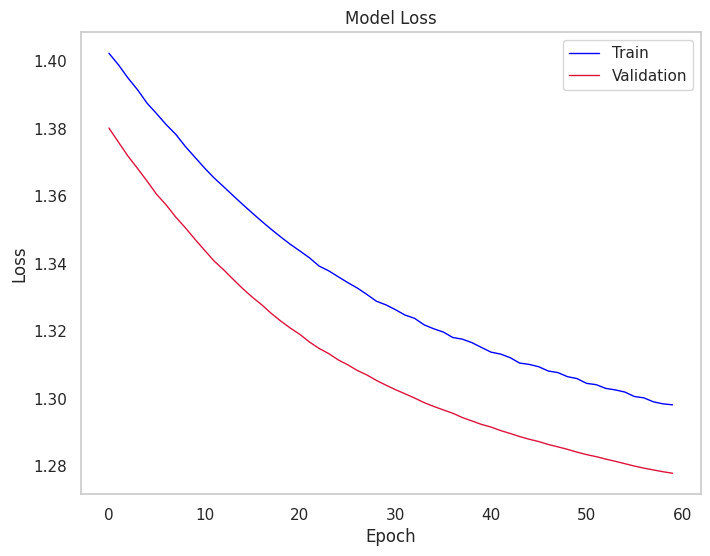

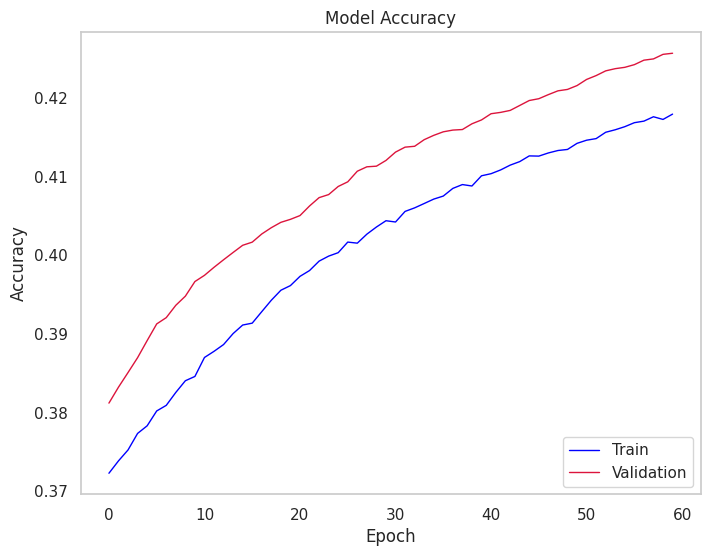

In [ ]:
# Set default Seaborn style
sns.set(style="whitegrid")

# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dph8['loss'], 'blue', linestyle='-', linewidth=1)
plt.plot(dph8['val_loss'], 'crimson', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.grid(False)  # Hide grid

plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dph8['accuracy'], 'blue', linestyle='-', linewidth=1)
plt.plot(dph8['val_accuracy'], 'crimson', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.grid(False)  # Hide grid

plt.show()



In [ ]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error
from sklearn.preprocessing import LabelBinarizer
from math import sqrt

# Converting your predictions and true labels to the closest integers
y_true = np.rint(y_true_dph8).astype(int)
y_pred = np.rint(y_pred_dph8).astype(int)

# Precision, recall, F1-score per class
report = classification_report(y_true, y_pred, output_dict=True)
df_metrics = pd.DataFrame(report).transpose()

# Accuracy
accuracy = accuracy_score(y_true_dph8, y_pred_dph8)

# MSE
mse = mean_squared_error(y_true_dph8, y_pred_dph8)

# RMSE
rmse = sqrt(mse)

# Adding accuracy, MSE and RMSE to the dataframe
df_metrics.loc['accuracy'] = [accuracy] * 4
df_metrics.loc['MSE'] = [mse] * 4
df_metrics.loc['RMSE'] = [rmse] * 4

# Showing the dataframe
print(df_metrics)


              precision  recall  f1-score    support
1                 0.658   0.044     0.083   5651.000
2                 0.317   0.048     0.084  10769.000
3                 0.378   0.390     0.384  26071.000
4                 0.420   0.703     0.526  34812.000
5                 0.554   0.314     0.400  22697.000
accuracy          0.425   0.425     0.425      0.425
macro avg         0.466   0.300     0.295 100000.000
weighted avg      0.442   0.425     0.388 100000.000
MSE               1.021   1.021     1.021      1.021
RMSE              1.011   1.011     1.011      1.011


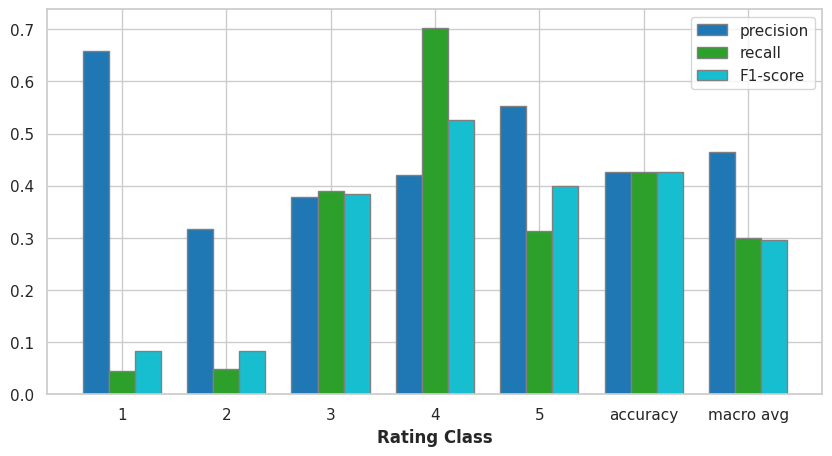

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract precision, recall and F1-score
precision = df_metrics['precision'][:-3]  # excluding the last three rows (avg / total, accuracy, MSE, RMSE)
recall = df_metrics['recall'][:-3]
f1 = df_metrics['f1-score'][:-3]

# Get bar width and positions
barWidth = 0.25
r1 = np.arange(len(precision))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Set style
sns.set_style("whitegrid")

# Create plot
fig, ax = plt.subplots(figsize=(10, 5))

# Add bars
plt.bar(r1, precision.values, color='#1f77b4', width=barWidth, edgecolor='grey', label='precision')
plt.bar(r2, recall.values, color='#2ca02b', width=barWidth, edgecolor='grey', label='recall')
plt.bar(r3, f1.values, color='#17becf', width=barWidth, edgecolor='grey', label='F1-score')

# Add xticks on the middle of the group bars
plt.xlabel('Rating Class', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision))], precision.index)

# Create legend & show graphic
plt.legend()
plt.show()



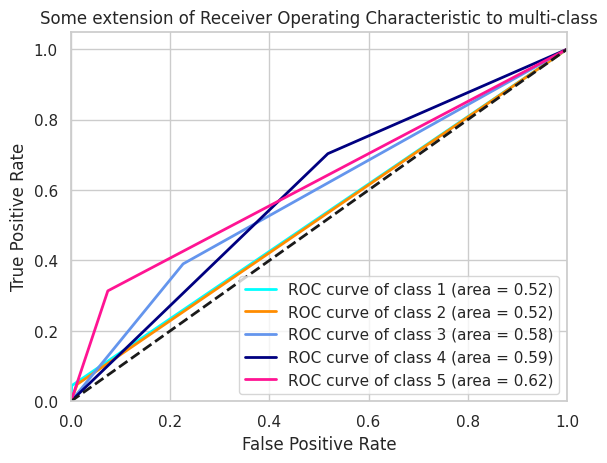

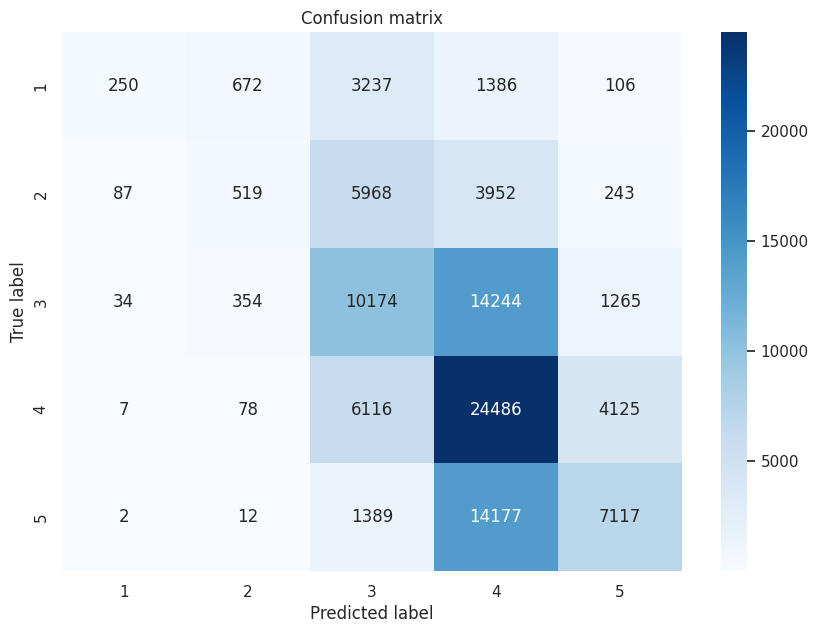

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, roc_auc_score
from sklearn.preprocessing import label_binarize
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Binarize the output
y_true_bin = label_binarize(y_true_dph8, classes=[1, 2, 3, 4, 5])
y_pred_bin = label_binarize(y_pred_dph8, classes=[1, 2, 3, 4, 5])

n_classes = y_true_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()

colors = ['aqua', 'darkorange', 'cornflowerblue', 'navy', 'deeppink']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc[i])) # +1 to shift class range from 0-4 to 1-5

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver Operating Characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true_dph8, y_pred_dph8)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cnf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[1, 2, 3, 4, 5], yticklabels=[1, 2, 3, 4, 5])
plt.title('Confusion matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


## 9) DP-DLRS (Noise = 2/ Epoch 40)

Latest Ver

In [ ]:
## Load Saved Model

#1) Load Training History
dp2e40_r1n = pd.read_json('/content/gdrive/My Drive/dp2e40_r1n_training.json')

#2) Load Predictions
preds_dp2e40_r1n = pd.read_csv('/content/gdrive/My Drive/preds_dp2e40_r1n.csv')

y_true_dp2e40_r1n = preds_dp2e40_r1n['y_true_dp2e40_r1n'].values
y_pred_dp2e40_r1n = preds_dp2e40_r1n['y_pred_dp2e40_r1n'].values

Old Ver

In [ ]:
## Load Saved Model

#1) Load Training History
dp2e40 = pd.read_json('/content/gdrive/My Drive/dp2e40_training.json')

#2) Load Predictions
preds_dp2e40 = pd.read_csv('/content/gdrive/My Drive/preds_dp2e40.csv')

In [ ]:
y_true_dp2 = preds_dp2e40['y_true_dp2'].values
y_pred_dp2 = preds_dp2e40['y_pred_dp2'].values

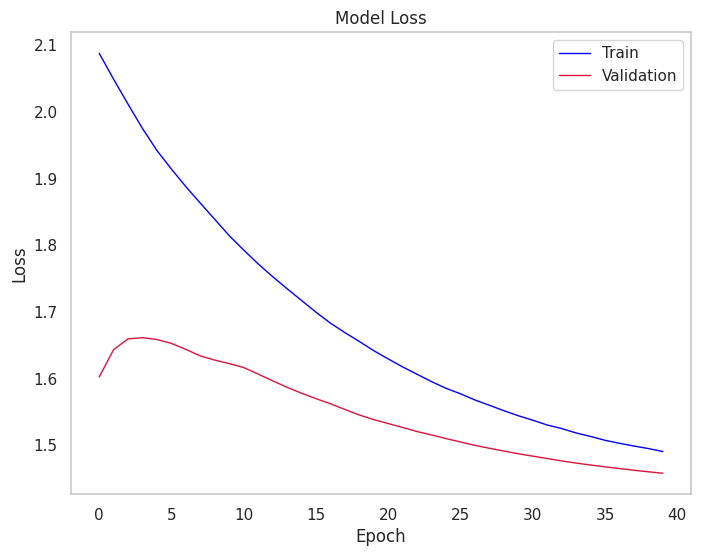

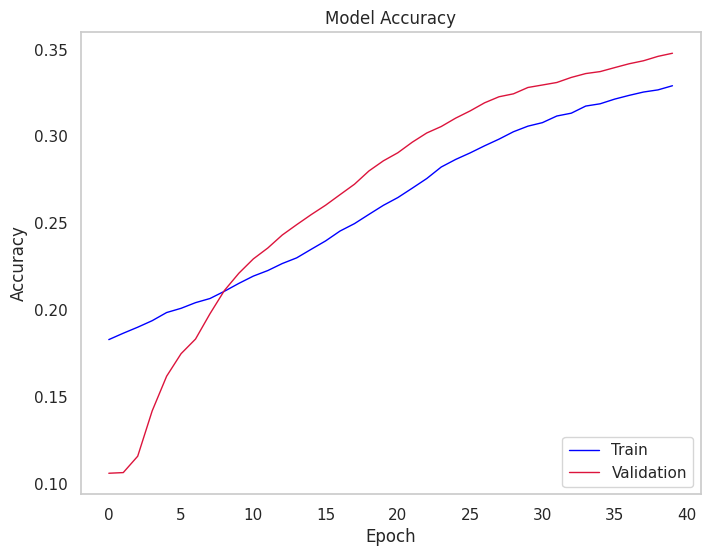

In [ ]:
# Set default Seaborn style
sns.set(style="whitegrid")

# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dp2e40['loss'], 'blue', linestyle='-', linewidth=1)
plt.plot(dp2e40['val_loss'], 'crimson', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.grid(False)  # Hide grid

plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dp2e40['accuracy'], 'blue', linestyle='-', linewidth=1)
plt.plot(dp2e40['val_accuracy'], 'crimson', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.grid(False)  # Hide grid

plt.show()



In [ ]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error
from sklearn.preprocessing import LabelBinarizer
from math import sqrt

# Converting your predictions and true labels to the closest integers
y_true = np.rint(y_true_dp2).astype(int)
y_pred = np.rint(y_pred_dp2).astype(int)

# Precision, recall, F1-score per class
report = classification_report(y_true, y_pred, output_dict=True)
df_metrics = pd.DataFrame(report).transpose()

# Accuracy
accuracy = accuracy_score(y_true, y_pred)

# MSE
mse = mean_squared_error(y_true, y_pred)

# RMSE
rmse = sqrt(mse)

# Adding accuracy, MSE and RMSE to the dataframe
df_metrics.loc['accuracy'] = [accuracy] * 4
df_metrics.loc['MSE'] = [mse] * 4
df_metrics.loc['RMSE'] = [rmse] * 4

# Showing the dataframe
print(df_metrics)



              precision  recall  f1-score    support
1                 0.167   0.000     0.000   5651.000
2                 0.000   0.000     0.000  10769.000
3                 0.290   0.211     0.244  26071.000
4                 0.356   0.753     0.484  34812.000
5                 0.398   0.129     0.195  22697.000
accuracy          0.347   0.347     0.347      0.347
macro avg         0.242   0.219     0.185 100000.000
weighted avg      0.299   0.347     0.276 100000.000
MSE               1.477   1.477     1.477      1.477
RMSE              1.215   1.215     1.215      1.215


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


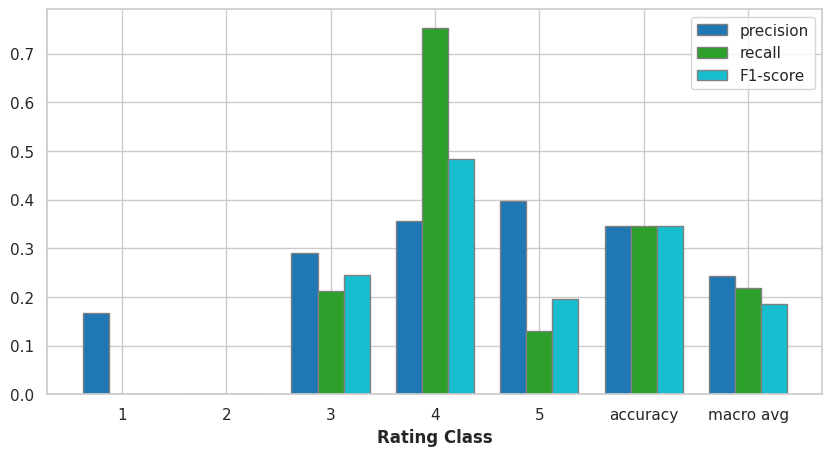

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract precision, recall and F1-score
precision = df_metrics['precision'][:-3]  # excluding the last three rows (avg / total, accuracy, MSE, RMSE)
recall = df_metrics['recall'][:-3]
f1 = df_metrics['f1-score'][:-3]

# Get bar width and positions
barWidth = 0.25
r1 = np.arange(len(precision))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Set style
sns.set_style("whitegrid")

# Create plot
fig, ax = plt.subplots(figsize=(10, 5))

# Add bars
plt.bar(r1, precision.values, color='#1f77b4', width=barWidth, edgecolor='grey', label='precision')
plt.bar(r2, recall.values, color='#2ca02b', width=barWidth, edgecolor='grey', label='recall')
plt.bar(r3, f1.values, color='#17becf', width=barWidth, edgecolor='grey', label='F1-score')

# Add xticks on the middle of the group bars
plt.xlabel('Rating Class', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision))], precision.index)

# Create legend & show graphic
plt.legend()
plt.show()




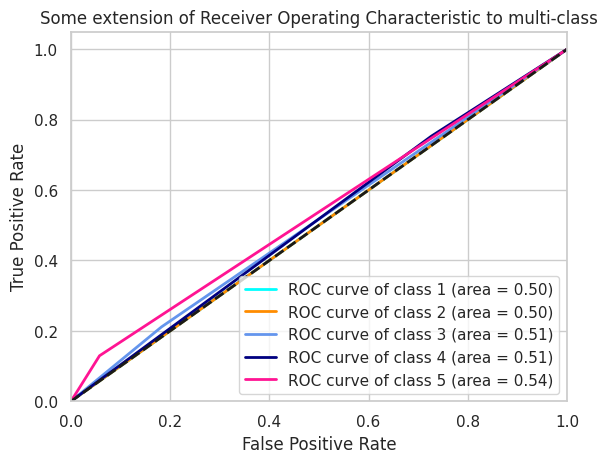

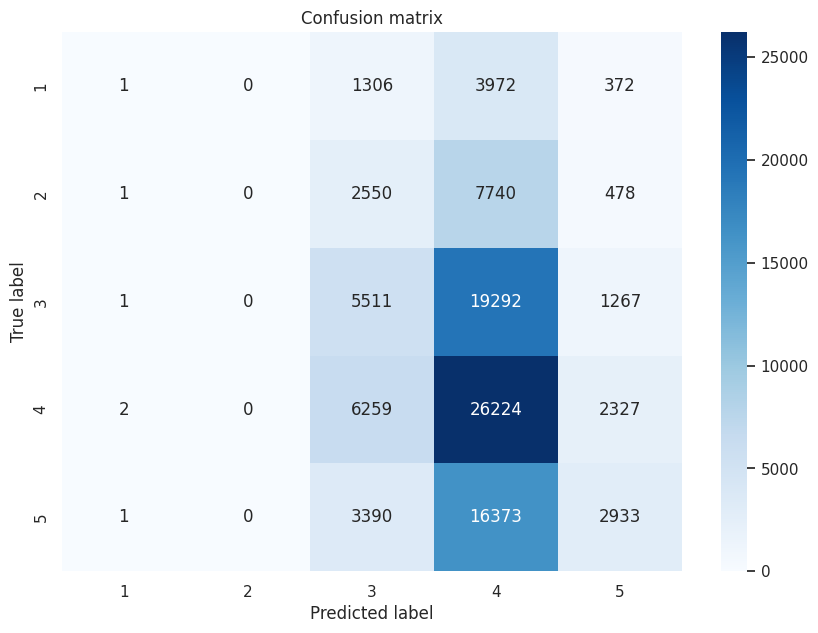

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, roc_auc_score
from sklearn.preprocessing import label_binarize
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Binarize the output
y_true_bin = label_binarize(y_true_dp2, classes=[1, 2, 3, 4, 5])
y_pred_bin = label_binarize(y_pred_dp2, classes=[1, 2, 3, 4, 5])

n_classes = y_true_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()

colors = ['aqua', 'darkorange', 'cornflowerblue', 'navy', 'deeppink']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc[i])) # +1 to shift class range from 0-4 to 1-5

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver Operating Characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true_dp2, y_pred_dp2)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cnf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[1, 2, 3, 4, 5], yticklabels=[1, 2, 3, 4, 5])
plt.title('Confusion matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


## 8) DP-DLRS (Noise = 5/ Epoch 40)

New Ver

In [ ]:
## Load Saved Model

#1) Load Training History
dp5e40_r1 = pd.read_json('/content/gdrive/My Drive/dp5e40_r1_training.json')

#2) Load Predictions
preds_dp5e40_r1 = pd.read_csv('/content/gdrive/My Drive/preds_dp5e40_r1.csv')

y_true_dp5e40_r1 = preds_dp5e40_r1['y_true_dp5e40_r1'].values
y_pred_dp5e40_r1 = preds_dp5e40_r1['y_pred_dp5e40_r1'].values

Old Ver

In [ ]:
## Load Saved Model

#1) Load Training History
dp5e40 = pd.read_json('/content/gdrive/My Drive/dp5e40_training.json')

#2) Load Predictions
preds_dp5e40 = pd.read_csv('/content/gdrive/My Drive/preds_dp5e40.csv')

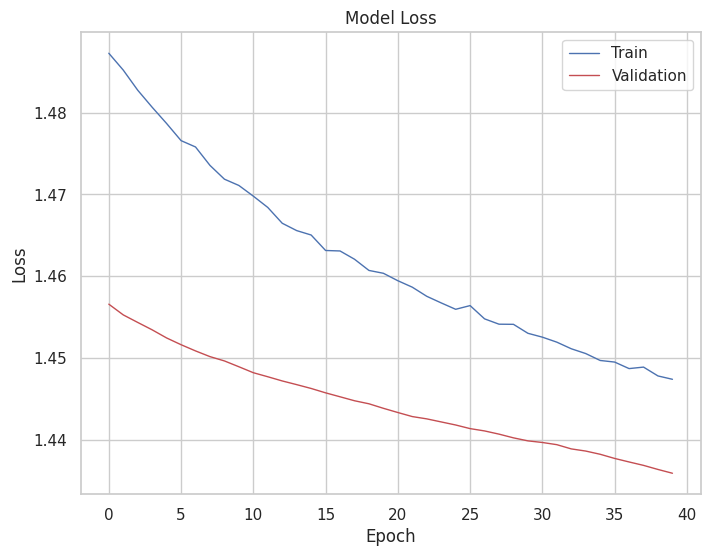

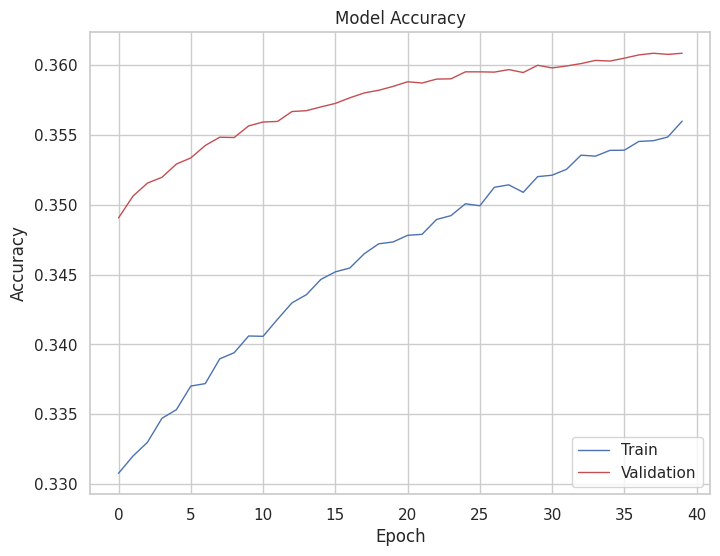

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 6))
plt.plot(dp5e40['loss'], 'b', linestyle='-', linewidth=1)
plt.plot(dp5e40['val_loss'], 'r', linestyle='-', linewidth=1)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Accuracy Plot
plt.figure(figsize=(8, 6))
plt.plot(dp5e40['accuracy'], 'b', linestyle='-', linewidth=1)
plt.plot(dp5e40['val_accuracy'], 'r', linestyle='-', linewidth=1)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

## Comparison All Models

Statistic

In [ ]:
def hit_rate_at_k(y_true, y_pred, k=10):
    hits = 0
    for true, pred in zip(y_true, y_pred):
        # Get top k predictions
        top_k = pred.argsort()[-k:][::-1]
        if true in top_k:
            hits += 1
    return hits / len(y_true)


In [ ]:
def ndcg_at_k(y_true, y_pred, k=10):
    ndcg = 0.0
    for i, (true, pred) in enumerate(zip(y_true, y_pred)):
        # Get top k predictions
        top_k = pred.argsort()[-k:][::-1]
        if true in top_k:
            position = np.where(top_k == true)[0][0] + 1
            ndcg += 1.0 / np.log2(position + 1)
    return ndcg / len(y_true)

1) Loss Function

New Ver

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# Plot loss for the DP model
plt.plot(dph8e40_r1n['loss'], linestyle='-', linewidth=1, color='green', label='DP Train Loss (Noise = 0.8 / Eps = 7.66)')
plt.plot(dph8e40_r1n['val_loss'], linestyle='--', linewidth=1, color='green', label='DP Validation Loss Noise = 0.8 / Eps = 7.66)')


plt.plot(dp2e40_r1n['loss'], linestyle='-', linewidth=1, color='blue', label='DP Train Loss (Noise = 2 / Eps = 1.62)')
plt.plot(dp2e40_r1n['val_loss'], linestyle='--', linewidth=1, color='blue', label='DP Validation Loss (Noise = 2 / Eps = 1.62)')


plt.plot(dp5e40_r1['loss'], linestyle='-', linewidth=1, color='red', label='Training Loss (Noise = 5 / Eps = 0.56)')
plt.plot(dp5e40_r1['val_loss'], linestyle='--', linewidth=1, color='red', label='Validation Loss (Noise = 5 / Eps = 0.56)')

# Plot loss for the non-DP model
plt.plot(DLRSe40['loss'], linestyle='-', linewidth=1, color='black', label='Train Loss (No Privacy)')
plt.plot(DLRSe40['val_loss'], linestyle='--', linewidth=1, color='black', label='Validation Loss (No Privacy)')

plt.title('Comparison of Models "Loss" with and without Differential Privacy (Epoch 40)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


NameError: ignored

<Figure size 800x600 with 0 Axes>

Old Ver

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# Plot loss for the DP model
plt.plot(dph8e100nn['loss'], linestyle='-', linewidth=1, color='green', label='DP Train Loss (Noise = 0.8 / Eps = 12.62)')
plt.plot(dph8e100nn['val_loss'], linestyle='--', linewidth=1, color='green', label='DP Validation Loss Noise = 0.8 / Eps = 12.62)')


plt.plot(dp15e100n['loss'], linestyle='-', linewidth=1, color='pink', label='DP Train Loss (Noise = 1.5 / Eps = 3.93)')
plt.plot(dp15e100n['val_loss'], linestyle='--', linewidth=1, color='pink', label='DP Validation Loss (Noise = 1.5 / Eps = 3.93)')


plt.plot(dp2e100nn['loss'], linestyle='-', linewidth=1, color='blue', label='DP Train Loss (Noise = 2 / Eps = 2.67)')
plt.plot(dp2e100nn['val_loss'], linestyle='--', linewidth=1, color='blue', label='DP Validation Loss (Noise = 2 / Eps = 2.67)')

plt.plot(dp3e100nn['loss'], linestyle='-', linewidth=1, color='skyblue', label='DP Train Loss (Noise = 3 / Eps = 1.63)')
plt.plot(dp3e100nn['val_loss'], linestyle='--', linewidth=1, color='skyblue', label='DP Validation Loss (Noise = 3 / Eps = 1.63)')


plt.plot(dp5e100nn['loss'], linestyle='-', linewidth=1, color='red', label='Training Loss (Noise = 5 / Eps = 0.91)')
plt.plot(dp5e100nn['val_loss'], linestyle='--', linewidth=1, color='red', label='Validation Loss (Noise = 5 / Eps = 0.91)')

# Plot loss for the non-DP model
plt.plot(DLRS_e100nn['loss'], linestyle='-', linewidth=1, color='black', label='Train Loss (No Privacy)')
plt.plot(DLRS_e100nn['val_loss'], linestyle='--', linewidth=1, color='black', label='Validation Loss (No Privacy)')

plt.title('Comparison of Models "Loss" with and without Differential Privacy (Epoch 100)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


2) Accuracy Function

New Ver

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# Plot accuracy for the DP model
plt.plot(dph8e40n.history['accuracy'], linestyle='-', linewidth=1, color='green', label='DP Train Accuracy (Noise = 0.8 / Eps = 7.66)')
plt.plot(dph8e40n.history['val_accuracy'], linestyle='--', linewidth=1, color='green', label='DP Validation Accuracy Noise = 0.8 / Eps = 7.66)')


plt.plot(dp2e40_r1n['accuracy'], linestyle='-', linewidth=1, color='blue', label='DP Train Accuracy (Noise = 2 / Eps = 1.62)')
plt.plot(dp2e40_r1n['val_accuracy'], linestyle='--', linewidth=1, color='blue', label='DP Validation Accuracy (Noise = 2 / Eps = 1.62)')


plt.plot(dp5e40_r1['accuracy'], linestyle='-', linewidth=1, color='red', label='Training Accuracy (Noise = 5 / Eps = 0.56)')
plt.plot(dp5e40_r1['val_accuracy'], linestyle='--', linewidth=1, color='red', label='Validation Accuracy (Noise = 5 / Eps = 0.56)')

# Plot loss for the non-DP model
plt.plot(DLRSe40['accuracy'], linestyle='-', linewidth=1, color='black', label='Train Accuracy (No Privacy)')
plt.plot(DLRSe40['val_accuracy'], linestyle='--', linewidth=1, color='black', label='Validation Accuracy (No Privacy)')

plt.title('Comparison of Models "Accuracy" with and without Differential Privacy (Epoch 40)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


Old Ver

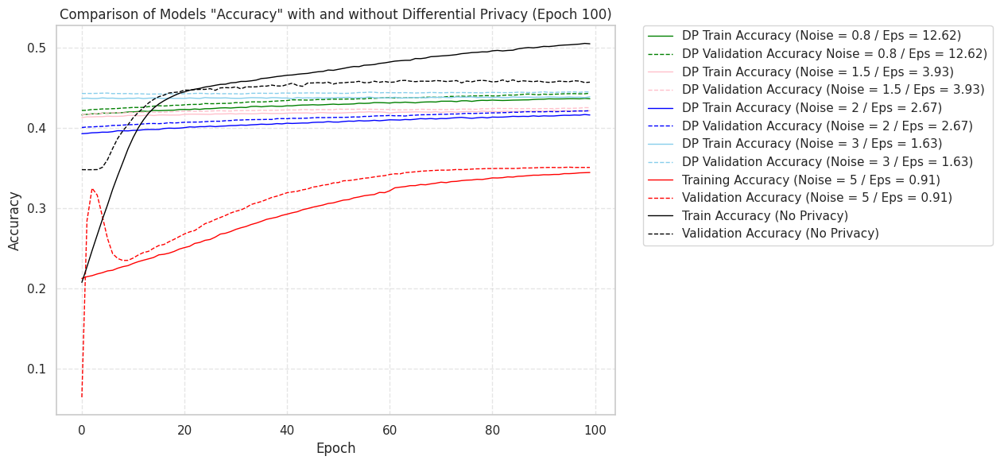

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# Plot accuracy for the DP model
plt.plot(dph8e100nn['accuracy'], linestyle='-', linewidth=1, color='green', label='DP Train Accuracy (Noise = 0.8 / Eps = 12.62)')
plt.plot(dph8e100nn['val_accuracy'], linestyle='--', linewidth=1, color='green', label='DP Validation Accuracy Noise = 0.8 / Eps = 12.62)')


plt.plot(dp15e100n['accuracy'], linestyle='-', linewidth=1, color='pink', label='DP Train Accuracy (Noise = 1.5 / Eps = 3.93)')
plt.plot(dp15e100n['val_accuracy'], linestyle='--', linewidth=1, color='pink', label='DP Validation Accuracy (Noise = 1.5 / Eps = 3.93)')


plt.plot(dp2e100nn['accuracy'], linestyle='-', linewidth=1, color='blue', label='DP Train Accuracy (Noise = 2 / Eps = 2.67)')
plt.plot(dp2e100nn['val_accuracy'], linestyle='--', linewidth=1, color='blue', label='DP Validation Accuracy (Noise = 2 / Eps = 2.67)')

plt.plot(dp3e100nn['accuracy'], linestyle='-', linewidth=1, color='skyblue', label='DP Train Accuracy (Noise = 3 / Eps = 1.63)')
plt.plot(dp3e100nn['val_accuracy'], linestyle='--', linewidth=1, color='skyblue', label='DP Validation Accuracy (Noise = 3 / Eps = 1.63)')


plt.plot(dp5e100nnn['accuracy'], linestyle='-', linewidth=1, color='red', label='Training Accuracy (Noise = 5 / Eps = 0.91)')
plt.plot(dp5e100nnn['val_accuracy'], linestyle='--', linewidth=1, color='red', label='Validation Accuracy (Noise = 5 / Eps = 0.91)')

# Plot loss for the non-DP model
plt.plot(DLRS_e100nn['accuracy'], linestyle='-', linewidth=1, color='black', label='Train Accuracy (No Privacy)')
plt.plot(DLRS_e100nn['val_accuracy'], linestyle='--', linewidth=1, color='black', label='Validation Accuracy (No Privacy)')

plt.title('Comparison of Models "Accuracy" with and without Differential Privacy (Epoch 100)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


In [ ]:
final_accuracy_dp08 = dph8e40n_r1['val_accuracy'].values[-1]
final_accuracy_dp2 = dp2e40_r1n_training['val_accuracy'].values[-1]
final_accuracy_dp5 = dp5e40_r1_training['val_accuracy'].values[-1]
final_accuracy_no_privacy = DLRSe40['val_accuracy'].values[-1]

import matplotlib.pyplot as plt
import numpy as np

final_accuracies = {
    'DP (Noise = 5 / Eps = 0.91)': final_accuracy_dp5,
    'DP (Noise = 2 / Eps = 2.67)': final_accuracy_dp2,
    'DP (Noise = 0.8 / Eps = 12.62)': final_accuracy_dp08,
    'No Privacy/ Eps = ∞': final_accuracy_no_privacy
}

models = list(final_accuracies.keys())
accuracies = list(final_accuracies.values())

plt.figure(figsize=(10, 6))

# Create an array for the x-axis values and use it for plotting
x_pos = np.arange(len(models))

# Plot a line with dots at each data point
plt.plot(x_pos, accuracies, color='black', marker='o', linestyle='-', linewidth=1)

# Replace numeric x-axis labels with model names, and rotate them 45 degrees
plt.xticks(x_pos, models, rotation=45, ha='right')

plt.xlabel('Models', labelpad=20)
plt.ylabel('Final Validation Accuracy')
plt.title('Comparison of Final Validation Accuracy for Different Models')
plt.ylim([min(accuracies) - 0.05, max(accuracies) + 0.05])  # Add some padding to y-axis limits

# Adding a grid for better readability
plt.grid(axis='both', linestyle='--', linewidth=0.5)

plt.tight_layout()  # Improve spacing
plt.show()



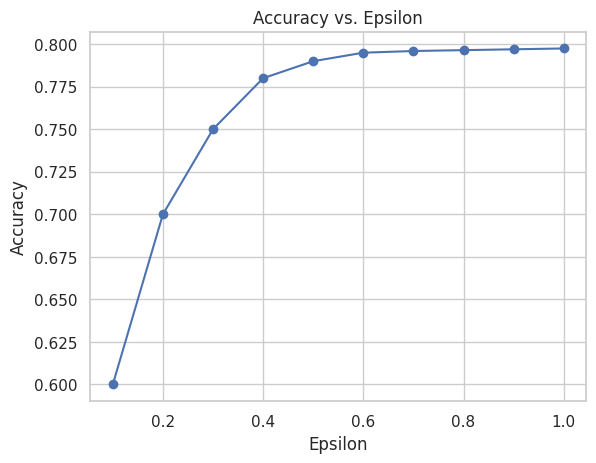

In [ ]:
import matplotlib.pyplot as plt

# Assume these are your epsilon values and corresponding accuracies
epsilons = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
accuracies = [0.6, 0.7, 0.75, 0.78, 0.79, 0.795, 0.796, 0.7965, 0.797, 0.7975]

plt.plot(epsilons, accuracies, marker='o')
plt.xlabel('Epsilon')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epsilon')
plt.grid(True)
plt.show()


In [ ]:
final_accuracy_dp08 = dph8e100nn['val_accuracy'].values[-1]
final_accuracy_dp15 = dp15e100n['val_accuracy'].values[-1]
final_accuracy_dp2 = dp2e100nn['val_accuracy'].values[-1]
final_accuracy_dp3 = dp3e100nn['val_accuracy'].values[-1]
final_accuracy_dp5 = dp5e100nnn['val_accuracy'].values[-1]
final_accuracy_no_privacy = DLRS_e100nn['val_accuracy'].values[-1]


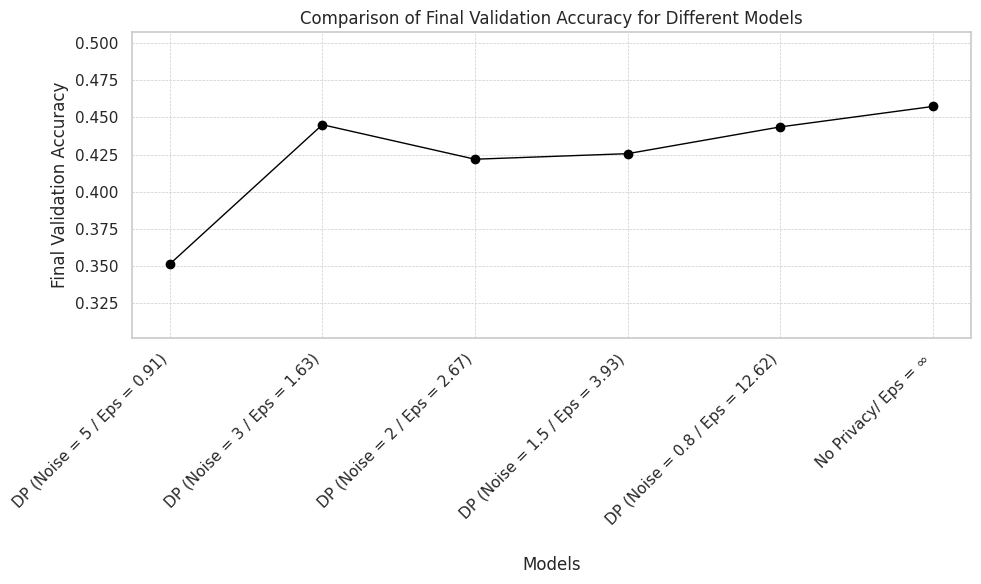

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

final_accuracies = {
    'DP (Noise = 5 / Eps = 0.91)': final_accuracy_dp5,
    'DP (Noise = 3 / Eps = 1.63)': final_accuracy_dp3,
    'DP (Noise = 2 / Eps = 2.67)': final_accuracy_dp2,
    'DP (Noise = 1.5 / Eps = 3.93)': final_accuracy_dp15,
    'DP (Noise = 0.8 / Eps = 12.62)': final_accuracy_dp08,
    'No Privacy/ Eps = ∞': final_accuracy_no_privacy
}

models = list(final_accuracies.keys())
accuracies = list(final_accuracies.values())

plt.figure(figsize=(10, 6))

# Create an array for the x-axis values and use it for plotting
x_pos = np.arange(len(models))

# Plot a line with dots at each data point
plt.plot(x_pos, accuracies, color='black', marker='o', linestyle='-', linewidth=1)

# Replace numeric x-axis labels with model names, and rotate them 45 degrees
plt.xticks(x_pos, models, rotation=45, ha='right')

plt.xlabel('Models', labelpad=20)
plt.ylabel('Final Validation Accuracy')
plt.title('Comparison of Final Validation Accuracy for Different Models')
plt.ylim([min(accuracies) - 0.05, max(accuracies) + 0.05])  # Add some padding to y-axis limits

# Adding a grid for better readability
plt.grid(axis='both', linestyle='--', linewidth=0.5)

plt.tight_layout()  # Improve spacing
plt.show()




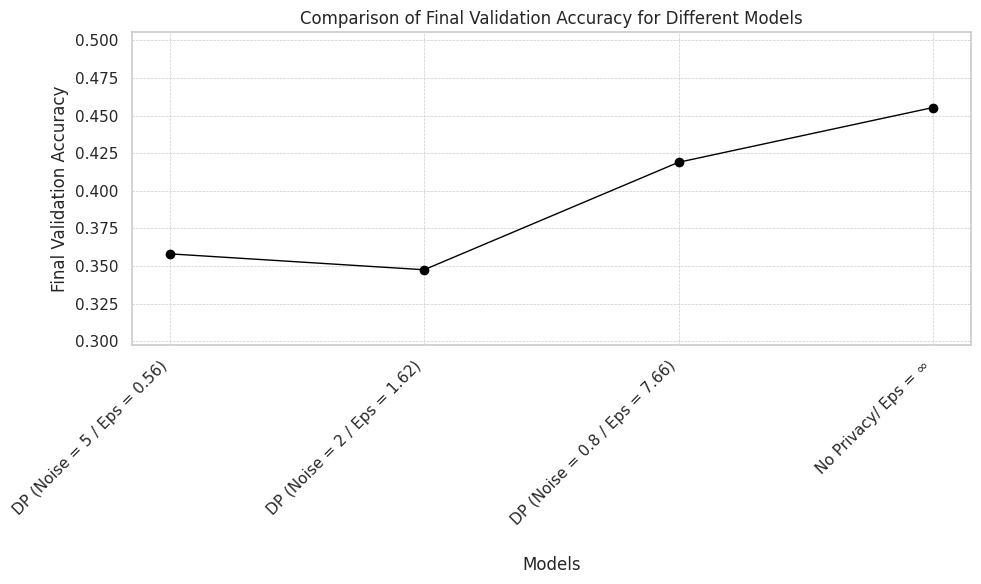

In [ ]:
final_accuracy_dp08 = dph8e40n_r1['val_accuracy'].values[-1]
final_accuracy_dp2 = dp2e40_r1n['val_accuracy'].values[-1]
final_accuracy_dp5 = dp5e40_r1['val_accuracy'].values[-1]
final_accuracy_no_privacy = DLRSe40['val_accuracy'].values[-1]

import matplotlib.pyplot as plt
import numpy as np

final_accuracies = {
    'DP (Noise = 5 / Eps = 0.56)': final_accuracy_dp5,
    'DP (Noise = 2 / Eps = 1.62)': final_accuracy_dp2,
    'DP (Noise = 0.8 / Eps = 7.66)': final_accuracy_dp08,
    'No Privacy/ Eps = ∞': final_accuracy_no_privacy
}

models = list(final_accuracies.keys())
accuracies = list(final_accuracies.values())

plt.figure(figsize=(10, 6))

# Create an array for the x-axis values and use it for plotting
x_pos = np.arange(len(models))

# Plot a line with dots at each data point
plt.plot(x_pos, accuracies, color='black', marker='o', linestyle='-', linewidth=1)

# Replace numeric x-axis labels with model names, and rotate them 45 degrees
plt.xticks(x_pos, models, rotation=45, ha='right')

plt.xlabel('Models', labelpad=20)
plt.ylabel('Final Validation Accuracy')
plt.title('Comparison of Final Validation Accuracy for Different Models')
plt.ylim([min(accuracies) - 0.05, max(accuracies) + 0.05])  # Add some padding to y-axis limits

# Adding a grid for better readability
plt.grid(axis='both', linestyle='--', linewidth=0.5)

plt.tight_layout()  # Improve spacing
plt.show()



<ipython-input-57-6b5d8ddf8c3d>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
<ipython-input-57-6b5d8ddf8c3d>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_pred_dp5e100nnn, color='lightcoral', shade=True, label='Model with Noise 5')


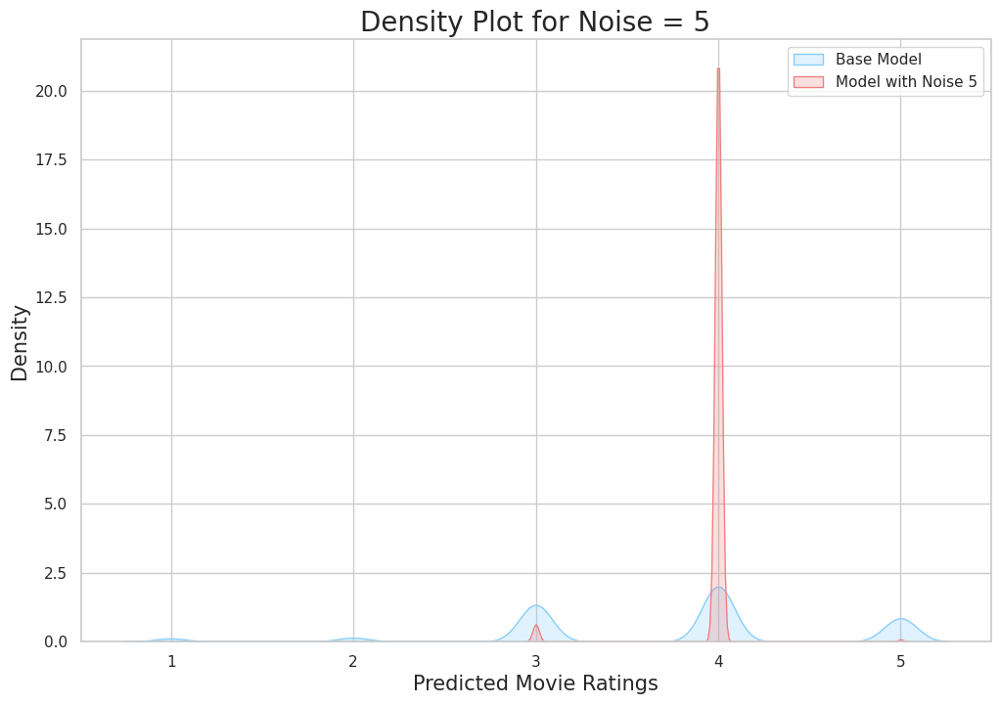

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dp5e100nnn, color='lightcoral', shade=True, label='Model with Noise 5')

# Labels
plt.title('Density Plot for Noise = 5', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dp5e100nn, color='lightcoral', shade=True, label='Model with Noise 5')

# Labels
plt.title('Density Plot for Noise = 5', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()

<ipython-input-58-9e21c6376477>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
<ipython-input-58-9e21c6376477>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_pred_dph8e100nn, color='green', shade=True, label='Model with Noise 0.8')


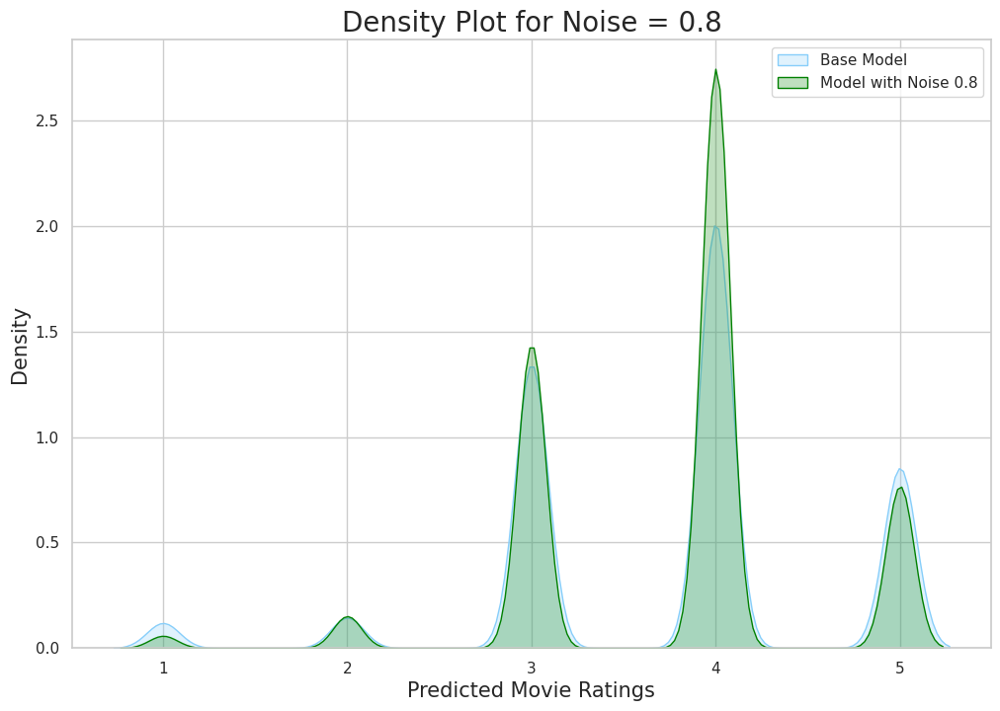

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dph8e100nn, color='green', shade=True, label='Model with Noise 0.8')

# Labels
plt.title('Density Plot for Noise = 0.8', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()

<ipython-input-59-9b8a1df90b5b>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
<ipython-input-59-9b8a1df90b5b>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_pred_dp2e100nn, color='pink', shade=True, label='Model with Noise 2')


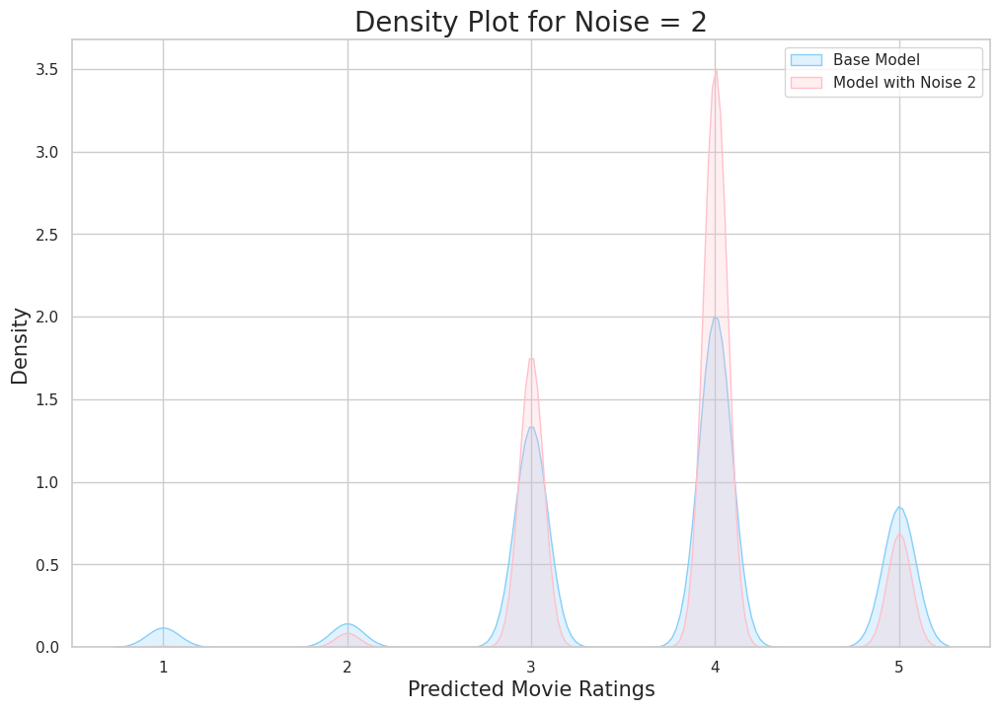

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dp2e100nn, color='pink', shade=True, label='Model with Noise 2')

# Labels
plt.title('Density Plot for Noise = 2', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100nn, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dp3e100nn, color='orange', shade=True, label='Model with Noise 3')

# Labels
plt.title('Density Plot for Noise = 3', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()

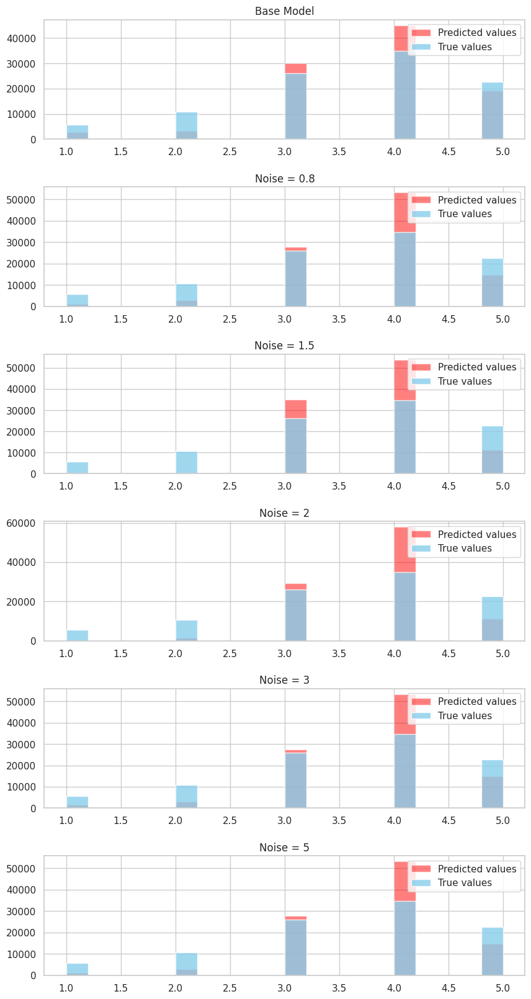

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(6, figsize=(10, 20))

# Adjust the distance between subplots
plt.subplots_adjust(hspace = 0.4)

# Base Model
axs[0].hist(y_pred_e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[0].hist(y_true_e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[0].set_title('Base Model')
axs[0].legend(loc='upper right')

# Noise = 0.8
axs[1].hist(y_pred_dph8e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[1].hist(y_true_dph8e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[1].set_title('Noise = 0.8')
axs[1].legend(loc='upper right')

# Noise = 1.5
axs[2].hist(y_pred_dp15e100n, bins=10, color='red', alpha=0.5, label='Predicted values')
axs[2].hist(y_true_dp15e100n, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[2].set_title('Noise = 1.5')
axs[2].legend(loc='upper right')

# Noise = 2
axs[3].hist(y_pred_dp2e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[3].hist(y_true_dp2e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[3].set_title('Noise = 2')
axs[3].legend(loc='upper right')

# Noise = 3
axs[4].hist(y_pred_dp3e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[4].hist(y_true_dp3e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[4].set_title('Noise = 3')
axs[4].legend(loc='upper right')

# Noise = 5
axs[5].hist(y_pred_dp5e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[5].hist(y_true_dp5e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[5].set_title('Noise = 5')
axs[5].legend(loc='upper right')

plt.show()


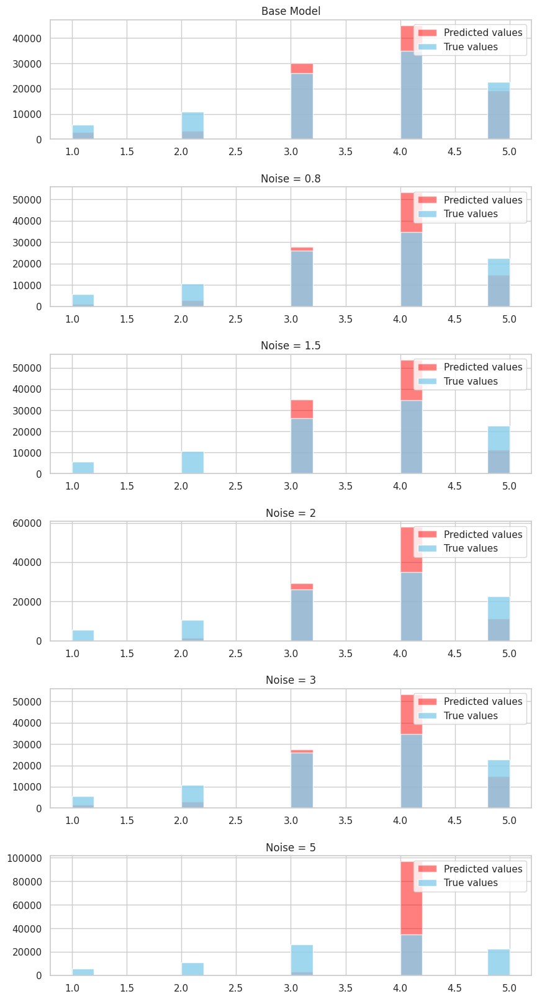

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(6, figsize=(10, 20))

# Adjust the distance between subplots
plt.subplots_adjust(hspace = 0.4)

# Base Model
axs[0].hist(y_pred_e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[0].hist(y_true_e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[0].set_title('Base Model')
axs[0].legend(loc='upper right')

# Noise = 0.8
axs[1].hist(y_pred_dph8e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[1].hist(y_true_dph8e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[1].set_title('Noise = 0.8')
axs[1].legend(loc='upper right')

# Noise = 1.5
axs[2].hist(y_pred_dp15e100n, bins=10, color='red', alpha=0.5, label='Predicted values')
axs[2].hist(y_true_dp15e100n, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[2].set_title('Noise = 1.5')
axs[2].legend(loc='upper right')

# Noise = 2
axs[3].hist(y_pred_dp2e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[3].hist(y_true_dp2e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[3].set_title('Noise = 2')
axs[3].legend(loc='upper right')

# Noise = 3
axs[4].hist(y_pred_dp3e100nn, bins=20, color='red', alpha=0.5, label='Predicted values')
axs[4].hist(y_true_dp3e100nn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[4].set_title('Noise = 3')
axs[4].legend(loc='upper right')

# Noise = 5
axs[5].hist(y_pred_dp5e100nnn, bins=10, color='red', alpha=0.5, label='Predicted values')
axs[5].hist(y_true_dp5e100nnn, bins=20, color='skyblue', alpha=0.8, label='True values')
axs[5].set_title('Noise = 5')
axs[5].legend(loc='upper right')

plt.show()



In [ ]:
from sklearn.metrics import accuracy_score, mean_squared_error
import numpy as np

def calculate_metrics(y_true, y_pred, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    print(f"Metrics for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Root Mean Squared Error: {rmse:.2f}\n")

# Calculate metrics for each model
calculate_metrics(y_true_e100nn, y_pred_e100nn, "Base Model")
calculate_metrics(y_true_dph8e100nn, y_pred_dph8e100nn, "Model with Noise 0.8")
calculate_metrics(y_true_dp15e100n, y_pred_dp15e100n, "Model with Noise 1.5")
calculate_metrics(y_true_dp2e100nn, y_pred_dp2e100nn, "Model with Noise 2")
calculate_metrics(y_true_dp3e100nn, y_pred_dp3e100nn, "Model with Noise 3")
calculate_metrics(y_true_dp5e100nnn, y_pred_dp5e100nnn, "Model with Noise 5")

Metrics for Base Model:
Accuracy: 0.46
Mean Squared Error: 0.99
Root Mean Squared Error: 1.00

Metrics for Model with Noise 0.8:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 1.5:
Accuracy: 0.43
Mean Squared Error: 1.00
Root Mean Squared Error: 1.00

Metrics for Model with Noise 2:
Accuracy: 0.42
Mean Squared Error: 1.02
Root Mean Squared Error: 1.01

Metrics for Model with Noise 3:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 5:
Accuracy: 0.35
Mean Squared Error: 1.41
Root Mean Squared Error: 1.19



Metrics for Model with Noise 5:
Accuracy: 0.35
Mean Squared Error: 1.41
Root Mean Squared Error: 1.19

Metrics for Model with Noise 3:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 2:
Accuracy: 0.42
Mean Squared Error: 1.02
Root Mean Squared Error: 1.01

Metrics for Model with Noise 1.5:
Accuracy: 0.43
Mean Squared Error: 1.00
Root Mean Squared Error: 1.00

Metrics for Model with Noise 0.8:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Base Model:
Accuracy: 0.46
Mean Squared Error: 0.99
Root Mean Squared Error: 1.00



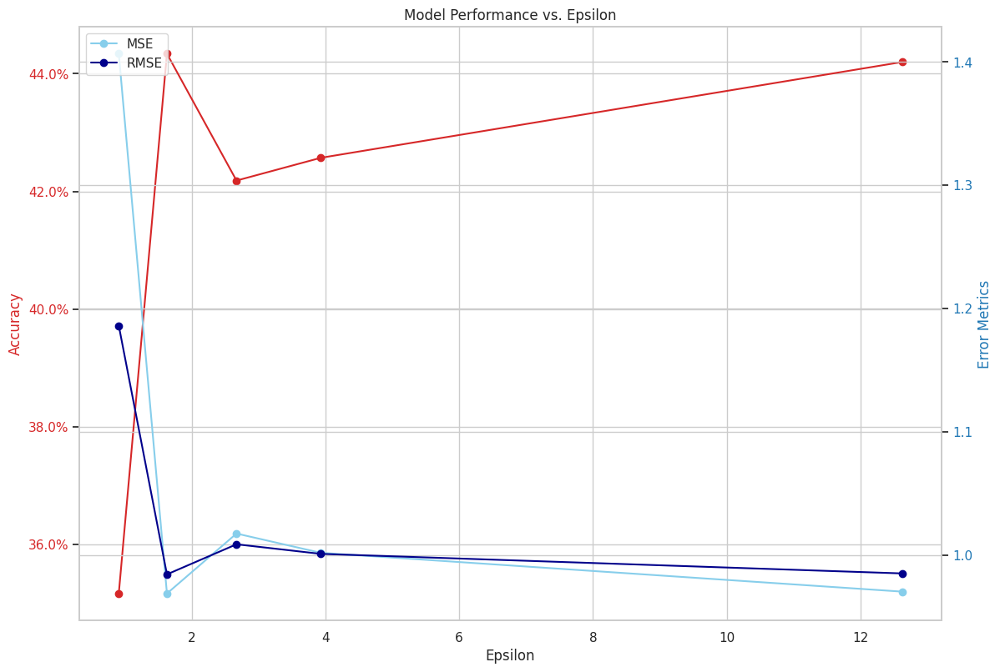

In [ ]:
def calculate_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return accuracy, mse, rmse

epsilons = [0.91, 1.63, 2.67, 3.93, 12.62, np.inf]
y_true = [y_true_dp5e100nnn, y_true_dp3e100nn, y_true_dp2e100nn, y_true_dp15e100n, y_true_dph8e100nn, y_true_e100nn]
y_pred = [y_pred_dp5e100nnn, y_pred_dp3e100nn, y_pred_dp2e100nn, y_pred_dp15e100n, y_pred_dph8e100nn, y_pred_e100nn]
model_names = ['Model with Noise 5', 'Model with Noise 3', 'Model with Noise 2', 'Model with Noise 1.5', 'Model with Noise 0.8', 'Base Model']

accuracy_values = []
mse_values = []
rmse_values = []

for yt, yp, model_name in zip(y_true, y_pred, model_names):
    accuracy, mse, rmse = calculate_metrics(yt, yp)
    print(f"Metrics for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Root Mean Squared Error: {rmse:.2f}\n")

    accuracy_values.append(accuracy)
    mse_values.append(mse)
    rmse_values.append(rmse)

import matplotlib.ticker as mtick

fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('Epsilon')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(epsilons, accuracy_values, color=color, marker='o')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Error Metrics', color=color)
ax2.plot(epsilons, mse_values, color='skyblue', marker='o', label='MSE')
ax2.plot(epsilons, rmse_values, color='darkblue', marker='o', label='RMSE')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()

# Format the y-axis to percentage for accuracy
ax1.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Add a legend
fig.legend(loc="upper left", bbox_to_anchor=(0,1), bbox_transform=ax1.transAxes)

plt.title('Model Performance vs. Epsilon')
plt.grid(True)
plt.show()


Metrics for Base Model:
Accuracy: 0.46
Mean Squared Error: 0.99
Root Mean Squared Error: 1.00

Metrics for Model with Noise 0.8:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 1.5:
Accuracy: 0.43
Mean Squared Error: 1.00
Root Mean Squared Error: 1.00

Metrics for Model with Noise 2:
Accuracy: 0.42
Mean Squared Error: 1.02
Root Mean Squared Error: 1.01

Metrics for Model with Noise 3:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 5:
Accuracy: 0.35
Mean Squared Error: 1.41
Root Mean Squared Error: 1.19



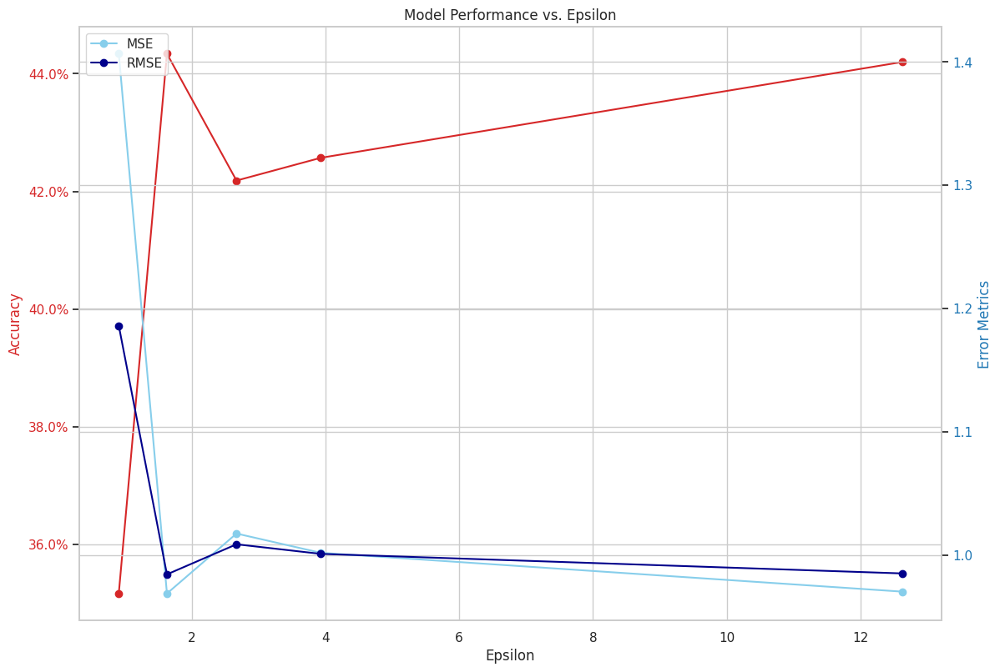

In [ ]:
def calculate_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return accuracy, mse, rmse

epsilons = [np.inf, 12.62, 3.93, 2.67, 1.63, 0.91]
y_true = [y_true_e100nn, y_true_dph8e100nn, y_true_dp15e100n, y_true_dp2e100nn, y_true_dp3e100nn, y_true_dp5e100nnn]
y_pred = [y_pred_e100nn, y_pred_dph8e100nn, y_pred_dp15e100n, y_pred_dp2e100nn, y_pred_dp3e100nn, y_pred_dp5e100nnn]
model_names = ['Base Model', 'Model with Noise 0.8', 'Model with Noise 1.5', 'Model with Noise 2', 'Model with Noise 3', 'Model with Noise 5']

accuracy_values = []
mse_values = []
rmse_values = []

for yt, yp, model_name in zip(y_true, y_pred, model_names):
    accuracy, mse, rmse = calculate_metrics(yt, yp)
    print(f"Metrics for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Root Mean Squared Error: {rmse:.2f}\n")

    accuracy_values.append(accuracy)
    mse_values.append(mse)
    rmse_values.append(rmse)

import matplotlib.ticker as mtick

fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('Epsilon')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(epsilons, accuracy_values, color=color, marker='o')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Error Metrics', color=color)
ax2.plot(epsilons, mse_values, color='skyblue', marker='o', label='MSE')
ax2.plot(epsilons, rmse_values, color='darkblue', marker='o', label='RMSE')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()

# Format the y-axis to percentage for accuracy
ax1.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Add a legend
fig.legend(loc="upper left", bbox_to_anchor=(0,1), bbox_transform=ax1.transAxes)

plt.title('Model Performance vs. Epsilon')
plt.grid(True)
plt.show()

Metrics for Base Model:
Accuracy: 0.46
Mean Squared Error: 0.99
Root Mean Squared Error: 1.00

Metrics for Model with Noise 0.8:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 1.5:
Accuracy: 0.43
Mean Squared Error: 1.00
Root Mean Squared Error: 1.00

Metrics for Model with Noise 2:
Accuracy: 0.42
Mean Squared Error: 1.02
Root Mean Squared Error: 1.01

Metrics for Model with Noise 3:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 5:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98



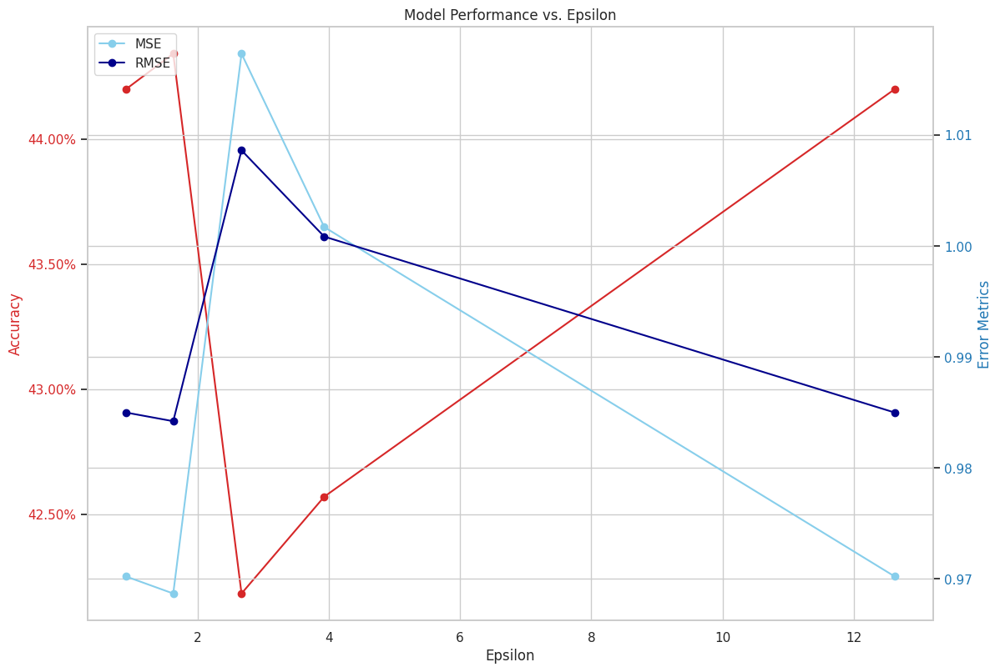

In [ ]:
def calculate_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return accuracy, mse, rmse

epsilons = [np.inf, 12.62, 3.93, 2.67, 1.63, 0.91]
y_true = [y_true_e100nn, y_true_dph8e100nn, y_true_dp15e100n, y_true_dp2e100nn, y_true_dp3e100nn, y_true_dp5e100nn]
y_pred = [y_pred_e100nn, y_pred_dph8e100nn, y_pred_dp15e100n, y_pred_dp2e100nn, y_pred_dp3e100nn, y_pred_dp5e100nn]
model_names = ['Base Model', 'Model with Noise 0.8', 'Model with Noise 1.5', 'Model with Noise 2', 'Model with Noise 3', 'Model with Noise 5']

accuracy_values = []
mse_values = []
rmse_values = []

for yt, yp, model_name in zip(y_true, y_pred, model_names):
    accuracy, mse, rmse = calculate_metrics(yt, yp)
    print(f"Metrics for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Root Mean Squared Error: {rmse:.2f}\n")

    accuracy_values.append(accuracy)
    mse_values.append(mse)
    rmse_values.append(rmse)

import matplotlib.ticker as mtick

fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('Epsilon')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(epsilons, accuracy_values, color=color, marker='o')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Error Metrics', color=color)
ax2.plot(epsilons, mse_values, color='skyblue', marker='o', label='MSE')
ax2.plot(epsilons, rmse_values, color='darkblue', marker='o', label='RMSE')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()

# Format the y-axis to percentage for accuracy
ax1.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Add a legend
fig.legend(loc="upper left", bbox_to_anchor=(0,1), bbox_transform=ax1.transAxes)

plt.title('Model Performance vs. Epsilon')
plt.grid(True)
plt.show()



In [ ]:
from sklearn.metrics import classification_report

# Base Model
print("Base Model")
print(classification_report(y_true_e100nn, y_pred_e100nn))

# Noise = 0.8
print("Noise = 0.8")
print(classification_report(y_true_dph8e100nn, y_pred_dph8e100nn))

# Noise = 1.5
print("Noise = 1.5")
print(classification_report(y_true_dp15e100n, y_pred_dp15e100n))

# Noise = 2
print("Noise = 2")
print(classification_report(y_true_dp2e100nn, y_pred_dp2e100nn))

# Noise = 3
print("Noise = 3")
print(classification_report(y_true_dp3e100nn, y_pred_dp3e100nn))

# Noise = 5
print("Noise = 5")
print(classification_report(y_true_dp5e100nnn, y_pred_dp5e100nnn))

Base Model
              precision    recall  f1-score   support

           1       0.56      0.26      0.36      5652
           2       0.38      0.11      0.17     10773
           3       0.40      0.46      0.43     26073
           4       0.45      0.59      0.51     34819
           5       0.54      0.46      0.50     22704

    accuracy                           0.46    100021
   macro avg       0.47      0.38      0.39    100021
weighted avg       0.46      0.46      0.44    100021

Noise = 0.8
              precision    recall  f1-score   support

           1       0.63      0.13      0.21      5651
           2       0.34      0.09      0.15     10769
           3       0.40      0.42      0.41     26071
           4       0.43      0.66      0.52     34812
           5       0.57      0.37      0.45     22697

    accuracy                           0.44    100000
   macro avg       0.47      0.34      0.35    100000
weighted avg       0.46      0.44      0.42    100000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.72      0.02      0.03      5651
           2       0.32      0.04      0.08     10769
           3       0.37      0.42      0.39     26071
           4       0.42      0.70      0.52     34812
           5       0.57      0.29      0.38     22697

    accuracy                           0.42    100000
   macro avg       0.48      0.29      0.28    100000
weighted avg       0.45      0.42      0.38    100000

Noise = 3
              precision    recall  f1-score   support

           1       0.61      0.15      0.24      5651
           2       0.35      0.09      0.15     10769
           3       0.40      0.42      0.41     26071
           4       0.43      0.66      0.52     34812
           5       0.57      0.38      0.45     22697

    accuracy                           0.44    100000
   macro avg       0.47      0.34      0.35    100000
weighted avg       0.46      0.44      0.42    100000

Noise = 5
  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import plotly.graph_objects as go

# create the dataset
epsilon_values = ["0.91", "1.63", "2.67", "3.93", "12.62", "Inf"]
classes = ['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']

f1_scores = [
    [0.00, 0.24, 0.03, 0.00, 0.21, 0.36],
    [0.00, 0.15, 0.08, 0.00, 0.15, 0.17],
    [0.07, 0.41, 0.39, 0.41, 0.41, 0.43],
    [0.52, 0.52, 0.52, 0.52, 0.52, 0.51],
    [0.02, 0.45, 0.38, 0.40, 0.45, 0.50]
]

# Create subplots
fig = go.Figure()

for i in range(len(classes)):
    fig.add_trace(go.Bar(
        x=epsilon_values,
        y=f1_scores[i],
        name=classes[i],
    ))

# Set layout
fig.update_layout(
    barmode='group',
    xaxis_title="Epsilon",
    yaxis_title="F1-Score",
    title_text="F1-Scores for Different Noise Levels and Classes"
)

# Show the plot
fig.show()


In [ ]:
import plotly.graph_objects as go

# create the dataset
epsilon_values = ["0.91", "1.63", "2.67", "3.93", "12.62", "Inf"]
classes = ['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']

f1_scores = [
    [0.00, 0.24, 0.03, 0.00, 0.21, 0.36],
    [0.00, 0.15, 0.08, 0.00, 0.15, 0.17],
    [0.07, 0.41, 0.39, 0.41, 0.41, 0.43],
    [0.52, 0.52, 0.52, 0.52, 0.52, 0.51],
    [0.02, 0.45, 0.38, 0.40, 0.45, 0.50]
]

# Blue color scale
colorscale = ['#add8e6', '#87cefa', '#1e90ff', '#0000cd', '#00008b']

# Create subplots
fig = go.Figure()

for i in range(len(classes)):
    fig.add_trace(go.Bar(
        x=epsilon_values,
        y=f1_scores[i],
        name=classes[i],
        marker_color=colorscale[i],  # assign color value
    ))

# Set layout
fig.update_layout(
    barmode='group',
    xaxis_title="Epsilon",
    yaxis_title="F1-Score",
    title_text="F1-Scores for Different Noise Levels and Classes",
    plot_bgcolor='white',  # white background
    xaxis=dict(
        linecolor='black',
        gridcolor='lightgray'
    ),
    yaxis=dict(
        linecolor='black',
        gridcolor='lightgray'
    ),
    font=dict(
        size=12,
        color="black"
    ),
)

# Show the plot
fig.show()



In [ ]:
import plotly.graph_objects as go

# create the dataset
epsilon_values = ["0.91", "1.63", "2.67", "3.93", "12.62", "Inf"]
classes = ['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']

precision_values = [
    [0.00, 0.61, 0.72, 0.00, 0.63, 0.56],
    [0.00, 0.35, 0.32, 0.00, 0.34, 0.38],
    [0.36, 0.40, 0.37, 0.36, 0.40, 0.40],
    [0.35, 0.43, 0.42, 0.43, 0.43, 0.45],
    [0.51, 0.57, 0.57, 0.59, 0.57, 0.54]
]

# Create subplots
fig = go.Figure()

for i in range(len(classes)):
    fig.add_trace(go.Bar(
        x=epsilon_values,
        y=precision_values[i],
        name=classes[i],
    ))

# Set layout
fig.update_layout(
    barmode='group',
    xaxis_title="Epsilon",
    yaxis_title="Precision",
    title_text="Precision for Different Epsilon Values and Classes"
)

# Show the plot
fig.show()




In [ ]:
import plotly.graph_objects as go

# create the dataset
epsilon_values = ["0.91", "1.63", "2.67", "3.93", "12.62", "Inf"]
classes = ['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']

precision_values = [
    [0.00, 0.61, 0.72, 0.00, 0.63, 0.56],
    [0.00, 0.35, 0.32, 0.00, 0.34, 0.38],
    [0.36, 0.40, 0.37, 0.36, 0.40, 0.40],
    [0.35, 0.43, 0.42, 0.43, 0.43, 0.45],
    [0.51, 0.57, 0.57, 0.59, 0.57, 0.54]
]

# Blue color scale
colorscale = ['#add8e6', '#87cefa', '#1e90ff', '#0000cd', '#00008b']

# Create subplots
fig = go.Figure()

for i in range(len(classes)):
    fig.add_trace(go.Bar(
        x=epsilon_values,
        y=precision_values[i],
        name=classes[i],
        marker_color=colorscale[i],  # assign color value
    ))

# Set layout
fig.update_layout(
    barmode='group',
    xaxis_title="Epsilon",
    yaxis_title="Precision",
    title_text="Precision for Different Epsilon Values and Classes",
    plot_bgcolor='white',  # white background
    xaxis=dict(
        linecolor='black',
        gridcolor='lightgray'
    ),
    yaxis=dict(
        linecolor='black',
        gridcolor='lightgray'
    ),
    font=dict(
        size=12,
        color="black"
    ),
)

# Show the plot
fig.show()



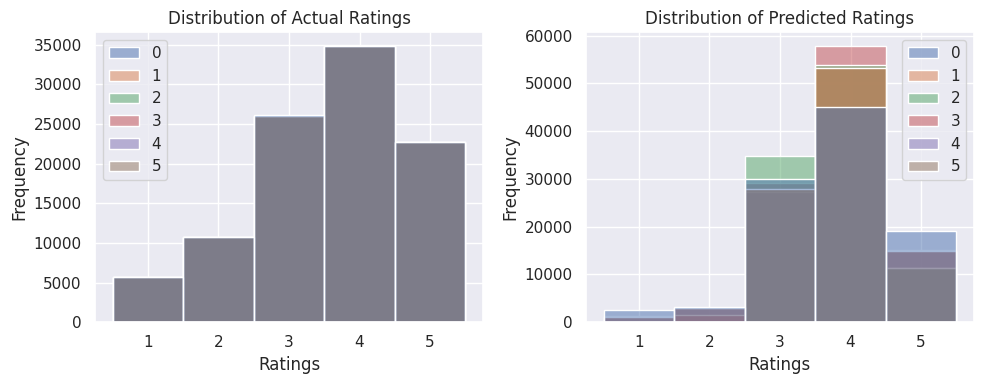

Figure 1: Histograms showing the distribution of actual and predicted movie ratings.


In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set dark grid style and color palette
sns.set_style("darkgrid")
blue_palette = sns.color_palette("Blues")

# Create a figure with a specific size
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Plot actual ratings
sns.histplot(y_true, bins=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5], ax=ax[0], kde=False, color=blue_palette[-2])
ax[0].set_title('Distribution of Actual Ratings')  # Title
ax[0].set_xlabel('Ratings')  # X-axis label
ax[0].set_ylabel('Frequency')  # Y-axis label

# Plot predicted ratings
sns.histplot(y_pred, bins=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5], ax=ax[1], kde=False, color=blue_palette[-1])
ax[1].set_title('Distribution of Predicted Ratings')  # Title
ax[1].set_xlabel('Ratings')  # X-axis label
ax[1].set_ylabel('Frequency')  # Y-axis label

# Adjust layout for better spacing
plt.tight_layout()

# Show the figure with the histograms
plt.show()

# Caption of the figure
print("Figure 1: Histograms showing the distribution of actual and predicted movie ratings.")


###7.1 Visualization (3 Epsilon + Base Model)

In [ ]:
# Load all model



#### 7.1.1 Loss Function [40 Epochs]

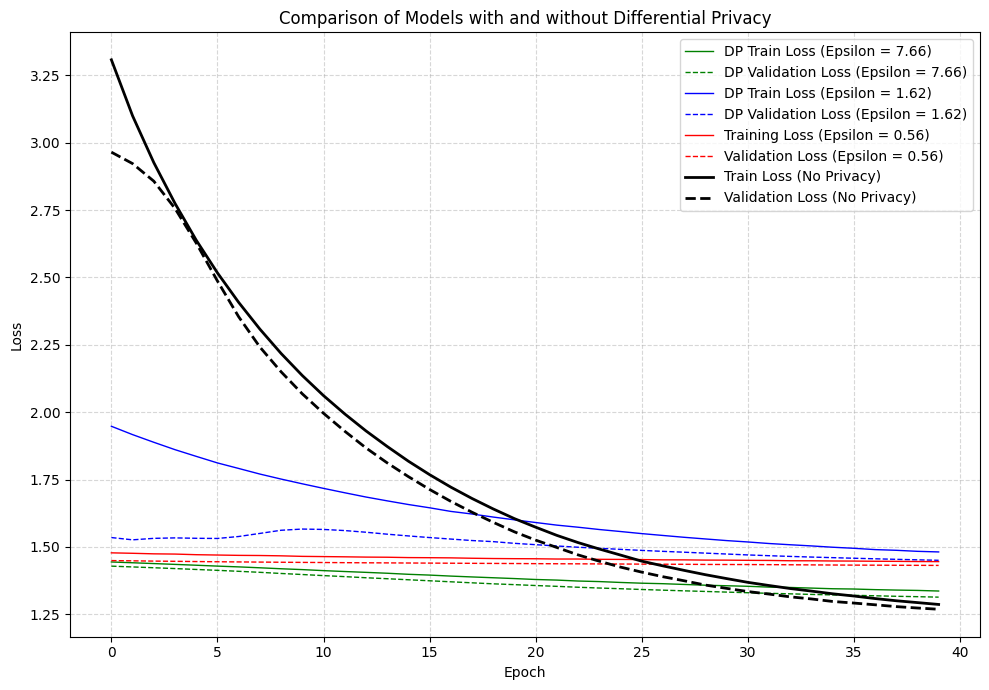

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

# Plot loss for the DP model
plt.plot(dph8.history['loss'], linestyle='-', linewidth=1, color='green', label='DP Train Loss (Epsilon = 7.66)')
plt.plot(dph8.history['val_loss'], linestyle='--', linewidth=1, color='green', label='DP Validation Loss (Epsilon = 7.66)')

plt.plot(dp2.history['loss'], linestyle='-', linewidth=1, color='blue', label='DP Train Loss (Epsilon = 1.62)')
plt.plot(dp2.history['val_loss'], linestyle='--', linewidth=1, color='blue', label='DP Validation Loss (Epsilon = 1.62)')

plt.plot(dp5_train_loss, linestyle='-', linewidth=1, color='red', label='Training Loss (Epsilon = 0.56)')
plt.plot(dp5_val_loss, linestyle='--', linewidth=1, color='red', label='Validation Loss (Epsilon = 0.56)')

# Plot loss for the non-DP model
plt.plot(DLRS.history['loss'], linestyle='-', linewidth=2, color='black', label='Train Loss (No Privacy)')
plt.plot(DLRS.history['val_loss'], linestyle='--', linewidth=2, color='black', label='Validation Loss (No Privacy)')

plt.title('Comparison of Models with and without Differential Privacy')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots

plt.savefig('model_comparison.png')  # Save the figure as an image
plt.show()


#### 7.1.2 Loss Function [100 Epochs]

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

# Plot loss for the DP model
plt.plot(dph8e100.history['loss'], linestyle='-', linewidth=1, color='green', label='DP Train Loss (Epsilon = 12.62)')
plt.plot(dph8.history['val_loss'], linestyle='--', linewidth=1, color='green', label='DP Validation Loss (Epsilon = 12.62)')


plt.plot(dp15e100.history['loss'], linestyle='-', linewidth=1, color='blue', label='DP Train Loss (Epsilon = 3.93)')
plt.plot(dp15e100.history['val_loss'], linestyle='--', linewidth=1, color='blue', label='DP Validation Loss (Epsilon = 3.93)')


plt.plot(dp2e100.history['loss'], linestyle='-', linewidth=1, color='blue', label='DP Train Loss (Epsilon = 2.67)')
plt.plot(dp2e100.history['val_loss'], linestyle='--', linewidth=1, color='blue', label='DP Validation Loss (Epsilon = 2.67)')

plt.plot(dp5e100.history['loss'], linestyle='-', linewidth=1, color='blue', label='DP Train Loss (Epsilon = 0.91)')
plt.plot(dp5e100.history['val_loss'], linestyle='--', linewidth=1, color='blue', label='DP Validation Loss (Epsilon = 0.91)')

# Plot loss for the non-DP model
plt.plot(DLRSe100.history['loss'], linestyle='-', linewidth=2, color='black', label='Train Loss (No Privacy/ Epsilon = ∞)')
plt.plot(DLRSe100.history['val_loss'], linestyle='--', linewidth=2, color='black', label='Validation Loss (No Privacy/ Epsilon = ∞)')

plt.title('Comparison of Models with and without Differential Privacy')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots

plt.savefig('model_comparison.png')  # Save the figure as an image
plt.show()


#### 7.1.3 Accuracy [40 Epochs]

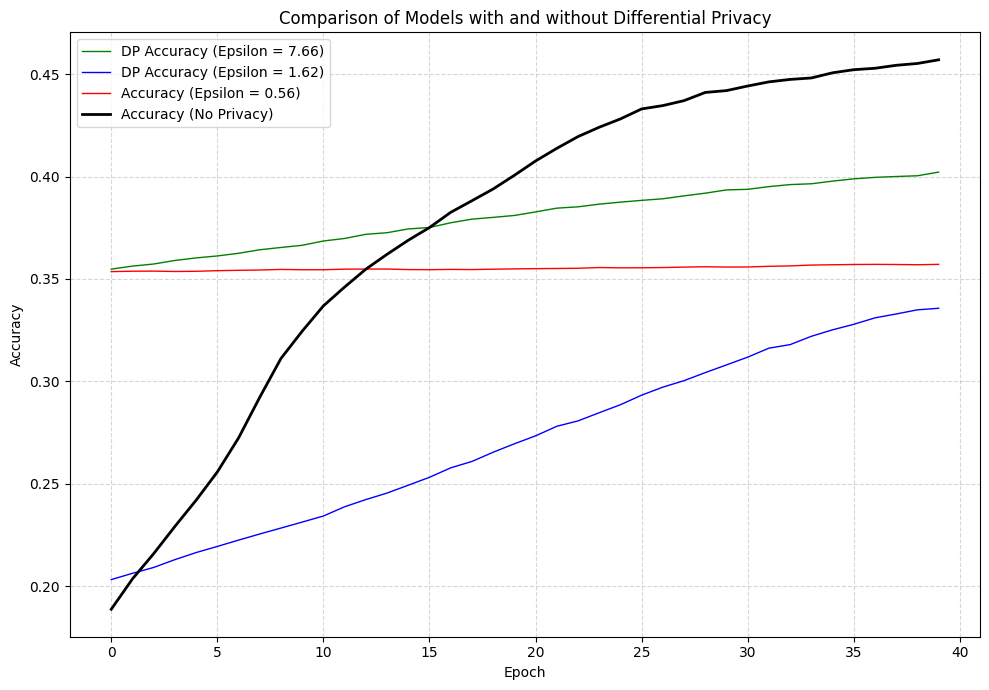

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

# Plot loss for the DP model
plt.plot(dph8.history['accuracy'], linestyle='-', linewidth=1, color='green', label='DP Accuracy (Epsilon = 7.66)')

plt.plot(dp2.history['accuracy'], linestyle='-', linewidth=1, color='blue', label='DP Accuracy (Epsilon = 1.62)')

plt.plot(dp5_val_accuracy, linestyle='-', linewidth=1, color='red', label='Accuracy (Epsilon = 0.56)')

# Plot loss for the non-DP model
plt.plot(DLRS.history['accuracy'], linestyle='-', linewidth=2, color='black', label='Accuracy (No Privacy)')

plt.title('Comparison of Models with and without Differential Privacy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines with dashed style and reduced opacity
plt.tight_layout()  # Improve spacing between subplots

plt.savefig('model_comparison_accuracy.png')  # Save the figure as an image
plt.show()

#### 7.1.4 Accuracy [100 Epochs]

### 7.2 Compare with different epsilons value

Epoch 1/40


80/80 [==============================] - 55s 641ms/step - loss: 1.3358 - accuracy: 0.4020 - val_loss: 1.3140 - val_accuracy: 0.4080
Epoch 2/40
80/80 [==============================] - 51s 636ms/step - loss: 1.3359 - accuracy: 0.4016 - val_loss: 1.3140 - val_accuracy: 0.4073
Epoch 3/40
80/80 [==============================] - 51s 633ms/step - loss: 1.3365 - accuracy: 0.4014 - val_loss: 1.3141 - val_accuracy: 0.4070
Epoch 4/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3358 - accuracy: 0.4015 - val_loss: 1.3142 - val_accuracy: 0.4071
Epoch 5/40
80/80 [==============================] - 51s 634ms/step - loss: 1.3361 - accuracy: 0.4020 - val_loss: 1.3142 - val_accuracy: 0.4072
Epoch 6/40
80/80 [==============================] - 50s 631ms/step - loss: 1.3366 - accuracy: 0.4021 - val_loss: 1.3143 - val_accuracy: 0.4074
Epoch 7/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3358 - accuracy: 0.4023 - val_loss: 1.3144 - val_accuracy: 0.4069
Epoch 8/40

Epoch 1/40


80/80 [==============================] - 55s 637ms/step - loss: 1.3365 - accuracy: 0.4016 - val_loss: 1.3137 - val_accuracy: 0.4074
Epoch 2/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3357 - accuracy: 0.4023 - val_loss: 1.3136 - val_accuracy: 0.4069
Epoch 3/40
80/80 [==============================] - 51s 640ms/step - loss: 1.3353 - accuracy: 0.4024 - val_loss: 1.3132 - val_accuracy: 0.4073
Epoch 4/40
80/80 [==============================] - 51s 639ms/step - loss: 1.3356 - accuracy: 0.4024 - val_loss: 1.3129 - val_accuracy: 0.4076
Epoch 5/40
80/80 [==============================] - 51s 637ms/step - loss: 1.3351 - accuracy: 0.4020 - val_loss: 1.3130 - val_accuracy: 0.4077
Epoch 6/40
80/80 [==============================] - 51s 637ms/step - loss: 1.3353 - accuracy: 0.4024 - val_loss: 1.3127 - val_accuracy: 0.4072
Epoch 7/40
80/80 [==============================] - 51s 638ms/step - loss: 1.3351 - accuracy: 0.4027 - val_loss: 1.3127 - val_accuracy: 0.4071
Epoch 8/40

Epoch 1/40


80/80 [==============================] - 55s 642ms/step - loss: 1.3285 - accuracy: 0.4054 - val_loss: 1.3065 - val_accuracy: 0.4100
Epoch 2/40
80/80 [==============================] - 51s 634ms/step - loss: 1.3281 - accuracy: 0.4060 - val_loss: 1.3059 - val_accuracy: 0.4108
Epoch 3/40
80/80 [==============================] - 51s 633ms/step - loss: 1.3274 - accuracy: 0.4062 - val_loss: 1.3053 - val_accuracy: 0.4111
Epoch 4/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3263 - accuracy: 0.4072 - val_loss: 1.3047 - val_accuracy: 0.4117
Epoch 5/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3264 - accuracy: 0.4064 - val_loss: 1.3043 - val_accuracy: 0.4119
Epoch 6/40
80/80 [==============================] - 51s 634ms/step - loss: 1.3253 - accuracy: 0.4080 - val_loss: 1.3038 - val_accuracy: 0.4124
Epoch 7/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3255 - accuracy: 0.4072 - val_loss: 1.3035 - val_accuracy: 0.4125
Epoch 8/40

Epoch 1/40


80/80 [==============================] - 55s 637ms/step - loss: 1.3109 - accuracy: 0.4145 - val_loss: 1.2906 - val_accuracy: 0.4190
Epoch 2/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3101 - accuracy: 0.4154 - val_loss: 1.2898 - val_accuracy: 0.4196
Epoch 3/40
80/80 [==============================] - 51s 637ms/step - loss: 1.3095 - accuracy: 0.4151 - val_loss: 1.2892 - val_accuracy: 0.4204
Epoch 4/40
80/80 [==============================] - 51s 636ms/step - loss: 1.3082 - accuracy: 0.4161 - val_loss: 1.2885 - val_accuracy: 0.4204
Epoch 5/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3078 - accuracy: 0.4162 - val_loss: 1.2879 - val_accuracy: 0.4206
Epoch 6/40
80/80 [==============================] - 51s 635ms/step - loss: 1.3067 - accuracy: 0.4166 - val_loss: 1.2873 - val_accuracy: 0.4210
Epoch 7/40
80/80 [==============================] - 51s 634ms/step - loss: 1.3066 - accuracy: 0.4168 - val_loss: 1.2868 - val_accuracy: 0.4211
Epoch 8/40

Epoch 1/40


80/80 [==============================] - 55s 640ms/step - loss: 1.2893 - accuracy: 0.4258 - val_loss: 1.2728 - val_accuracy: 0.4300
Epoch 2/40
80/80 [==============================] - 51s 636ms/step - loss: 1.2880 - accuracy: 0.4264 - val_loss: 1.2724 - val_accuracy: 0.4301
Epoch 3/40
80/80 [==============================] - 51s 635ms/step - loss: 1.2886 - accuracy: 0.4261 - val_loss: 1.2721 - val_accuracy: 0.4304
Epoch 4/40
80/80 [==============================] - 51s 633ms/step - loss: 1.2882 - accuracy: 0.4269 - val_loss: 1.2716 - val_accuracy: 0.4308
Epoch 5/40
80/80 [==============================] - 51s 634ms/step - loss: 1.2882 - accuracy: 0.4262 - val_loss: 1.2713 - val_accuracy: 0.4311
Epoch 6/40
80/80 [==============================] - 51s 635ms/step - loss: 1.2869 - accuracy: 0.4276 - val_loss: 1.2709 - val_accuracy: 0.4312
Epoch 7/40
80/80 [==============================] - 51s 639ms/step - loss: 1.2863 - accuracy: 0.4276 - val_loss: 1.2707 - val_accuracy: 0.4313
Epoch 8/40

Epoch 1/40


80/80 [==============================] - 55s 637ms/step - loss: 1.2743 - accuracy: 0.4342 - val_loss: 1.2621 - val_accuracy: 0.4378
Epoch 2/40
80/80 [==============================] - 51s 634ms/step - loss: 1.2744 - accuracy: 0.4346 - val_loss: 1.2618 - val_accuracy: 0.4380
Epoch 3/40
80/80 [==============================] - 51s 640ms/step - loss: 1.2742 - accuracy: 0.4350 - val_loss: 1.2617 - val_accuracy: 0.4384
Epoch 4/40
80/80 [==============================] - 51s 639ms/step - loss: 1.2734 - accuracy: 0.4353 - val_loss: 1.2614 - val_accuracy: 0.4387
Epoch 5/40
80/80 [==============================] - 51s 633ms/step - loss: 1.2733 - accuracy: 0.4351 - val_loss: 1.2612 - val_accuracy: 0.4389
Epoch 6/40
80/80 [==============================] - 51s 636ms/step - loss: 1.2727 - accuracy: 0.4351 - val_loss: 1.2610 - val_accuracy: 0.4388
Epoch 7/40
80/80 [==============================] - 51s 634ms/step - loss: 1.2731 - accuracy: 0.4348 - val_loss: 1.2608 - val_accuracy: 0.4387
Epoch 8/40

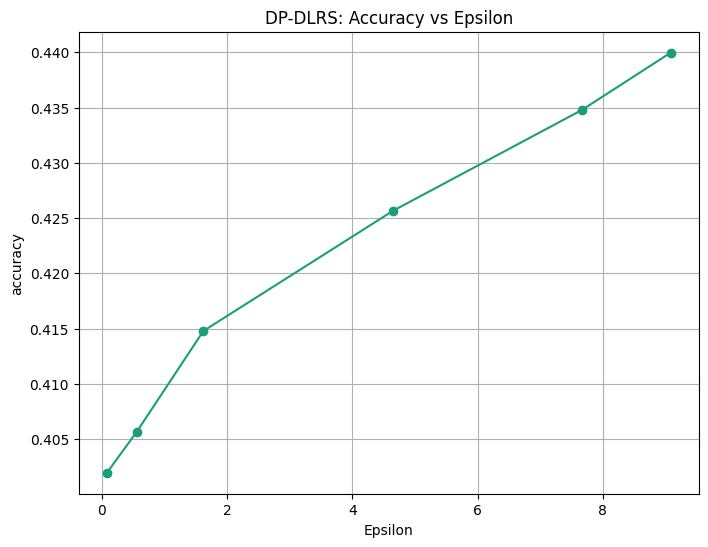

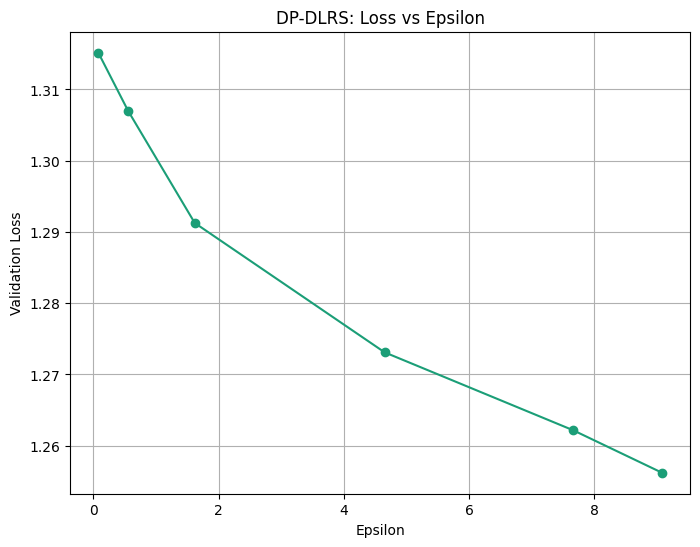

In [ ]:
# Define your noise multipliers
noise_multipliers = [30, 5, 2, 1, 0.8, 0.75]

# Initialize lists to store the results
epsilons = []
accuracies = []
losses = []

# Update the total number of training examples to the size of your sample
N_sample = len(dp_train_user)

for dp_noise_multiplier in noise_multipliers:
    # Compute the privacy budget
    eps, _ = tfp.compute_dp_sgd_privacy(
        n= N_sample,
        batch_size= dp_batch_size,
        noise_multiplier= dp_noise_multiplier,
        epochs= dp_epochs,
        delta= 1e-5
        )
    epsilons.append(eps)

    # Train model with the given noise multiplier
    dp_optimizer = tensorflow_privacy.DPKerasAdamOptimizer(
        l2_norm_clip= dp_l2_norm_clip,
        noise_multiplier= dp_noise_multiplier,
        num_microbatches= dp_num_microbatches,
        learning_rate= dp_learning_rate)

    dp_model.compile(optimizer= dp_optimizer,
                     loss= dp_loss,
                     metrics=['accuracy'])

    DP_DLRS_EPS = dp_model.fit(
        x=[dp_train_user, dp_train_movie],
        y= dp_train_ratings_one_hot,
        epochs= dp_epochs,
        batch_size= dp_batch_size,
        validation_data=([dp_val_user, dp_val_movie], dp_val_ratings_one_hot),
        callbacks=[early_stopping],
        verbose=1
    )

    # Append final validation loss and accuracy to their respective lists
    losses.append(DP_DLRS_EPS.history['val_loss'][-1])
    accuracies.append(DP_DLRS_EPS.history['accuracy'][-1])

# Plot epsilon vs accuracy
plt.figure(figsize=(8, 6))
plt.plot(epsilons, accuracies, marker='o')
plt.title('DP-DLRS: Accuracy vs Epsilon')
plt.xlabel('Epsilon')
plt.ylabel('accuracy')
plt.grid(True)
plt.show()

# Plot epsilon vs loss
plt.figure(figsize=(8, 6))
plt.plot(epsilons, losses, marker='o')
plt.title('DP-DLRS: Loss vs Epsilon')
plt.xlabel('Epsilon')
plt.ylabel('Validation Loss')
plt.grid(True)
plt.show()


In [ ]:
import matplotlib.ticker as mticker


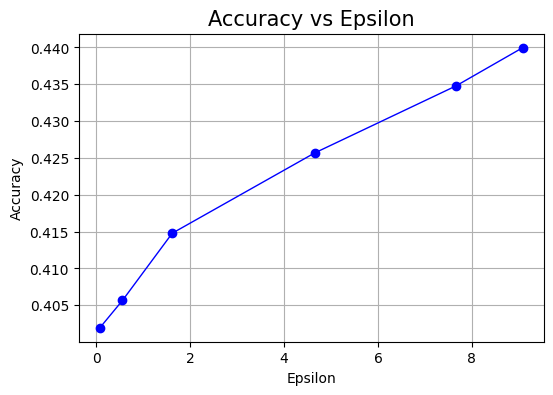

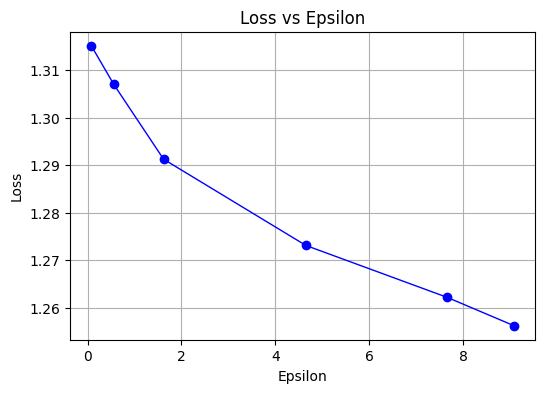

In [ ]:
# Trim the values for epsilon, loss, and accuracy based on your requirement
indices = [i for i, e in enumerate(epsilons[:-1]) if 0 <= e <= 11]
indices.append(-1)  # add the index for 'Non-private' (epsilon = inf)
epsilons_trimmed = [round(epsilons[i], 2) if epsilons[i] != 'Non-private' else 'inf' for i in indices]
losses_trimmed = [losses[i][-1] if isinstance(losses[i], list) else losses[i] for i in indices]
accuracies_trimmed = [accuracies[i][-1] if isinstance(accuracies[i], list) else accuracies[i] for i in indices]

# Convert 'Non-private' to 'inf' in epsilon list for plotting
epsilons_trimmed = [e if e != 'Non-private' else 'inf' for e in epsilons_trimmed]

# Accuracy plot
plt.figure(figsize=(6, 4))
plt.plot(epsilons_trimmed, accuracies_trimmed, marker='o', linestyle='-', color='blue', linewidth=1)
plt.title('Accuracy vs Epsilon', fontsize=15)
plt.xlabel('Epsilon', fontsize=10)
plt.ylabel('Accuracy', fontsize=10)
plt.grid(True)
plt.gca().xaxis.set_major_locator(mticker.MaxNLocator(nbins=6))
plt.show()

# Loss plot
plt.figure(figsize=(6, 4))
plt.plot(epsilons_trimmed, losses_trimmed, marker='o', linestyle='-', color='blue', linewidth=1)
plt.title('Loss vs Epsilon', fontsize=12)
plt.xlabel('Epsilon', fontsize=10)
plt.ylabel('Loss', fontsize=10)
plt.grid(True)
plt.gca().xaxis.set_major_locator(mticker.MaxNLocator(nbins=6))
plt.show()

# Step8: Visualize the difference between model with and without DP

Prediction Distribution

Get Predictions Value

Prediction Value

1) Base Model:
y_pred

2) Low noise (Noise = 0.8):
y_pred_dph8

3) Medium noise (Noise = 2):
y_pred_dp2

4) High noise (Noise = 5):
y_pred_dp5

Plot Prediction Distribution

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

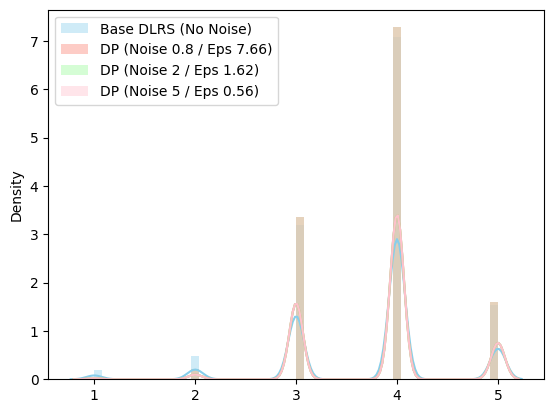

In [ ]:
# Create figure and axes
fig, ax = plt.subplots()

# Plot prediction distributions
sns.distplot(y_pred, color='skyblue', ax=ax, label='Base DLRS (No Noise)')
sns.distplot(y_pred_dph8, color='salmon', ax=ax, label='DP (Noise 0.8 / Eps 7.66)')
sns.distplot(y_pred_dp2 , color='palegreen', ax=ax, label='DP (Noise 2 / Eps 1.62)')
sns.distplot(y_pred_dp5, color='pink', ax=ax, label='DP (Noise 5 / Eps 0.56)')

# Show legend
ax.legend()

# Show the plot
plt.show()


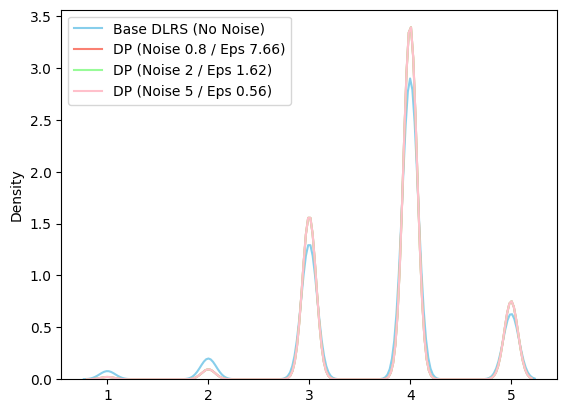

In [ ]:
# Create figure and axes
fig, ax = plt.subplots()

# Plot prediction distributions
sns.distplot(y_pred, hist=False, kde=True,color='skyblue', ax=ax, label='Base DLRS (No Noise)')
sns.distplot(y_pred_dph8, hist=False, kde=True,color='salmon', ax=ax, label='DP (Noise 0.8 / Eps 7.66)')
sns.distplot(y_pred_dp2 , hist=False, kde=True,color='palegreen', ax=ax, label='DP (Noise 2 / Eps 1.62)')
sns.distplot(y_pred_dp5, hist=False, kde=True,color='pink', ax=ax, label='DP (Noise 5 / Eps 0.56)')

# Show legend
ax.legend()

# Show the plot
plt.show()


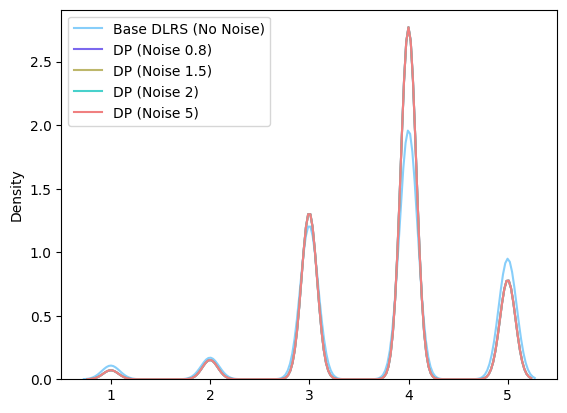

In [ ]:
# Create figure and axes
fig, ax = plt.subplots()

# Plot prediction distributions


sns.distplot(y_pred_e100, hist=False, kde=True,color='lightskyblue', ax=ax, label='Base DLRS (No Noise)')
sns.distplot(y_pred_dph8e100, hist=False, kde=True,color='mediumslateblue', ax=ax, label='DP (Noise 0.8)')
sns.distplot(y_pred_dp15e100 , hist=False, kde=True,color='darkkhaki', ax=ax, label='DP (Noise 1.5)')
sns.distplot(y_pred_dp2e100 , hist=False, kde=True,color='mediumturquoise', ax=ax, label='DP (Noise 2)')
sns.distplot(y_pred_dp5e100, hist=False, kde=True,color='lightcoral', ax=ax, label='DP (Noise 5)')

# Show legend
ax.legend()

# Show the plot
plt.show()

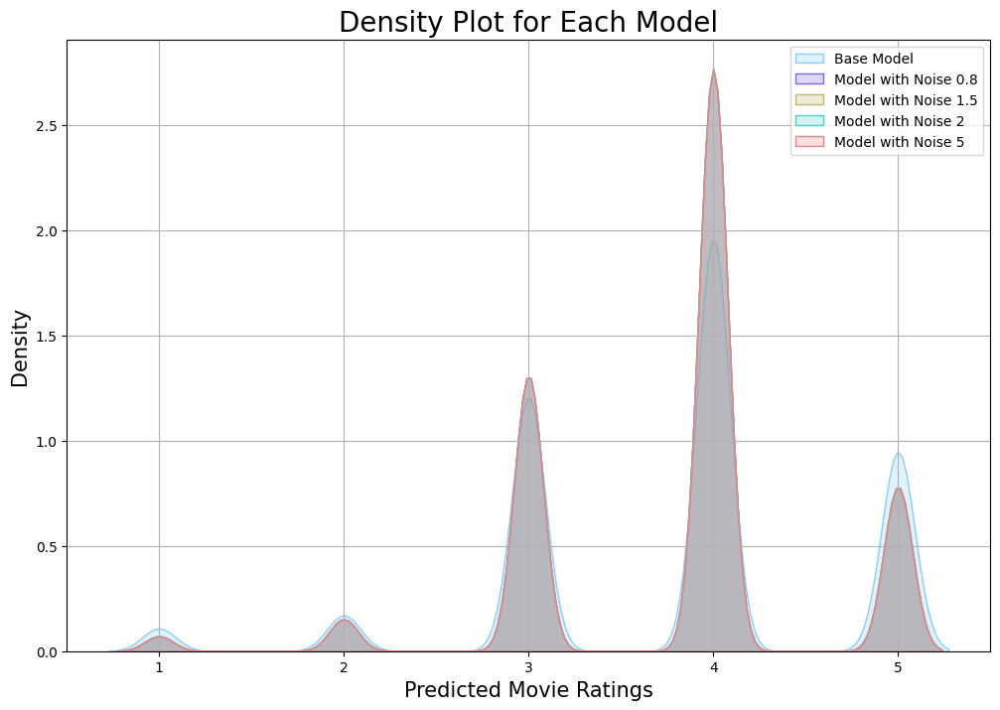

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dph8e100, color='mediumslateblue', shade=True, label='Model with Noise 0.8')
sns.kdeplot(y_pred_dp15e100, color='darkkhaki', shade=True, label='Model with Noise 1.5')
sns.kdeplot(y_pred_dp2e100, color='mediumturquoise', shade=True, label='Model with Noise 2')
sns.kdeplot(y_pred_dp5e100, color='lightcoral', shade=True, label='Model with Noise 5')

# Labels
plt.title('Density Plot for Each Model', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()


NameError: ignored

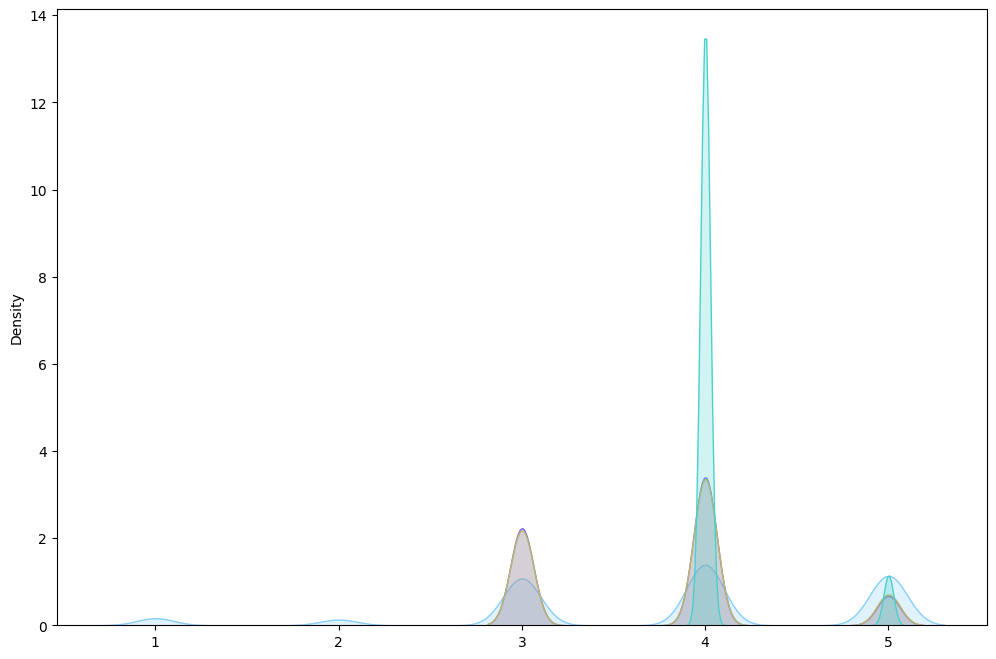

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Draw the KDE plot for each model
sns.kdeplot(y_pred_e100n, color='lightskyblue', shade=True, label='Base Model')
sns.kdeplot(y_pred_dph8e100n, color='mediumslateblue', shade=True, label='Model with Noise 0.8')
sns.kdeplot(y_pred_dp15e100n, color='darkkhaki', shade=True, label='Model with Noise 1.5')
sns.kdeplot(y_pred_dp2e100n, color='mediumturquoise', shade=True, label='Model with Noise 2')
sns.kdeplot(y_predsdp3e100n, color='mediumturquoise', shade=True, label='Model with Noise 3')
sns.kdeplot(y_pred_dp5e100n, color='lightcoral', shade=True, label='Model with Noise 5')

# Labels
plt.title('Density Plot for Each Model', size=20)
plt.xlabel('Predicted Movie Ratings', size=15)
plt.ylabel('Density', size=15)
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Confusion matrix for base model
DSLR_cm100 = confusion_matrix(y_true_e100n, y_pred_e100n)
plt.figure(figsize=(5,5))
sns.heatmap(DSLR_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('Base Model (No Noise) Confusion Matrix', size = 15);

# Confusion matrix for dph8 model
dph8_cm100 = confusion_matrix(y_true_dph8e100n, y_pred_dph8e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dph8_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 0.8) Confusion Matrix', size = 15);

# Confusion matrix for dp15 model
dp15_cm100 = confusion_matrix(y_true_dp15e100n, y_pred_dp15e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp15_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 1.5) Confusion Matrix', size = 15);

# Confusion matrix for dp2 model
dp2_cm100 = confusion_matrix(y_true_dp2e100n, y_pred_dp2e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp2_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 2) Confusion Matrix', size = 15);

# Confusion matrix for dp3 model
dp3_cm100 = confusion_matrix(y_true_dp3e100n, y_pred_dp3e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp3_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 3) Confusion Matrix', size = 15);

# Confusion matrix for dp5 model
dp5_cm100 = confusion_matrix(y_true_dp5e100n, y_pred_dp5e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp5_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 5) Confusion Matrix', size = 15);

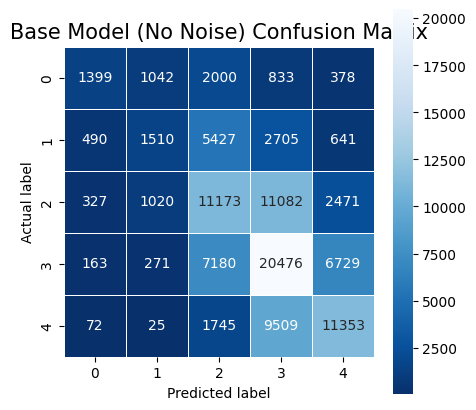

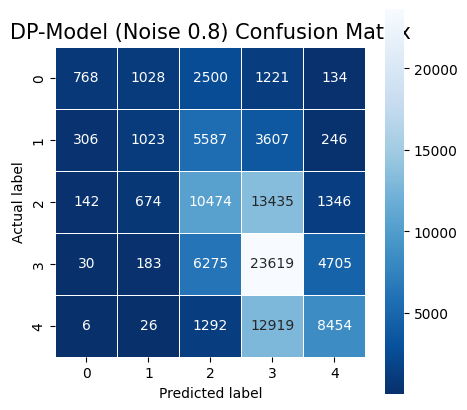

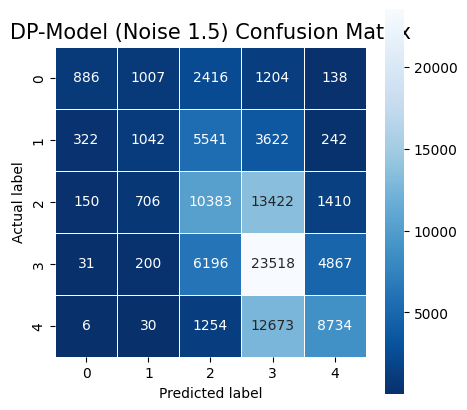

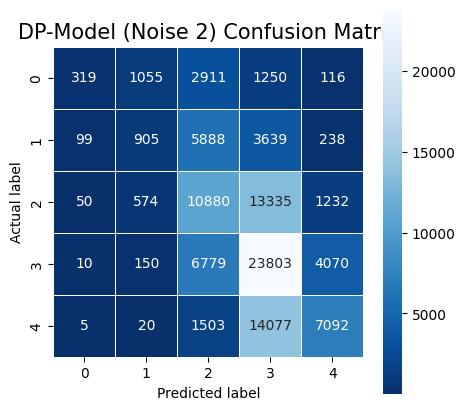

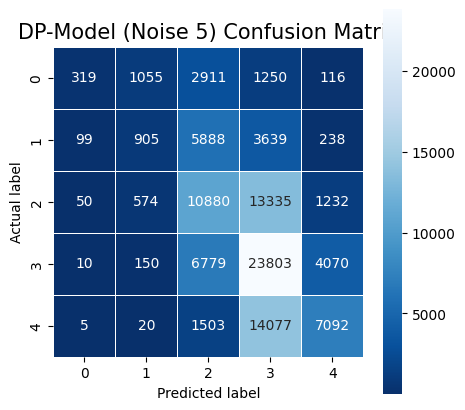

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Confusion matrix for base model
DSLR_cm100 = confusion_matrix(y_true_e100n, y_pred_e100n)
plt.figure(figsize=(5,5))
sns.heatmap(DSLR_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('Base Model (No Noise) Confusion Matrix', size = 15);

# Confusion matrix for dph8 model
dph8_cm100 = confusion_matrix(y_true_dph8e100n, y_pred_dph8e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dph8_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 0.8) Confusion Matrix', size = 15);

# Confusion matrix for dp15 model
dp15_cm100 = confusion_matrix(y_true_dp15e100n, y_pred_dp15e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp15_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 1.5) Confusion Matrix', size = 15);

# Confusion matrix for dp2 model
dp2_cm100 = confusion_matrix(y_true_dp2e100n, y_pred_dp2e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp2_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 2) Confusion Matrix', size = 15);

# Confusion matrix for dp3 model
dp3_cm100 = confusion_matrix(y_true_dp3e100n, y_pred_dp3e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp3_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 3) Confusion Matrix', size = 15);

# Confusion matrix for dp5 model
dp5_cm100 = confusion_matrix(y_true_dp5e100n, y_pred_dp5e100n)
plt.figure(figsize=(5,5))
sns.heatmap(dp5_cm100, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('DP-Model (Noise 5) Confusion Matrix', size = 15);


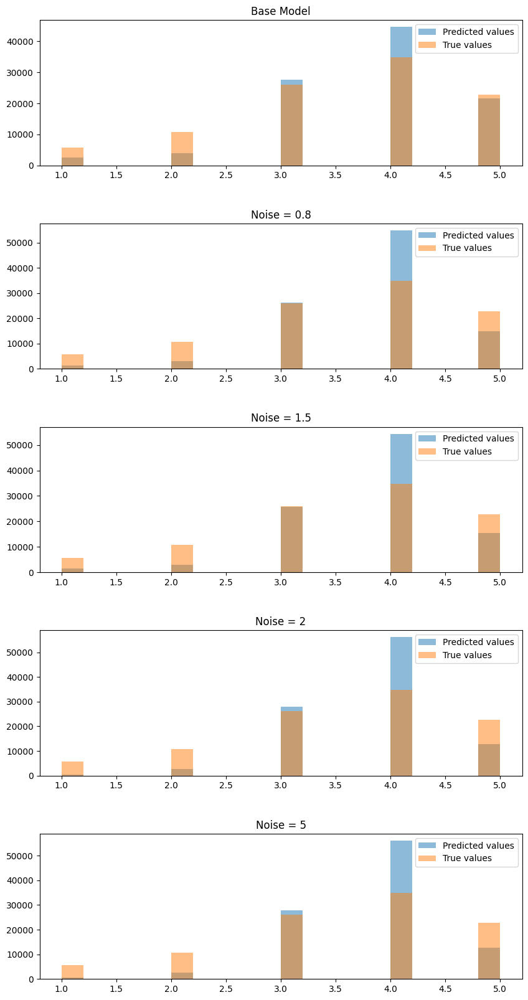

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(5, figsize=(10, 20))

# Adjust the distance between subplots
plt.subplots_adjust(hspace = 0.4)

# Base Model
axs[0].hist(y_pred_e100, bins=20, alpha=0.5, label='Predicted values')
axs[0].hist(y_true_e100, bins=20, alpha=0.5, label='True values')
axs[0].set_title('Base Model')
axs[0].legend(loc='upper right')

# Noise = 0.8
axs[1].hist(y_pred_dph8e100, bins=20, alpha=0.5, label='Predicted values')
axs[1].hist(y_true_dph8e100, bins=20, alpha=0.5, label='True values')
axs[1].set_title('Noise = 0.8')
axs[1].legend(loc='upper right')

# Noise = 1.5
axs[2].hist(y_pred_dp15e100, bins=20, alpha=0.5, label='Predicted values')
axs[2].hist(y_true_dp15e100, bins=20, alpha=0.5, label='True values')
axs[2].set_title('Noise = 1.5')
axs[2].legend(loc='upper right')

# Noise = 2
axs[3].hist(y_pred_dp2e100, bins=20, alpha=0.5, label='Predicted values')
axs[3].hist(y_true_dp2e100, bins=20, alpha=0.5, label='True values')
axs[3].set_title('Noise = 2')
axs[3].legend(loc='upper right')

# Noise = 5
axs[4].hist(y_pred_dp5e100, bins=20, alpha=0.5, label='Predicted values')
axs[4].hist(y_true_dp5e100, bins=20, alpha=0.5, label='True values')
axs[4].set_title('Noise = 5')
axs[4].legend(loc='upper right')

plt.show()




In [ ]:

# Create a dictionary to store the stats for each prediction array
stats = {}

# List of prediction arrays and their corresponding names
preds = [(y_pred_e100, 'Base DLRS (No Noise)'),
         (y_pred_dph8e100, 'DP (Noise 0.8 )'),
         (y_pred_dp15e100, 'DP (Noise 1.5 )'),
         (y_pred_dp2e100, 'DP (Noise 2)'),
         (y_pred_dp5e100, 'DP (Noise 5)')]

# Compute statistics for each prediction array
for pred, name in preds:
    stats[name] = {
        'mean': np.mean(pred),
        'median': np.median(pred),
        'std_dev': np.std(pred),
        'min': np.min(pred),
        'max': np.max(pred)
    }

# Convert the dictionary to a DataFrame for easier viewing
df_stats = pd.DataFrame(stats).T

print(df_stats)


                      mean  median  std_dev   min   max
Base DLRS (No Noise) 3.790   4.000    0.907 1.000 5.000
DP (Noise 0.8 )      3.791   4.000    0.772 1.000 5.000
DP (Noise 1.5 )      3.794   4.000    0.784 1.000 5.000
DP (Noise 2)         3.779   4.000    0.714 1.000 5.000
DP (Noise 5)         3.779   4.000    0.714 1.000 5.000


In [ ]:
from sklearn.metrics import classification_report

# Base Model
print("Base Model")
print(classification_report(y_true_e100, y_pred_e100))

# Noise = 0.8
print("Noise = 0.8")
print(classification_report(y_true_dph8e100, y_pred_dph8e100))

# Noise = 1.5
print("Noise = 1.5")
print(classification_report(y_true_dp15e100, y_pred_dp15e100))

# Noise = 2
print("Noise = 2")
print(classification_report(y_true_dp2e100, y_pred_dp2e100))

# Noise = 5
print("Noise = 5")
print(classification_report(y_true_dp5e100, y_pred_dp5e100))


Base Model
              precision    recall  f1-score   support

           1       0.57      0.25      0.35      5652
           2       0.39      0.14      0.21     10773
           3       0.41      0.43      0.42     26073
           4       0.46      0.59      0.52     34819
           5       0.53      0.50      0.51     22704

    accuracy                           0.46    100021
   macro avg       0.47      0.38      0.40    100021
weighted avg       0.46      0.46      0.45    100021

Noise = 0.8
              precision    recall  f1-score   support

           1       0.61      0.14      0.22      5651
           2       0.35      0.09      0.15     10769
           3       0.40      0.40      0.40     26071
           4       0.43      0.68      0.53     34812
           5       0.57      0.37      0.45     22697

    accuracy                           0.44    100000
   macro avg       0.47      0.34      0.35    100000
weighted avg       0.46      0.44      0.42    100000


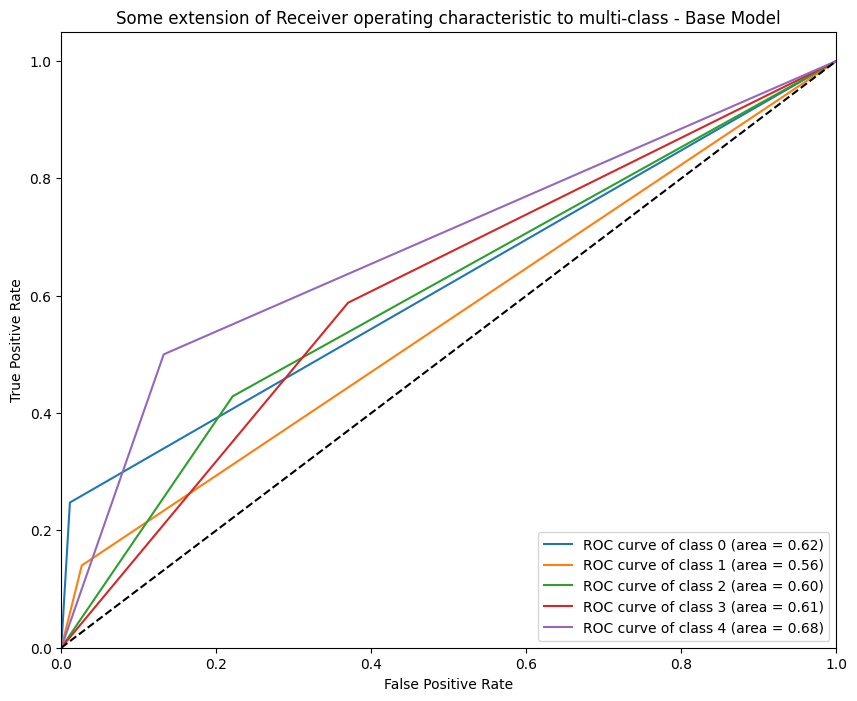

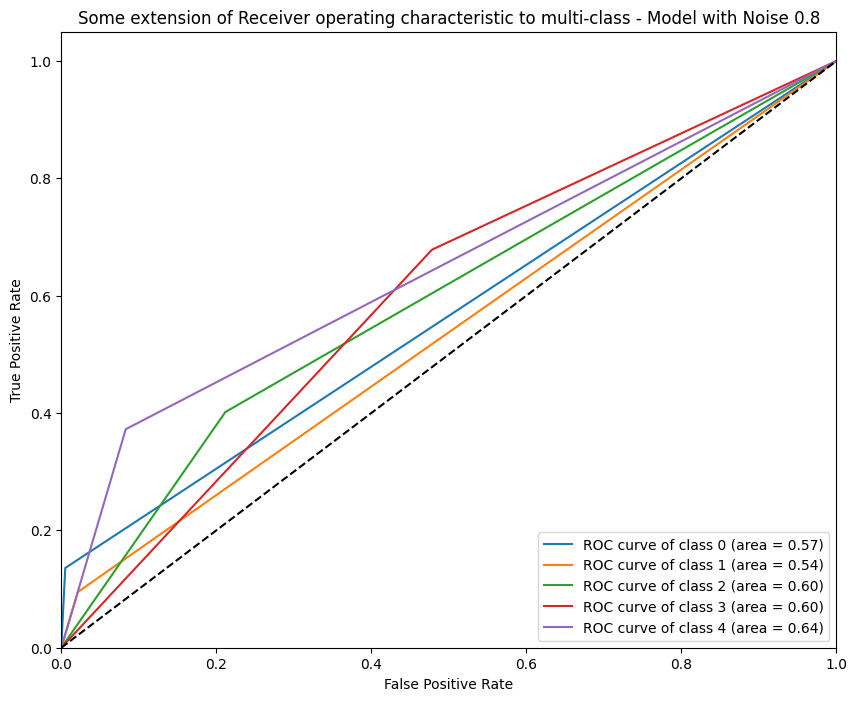

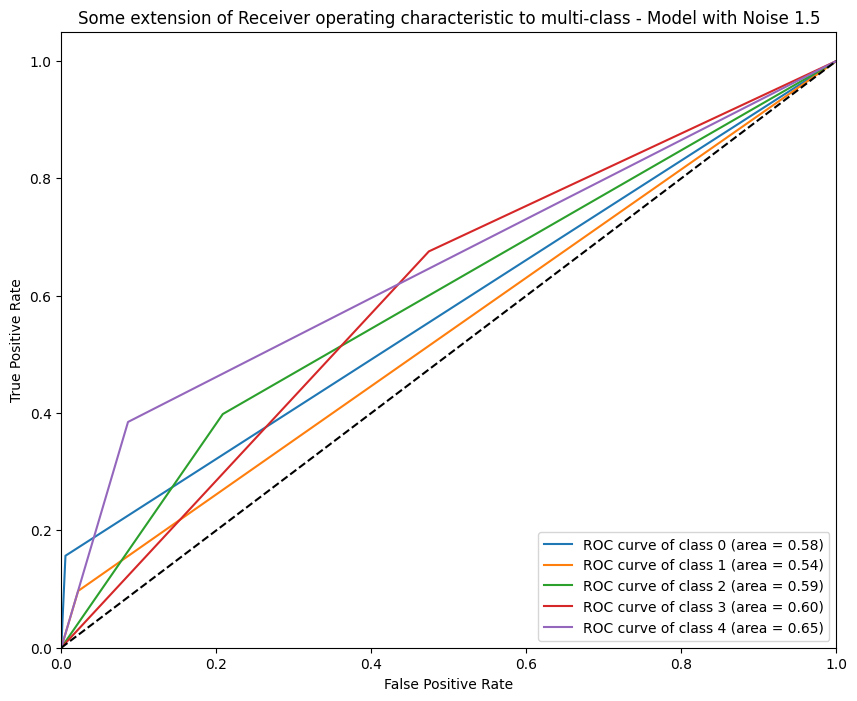

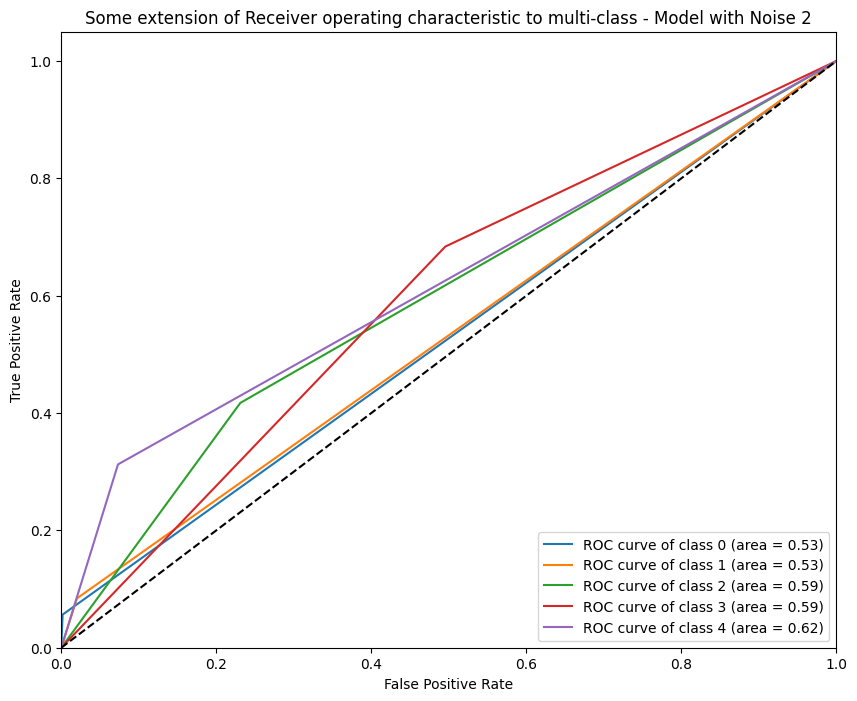

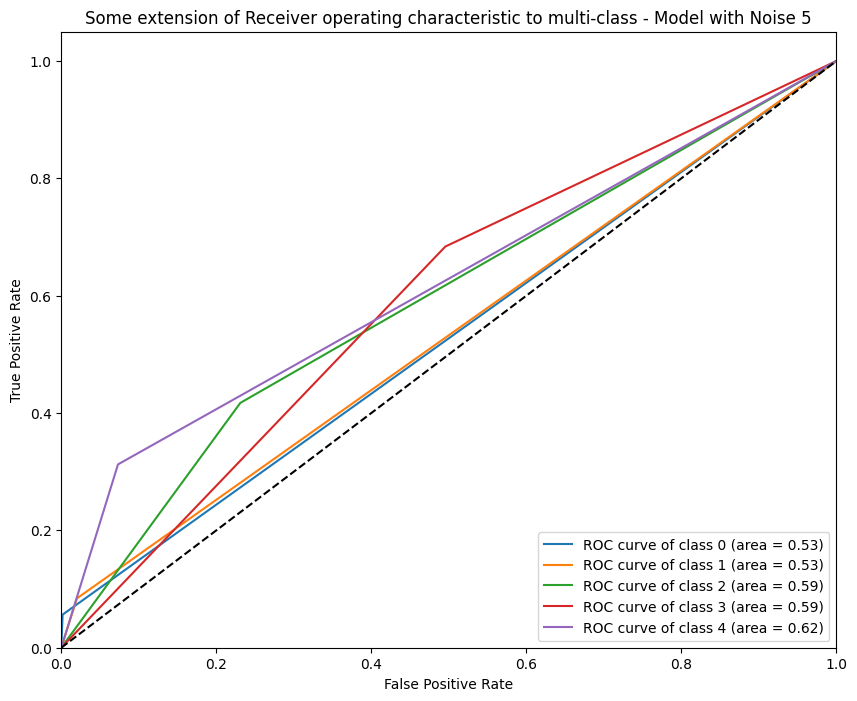

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Create a one-hot encoder object
onehot = OneHotEncoder(sparse=False)

# Reshape the 1-D country arrays to 2-D as fit_transform expects 2-D and fit the object
y_true_e100 = onehot.fit_transform(y_true_e100.reshape(-1, 1))
y_true_dph8e100 = onehot.transform(y_true_dph8e100.reshape(-1, 1))
y_true_dp15e100 = onehot.transform(y_true_dp15e100.reshape(-1, 1))
y_true_dp2e100 = onehot.transform(y_true_dp2e100.reshape(-1, 1))
y_true_dp5e100 = onehot.transform(y_true_dp5e100.reshape(-1, 1))

y_pred_e100 = onehot.transform(y_pred_e100.reshape(-1, 1))
y_pred_dph8e100 = onehot.transform(y_pred_dph8e100.reshape(-1, 1))
y_pred_dp15e100 = onehot.transform(y_pred_dp15e100.reshape(-1, 1))
y_pred_dp2e100 = onehot.transform(y_pred_dp2e100.reshape(-1, 1))
y_pred_dp5e100 = onehot.transform(y_pred_dp5e100.reshape(-1, 1))

# Base Model
try:
    plot_multiclass_roc_auc(y_true_e100, y_pred_e100, "Base Model")
except ValueError as e:
    print("Error in Base Model:", e)

# Model with Noise 0.8
try:
    plot_multiclass_roc_auc(y_true_dph8e100, y_pred_dph8e100, "Model with Noise 0.8")
except ValueError as e:
    print("Error in Model with Noise 0.8:", e)

# Model with Noise 1.5
try:
    plot_multiclass_roc_auc(y_true_dp15e100, y_pred_dp15e100, "Model with Noise 1.5")
except ValueError as e:
    print("Error in Model with Noise 1.5:", e)

# Model with Noise 2
try:
    plot_multiclass_roc_auc(y_true_dp2e100, y_pred_dp2e100, "Model with Noise 2")
except ValueError as e:
    print("Error in Model with Noise 2:", e)

# Model with Noise 5
try:
    plot_multiclass_roc_auc(y_true_dp5e100, y_pred_dp5e100, "Model with Noise 5")
except ValueError as e:
    print("Error in Model with Noise 5:", e)


In [ ]:
from sklearn.metrics import accuracy_score, mean_squared_error
import numpy as np

def calculate_metrics(y_true, y_pred, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    print(f"Metrics for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Root Mean Squared Error: {rmse:.2f}\n")

# Calculate metrics for each model
calculate_metrics(y_true_e100, y_pred_e100, "Base Model")
calculate_metrics(y_true_dph8e100, y_pred_dph8e100, "Model with Noise 0.8")
calculate_metrics(y_true_dp15e100, y_pred_dp15e100, "Model with Noise 1.5")
calculate_metrics(y_true_dp2e100, y_pred_dp2e100, "Model with Noise 2")
calculate_metrics(y_true_dp5e100, y_pred_dp5e100, "Model with Noise 5")


Metrics for Base Model:
Accuracy: 0.46
Mean Squared Error: 1.03
Root Mean Squared Error: 1.01

Metrics for Model with Noise 0.8:
Accuracy: 0.44
Mean Squared Error: 0.97
Root Mean Squared Error: 0.99

Metrics for Model with Noise 1.5:
Accuracy: 0.45
Mean Squared Error: 0.97
Root Mean Squared Error: 0.98

Metrics for Model with Noise 2:
Accuracy: 0.43
Mean Squared Error: 0.99
Root Mean Squared Error: 1.00

Metrics for Model with Noise 5:
Accuracy: 0.43
Mean Squared Error: 0.99
Root Mean Squared Error: 1.00



# Appendix: Save All Model Results

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


## 1) Base Model

In [ ]:
# Save entire model
model.save('/content/gdrive/My Drive/DLRS.h5')

# Save weights
model.save_weights('/content/gdrive/My Drive/DLRS_weights.h5')

# Save Training
import json

baseDLRS_training = pd.DataFrame(DLRS.history)
baseDLRS_training_json_file = '/content/gdrive/My Drive/baseDLRS_training.json'
with open(baseDLRS_training_json_file, mode='w') as f:
    baseDLRS_training.to_json(f)

# Save Predictions
preds = pd.DataFrame({"y_true": y_true, "y_pred": y_pred})

preds.to_csv('/content/gdrive/My Drive/preds.csv', index=False)

## 2) DP Noise = 0.8

In [ ]:
# Save entire model
dph8_model.save('/content/gdrive/My Drive/dph8_model.h5')

# Save weights
dph8_model.save_weights('/content/gdrive/My Drive/dph8_model_weights.h5')

# Save Training
import json

dph8_training = pd.DataFrame(dph8.history)

dph8_training_json_file = '/content/gdrive/My Drive/dph8_training.json'
with open(dph8_training_json_file, mode='w') as f:
    dph8_training.to_json(f)

# Save Predictions
preds_dph8 = pd.DataFrame({"y_true_dph8": y_true_dph8, "y_pred_dph8": y_pred_dph8})

preds_dph8.to_csv('/content/gdrive/My Drive/preds_dph8.csv', index=False)

## 3) DP Noise = 2

In [ ]:
# Save entire model
dp_model.save('/content/gdrive/My Drive/dp_model.h5')

# Save weights
dp_model.save_weights('/content/gdrive/My Drive/dp_model_weights.h5')

# Save Training
import json

dp2_training = pd.DataFrame(dp2.history)

dp2_json_file = '/content/gdrive/My Drive/dp2_training.json'
with open(dp2_json_file, mode='w') as f:
    dp2_training.to_json(f)


# Save Predictions
preds_dp2 = pd.DataFrame({"y_true_dp2": y_true_dp2, "y_pred_dp2": y_pred_dp2})

preds_dp2.to_csv('/content/gdrive/My Drive/preds_dp2.csv', index=False)

## 4) DP Noise = 5

In [ ]:
# Save entire model
dp5_model.save('/content/gdrive/My Drive/dp5_model.h5')

# Save weights
dp5_model.save_weights('/content/gdrive/My Drive/dp5_model_weights.h5')

# Save Training
import json

dp5_training = pd.DataFrame(dp5.history)

dp5_json_file = '/content/gdrive/My Drive/dp5_training.json'
with open(dp5_json_file, mode='w') as f:
    dp5_training.to_json(f)

# Save Predictions
preds_dp2 = pd.DataFrame({"y_true_dp2": y_true_dp2, "y_pred_dp2": y_pred_dp2})

preds_dp2.to_csv('/content/gdrive/My Drive/preds_dp2.csv', index=False)